## Final Project Submission

Please fill out:
* Student name: Mindy Jen
* Student pace: full time
* Scheduled project review date/time: TBD
* Instructor name: Abhineet Kulkarni 
* Blog post URL: TBD


# obtaining data

In [140]:
# Your code here - remember to use markdown cells for comments as well!
# Import statements go here
import pandas as pd
import numpy as np
import math
import scipy.stats as stats
from scipy.stats import pearsonr
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.metrics import r2_score

from warnings import filterwarnings
filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn')
import seaborn as sns
sns.set(style="darkgrid", color_codes=True)

kc = pd.read_csv('kc_house_data.csv',index_col=None,encoding='latin1')
kc.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


## retrieve data information

In [2]:
kc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


# scrubbing and cleaning Data

## run timestamp data conversion  

In [3]:
def general_datetime_converter(df, col):
    df_clone = df.copy()
    df_clone[col] = pd.to_datetime(df_clone[col])
    return df_clone

kc2 = general_datetime_converter(kc, 'date')
kc2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: datetime64[ns](1), float64(8), int64(11), object(1)
memory 

## read missing and symbolic values

In [4]:
def check_cols(df):
    for col in df.columns:
        print('------------------------------------------------------')
        print(col)
        print(f'unique values: {df[col].nunique(dropna=False)} (\'NaN\' included)')
        print(f'NaN exists? {df[col].isna().any()}')
        if df[col].isna().any():
            print(f'how many \'NaN\' values? {df[col].isna().sum()} ({np.divide(df[col].isna().sum(),df.shape[0])*100:.2f}%)')
        print('------------------------------------------------------')
        print(df[col].value_counts(dropna=False, normalize=True))
        print('------------------------------------------------------')
        print('\n') # Break up the output between columns
        
    return None

check_cols(kc2)

------------------------------------------------------
id
unique values: 21420 ('NaN' included)
NaN exists? False
------------------------------------------------------
795000620     0.000139
1825069031    0.000093
2019200220    0.000093
7129304540    0.000093
1781500435    0.000093
                ...   
7812801125    0.000046
4364700875    0.000046
3021059276    0.000046
880000205     0.000046
1777500160    0.000046
Name: id, Length: 21420, dtype: float64
------------------------------------------------------


------------------------------------------------------
date
unique values: 372 ('NaN' included)
NaN exists? False
------------------------------------------------------
2014-06-23    0.006575
2014-06-25    0.006066
2014-06-26    0.006066
2014-07-08    0.005880
2015-04-27    0.005834
                ...   
2014-07-27    0.000046
2015-03-08    0.000046
2014-11-02    0.000046
2015-05-15    0.000046
2015-05-24    0.000046
Name: date, Length: 372, dtype: float64
-------------------

Name: lat, Length: 5033, dtype: float64
------------------------------------------------------


------------------------------------------------------
long
unique values: 751 ('NaN' included)
NaN exists? False
------------------------------------------------------
-122.290    0.005325
-122.300    0.005140
-122.362    0.004815
-122.291    0.004630
-122.372    0.004584
              ...   
-121.403    0.000046
-121.804    0.000046
-121.726    0.000046
-121.895    0.000046
-121.893    0.000046
Name: long, Length: 751, dtype: float64
------------------------------------------------------


------------------------------------------------------
sqft_living15
unique values: 777 ('NaN' included)
NaN exists? False
------------------------------------------------------
1540    0.009122
1440    0.009029
1560    0.008890
1500    0.008334
1460    0.007825
          ...   
4890    0.000046
2873    0.000046
952     0.000046
3193    0.000046
2049    0.000046
Name: sqft_living15, Length: 777, dtype: 

## remove erratic symbols

In [5]:
# Your code here - Manipulate column names
subs = [(' ','_'),('.',''),("'",""),('®',''),('Â',''),('â\x84¢',''),('+','plus'),('½','half'),('-','_')]

def transform_colname(df):
    df_clone = df.copy()
    cols_rename = []
    for col in df_clone.columns:
        for old, new in subs:
            col = col.replace(old,new)
        cols_rename.append(col)
    df_clone.columns = cols_rename
    return df_clone

In [6]:
def convert_obj_to_num(df, col):
    df_clone = df.copy()
    if df_clone[col].dtype == 'object':
        df_clone[col] = df_clone[col].replace({'?':np.NaN}).astype('float64')
    return df_clone

kc3 = convert_obj_to_num(kc2, 'sqft_basement')
kc3.dtypes

id                        int64
date             datetime64[ns]
price                   float64
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront              float64
view                    float64
condition                 int64
grade                     int64
sqft_above                int64
sqft_basement           float64
yr_built                  int64
yr_renovated            float64
zipcode                   int64
lat                     float64
long                    float64
sqft_living15             int64
sqft_lot15                int64
dtype: object

## replace missing values

In [7]:
def find_null_cols(df):
    df_clone = df.copy()
    print('\'NaN\' found in columns as follows:')
    for col in df_clone.columns:
        if (df_clone[col].isnull().any()) | (df_clone[col].isna().any()):
            print(f'\t{col:30} contains {df_clone[col].isna().sum():10} null values ({df_clone[col].isna().sum()*100/df_clone.shape[0]:5.2f}%) !')
    return None

find_null_cols(kc3)

'NaN' found in columns as follows:
	waterfront                     contains       2376 null values (11.00%) !
	view                           contains         63 null values ( 0.29%) !
	sqft_basement                  contains        454 null values ( 2.10%) !
	yr_renovated                   contains       3842 null values (17.79%) !


### continuous features

In [8]:
def fill_null_cols(df, col, nullified=False):
    df_clone = df.copy()
    if nullified:
        df_clone[col] = df_clone[col].fillna(0)
    else:
        try:
            median = df_clone[col].median()
            mean = df_clone[col].mean()
            print(f'{col}: median {median:.3f}, mean {mean:.3f}')
            if median > 0:
                df_clone[col] = df_clone[col].fillna(median)
            else:
                df_clone[col] = df_clone[col].fillna(mean)
        except:
            print('N/A')
    return df_clone

In [9]:
kc4 = fill_null_cols(kc3, 'sqft_basement', nullified=False)
kc4.sqft_basement.isna().any()

sqft_basement: median 0.000, mean 291.852


False

In [10]:
kc5 = fill_null_cols(kc4, 'yr_renovated', nullified=True)
print(kc5.yr_renovated.isna().any())
kc5.yr_renovated.unique()

False


array([   0., 1991., 2002., 2010., 1992., 2013., 1994., 1978., 2005.,
       2003., 1984., 1954., 2014., 2011., 1983., 1945., 1990., 1988.,
       1977., 1981., 1995., 2000., 1999., 1998., 1970., 1989., 2004.,
       1986., 2007., 1987., 2006., 1985., 2001., 1980., 1971., 1979.,
       1997., 1950., 1969., 1948., 2009., 2015., 1974., 2008., 1968.,
       2012., 1963., 1951., 1962., 1953., 1993., 1996., 1955., 1982.,
       1956., 1940., 1976., 1946., 1975., 1964., 1973., 1957., 1959.,
       1960., 1967., 1965., 1934., 1972., 1944., 1958.])

### discrete, categorical features

In [11]:
def replace_null_cols(df, col, obj=False):
    df_clone = df.copy()
    if obj:
        df_clone[col] = df_clone[col].fillna('unknown')
    else:
        #df_clone[col] = df_clone[col].fillna(-1)
        # Thomas T. 
        df_clone[col] = df_clone[col].fillna(0)
    return df_clone

In [12]:
kc6 = replace_null_cols(kc5, 'waterfront', obj=False)
kc6.waterfront.isna().any()

False

In [13]:
kc7 = replace_null_cols(kc6, 'view', obj=False)
kc7.view.isna().any()

False

In [14]:
def transform_col_to_binary(df, col, colrename):
    df_clone = df.copy()
    df_clone[colrename] = df_clone[col]
    for idx in range(df_clone.shape[0]):
        if df_clone.loc[idx,colrename] > 0:
            df_clone.loc[idx,colrename] = 1
            
    return df_clone

In [15]:
kc7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: datetime64[ns](1), float64(9), int64(11)
memory usage: 3.5

In [16]:
kc8 = transform_col_to_binary(kc7, 'yr_renovated', 'hasrenovated')
print('any NaN?',kc8.hasrenovated.isna().sum())
print(kc8.hasrenovated.nunique())
print('after:',kc8.hasrenovated.unique())
print('before:',kc8.yr_renovated.unique())

any NaN? 0
2
after: [0. 1.]
before: [   0. 1991. 2002. 2010. 1992. 2013. 1994. 1978. 2005. 2003. 1984. 1954.
 2014. 2011. 1983. 1945. 1990. 1988. 1977. 1981. 1995. 2000. 1999. 1998.
 1970. 1989. 2004. 1986. 2007. 1987. 2006. 1985. 2001. 1980. 1971. 1979.
 1997. 1950. 1969. 1948. 2009. 2015. 1974. 2008. 1968. 2012. 1963. 1951.
 1962. 1953. 1993. 1996. 1955. 1982. 1956. 1940. 1976. 1946. 1975. 1964.
 1973. 1957. 1959. 1960. 1967. 1965. 1934. 1972. 1944. 1958.]


In [17]:
kc9 = transform_col_to_binary(kc8, 'sqft_basement', 'hasbasement')
print('any NaN?',kc9.hasbasement.isna().sum())
print(kc9.hasbasement.nunique())
print('after:',kc9.hasbasement.unique())
print('before:',kc9.sqft_basement.unique())

any NaN? 0
2
after: [0. 1.]
before: [   0.          400.          910.         1530.          291.85172397
  730.         1700.          300.          970.          760.
  720.          700.          820.          780.          790.
  330.         1620.          360.          588.         1510.
  410.          990.          600.          560.          550.
 1000.         1600.          500.         1040.          880.
 1010.          240.          265.          290.          800.
  540.          710.          840.          380.          770.
  480.          570.         1490.          620.         1250.
 1270.          120.          650.          180.         1130.
  450.         1640.         1460.         1020.         1030.
  750.          640.         1070.          490.         1310.
  630.         2000.          390.          430.          850.
  210.         1430.         1950.          440.          220.
 1160.          860.          580.         2060.         1820.
 1180.     

In [18]:
def combine_cols_to_binary(df, cola, colb, colrename):
    df_clone = df.copy()
    df_clone[colrename] = df_clone[cola]
    for idx in range(df_clone.shape[0]):
        if df_clone.loc[idx,colrename] > df_clone.loc[idx,colb]:
            df_clone.loc[idx,colrename] = 1
        else:
            df_clone.loc[idx,colrename] = 0
            
    return df_clone

In [20]:
kc10 = combine_cols_to_binary(kc9, 'sqft_living', 'sqft_living15', 'hasbiggerliving')
print('any NaN?',kc10.hasbiggerliving.isna().sum())
print(kc10.hasbiggerliving.nunique())
print(kc10.hasbiggerliving.unique())

any NaN? 0
2
[0 1]


In [21]:
kc11 = combine_cols_to_binary(kc10, 'sqft_lot', 'sqft_lot15', 'hasbiggerlot')
print('any NaN?',kc11.hasbiggerliving.isna().sum())
print(kc11.hasbiggerlot.nunique())
print(kc11.hasbiggerlot.unique())

any NaN? 0
2
[0 1]


## remove duplications

In [22]:
def check_remove_duplicated_data(df):
    df_clone = df.copy()
    #df_clone['is_duplicated'] = df_clone.duplicated(subset=None, keep='first')
    do_drop = '0'
    for col in df_clone.columns:
        print(f'{col} contains duplications?')
        if df_clone[col].duplicated().value_counts(normalize=True, sort=False)[0] == 1:
            print('Nope!')
        else:
            print(f'Yes, how much? {df_clone[col].duplicated().value_counts(normalize=True, sort=False)[1]}')
            do_drop = input('drop? enter 1 (\'True\') or 0 (\'False\')')
            if do_drop == '1':
                df_clone[col+'_korg'] = df_clone[col]
                #df_clone[col] = df_clone[col].drop_duplicates(keep='first') 
                # Thomas T.
                df_clone[col] = df_clone[col].drop_duplicates(keep='last')
                print(f' duplications in {col} dropped ... ')
            else:
                print(f' skip {col} ... ')
        print('---------------------------------------------------------------------------')
    return df_clone

removal of duplications column-by-column ; uncomment lines below

In [23]:
#kc9 = check_remove_duplicated_data(kc8)
#kc9.columns

## remove extreme outliers

In [24]:
def remove_outliers(df):
    df_clone = df.copy()
    cuts = []
    do_work = '0'
    do_cut = '0'
    read_cut = '0'
    for col in df_clone.columns:
        print('\n')
        print('***************************************************************************')
        print(f'{col} (data type: {df_clone[col].dtype}):')
        print(f'>>>>>> remaining data size {df_clone.shape[0]} wrt {df.shape[0]}')
        print(f'>>>>>> Percent remained (previous cuts applied): {round(df_clone.shape[0]/df.shape[0],3)}')
        do_work = input('wanna continue? enter 1 (\'True\') or 0 (\'False\')')
        if do_work == '1':
            print ('----------------------------------------------------------------------')
            print(df_clone[col].value_counts(dropna=False,normalize=True))
            print ('----------------------------------------------------------------------')
            q75, q25 = np.percentile(df_clone[col], [75 ,25])
            iqr = q75 - q25
            minVal = q25 - (1.73 * iqr)
            maxVal = q75 + (1.73 * iqr)
            print(f'*** IQR: {iqr:.6f} ********* ')
            print(f'*** minValue: {minVal:.6f} *** ')
            print(f'*** maxValue: {maxVal:.6f} *** ')
            print('-----------------------------------------------------------------------')
            do_cut = input('make cut? enter 1 (\'True\') or 0 (\'False\')')
            if (maxVal == minVal) & (do_cut == '1'):
                do_cut = 0
                print('minimal and maximal values are the same. cut not recommended.')
            if do_cut == '1':
                print(f'\tcut on {col} applied ... ')
                try:
                    orig_tot = df.shape[0]
                    df_cut = df_clone.copy()
                    df_cut = df_clone[(df_clone[col]<minVal) | (df_clone[col]>maxVal)]
                    df_clone = df_clone[(df_clone[col]>minVal) & (df_clone[col]<maxVal)]
                    print(f'\tPercent removed: {round(df_cut.shape[0]/orig_tot,3)}')
                    cuts.append([col,round(minVal,6),round(maxVal,6),round(df_clone.shape[0]/df.shape[0],3),round(df_cut.shape[0]/orig_tot,3)])
                except Exception as e:
                    print('\t\t>>> Sorry! ',e)
            else:
                print(f'\tskip {col} ... ')
                read_cut = input('\tbut... wanna read cut? enter 1 (\'True\') or 0 (\'False\')')
                if read_cut == '1':
                    df_kept = df_clone.copy()
                    try:
                        orig_tot = df_clone.shape[0]
                        df_cut = df_clone.copy()
                        df_cut = df_clone[(df_clone[col]<minVal) | (df_clone[col]>maxVal)]
                        df_clone = df_clone[(df_clone[col]>minVal) & (df_clone[col]<maxVal)]
                        print(f'\tPercent removed: {round(df_cut.shape[0]/orig_tot,3)}')
                        cuts.append([col,round(minVal,6),round(maxVal,6),round(df_clone.shape[0]/df.shape[0],3),round(df_cut.shape[0]/orig_tot,3)])
                    except Exception as e:
                        print('\t\t>>> Sorry! ',e)
                    df_clone = df_kept.copy()
                else:
                    cuts.append([col,0.,0.,0.,0.])
        else:
            cuts.append([col,0.,0.,0.,0.])
            continue
        input("Press Enter to continue...")
    return cuts, df_clone

removal of extreme outliers (Q1 - 1.73 * IQR , Q3 + 1.73 * IQR) column-by-column ; uncomment lines below

**recreate another completely identical data-frame where outlier removal process is applied to columns exclusively for EDA studies**   

In [26]:
results, kc_eda = remove_outliers(kc11)
print(kc_eda.columns)
results



***************************************************************************
id (data type: int64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
date (data type: datetime64[ns]):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
price (data type: float64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
bedrooms (data type: int64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('Fal

wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
yr_renovated (data type: float64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts applied): 0.888
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
zipcode (data type: int64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts applied): 0.888
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
lat (data type: float64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts applied): 0.888
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
long (data type: float64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts 

[['id', 0.0, 0.0, 0.0, 0.0],
 ['date', 0.0, 0.0, 0.0, 0.0],
 ['price', 0.0, 0.0, 0.0, 0.0],
 ['bedrooms', 1.27, 5.73, 0.975, 0.025],
 ['bathrooms', 0.4525, 3.7975, 0.961, 0.015],
 ['sqft_living', 0.0, 0.0, 0.0, 0.0],
 ['sqft_lot', 0.0, 0.0, 0.0, 0.0],
 ['floors', -0.73, 3.73, 0.961, 0.0],
 ['waterfront', 0.0, 0.0, 0.0, 0.006],
 ['view', 0.0, 0.0, 0.0, 0.092],
 ['condition', 1.27, 5.73, 0.96, 0.001],
 ['grade', 5.27, 9.73, 0.888, 0.071],
 ['sqft_above', 0.0, 0.0, 0.0, 0.0],
 ['sqft_basement', 0.0, 0.0, 0.0, 0.0],
 ['yr_built', 0.0, 0.0, 0.0, 0.0],
 ['yr_renovated', 0.0, 0.0, 0.0, 0.0],
 ['zipcode', 0.0, 0.0, 0.0, 0.0],
 ['lat', 0.0, 0.0, 0.0, 0.0],
 ['long', 0.0, 0.0, 0.0, 0.0],
 ['sqft_living15', 0.0, 0.0, 0.0, 0.0],
 ['sqft_lot15', 0.0, 0.0, 0.0, 0.0],
 ['hasrenovated', 0.0, 0.0, 0.0, 0.033],
 ['hasbasement', -1.73, 2.73, 0.888, 0.0],
 ['hasbiggerliving', -1.73, 2.73, 0.888, 0.0],
 ['hasbiggerlot', -1.73, 2.73, 0.888, 0.0]]

## feature manipulation for modeling

In [27]:
kc11[kc11['yr_renovated']<kc11['date'].dt.year].date.dt.year.isna().any()

False

In [28]:
kc11['yr_sold'] = kc11['date'].dt.year
kc11['mo_sold'] = kc11['date'].dt.month
kc11['sqft_tot'] = kc11['sqft_above'] + kc11['sqft_basement']
kc11['yr_sdiff'] = kc11['yr_sold'] - kc11['yr_built']
kc11['yr_rdiff'] = kc11['yr_renovated'] - kc11['yr_built']
kc11['yr_srdif'] = kc11['yr_sold'] - kc11['yr_renovated']
print(kc11.dtypes)
kc11.head()

id                          int64
date               datetime64[ns]
price                     float64
bedrooms                    int64
bathrooms                 float64
sqft_living                 int64
sqft_lot                    int64
floors                    float64
waterfront                float64
view                      float64
condition                   int64
grade                       int64
sqft_above                  int64
sqft_basement             float64
yr_built                    int64
yr_renovated              float64
zipcode                     int64
lat                       float64
long                      float64
sqft_living15               int64
sqft_lot15                  int64
hasrenovated              float64
hasbasement               float64
hasbiggerliving             int64
hasbiggerlot                int64
yr_sold                     int64
mo_sold                     int64
sqft_tot                  float64
yr_sdiff                    int64
yr_rdiff      

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold,sqft_tot,yr_sdiff,yr_rdiff,yr_srdif
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,0.0,0.0,0,0,2014,10,1180.0,59,-1955.0,2014.0
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,1.0,1.0,1,0,2014,12,2570.0,63,40.0,23.0
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,0.0,0.0,0,1,2015,2,770.0,82,-1933.0,2015.0
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,0.0,1.0,1,0,2014,12,1960.0,49,-1965.0,2014.0
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,0.0,0.0,0,1,2015,2,1680.0,28,-1987.0,2015.0


Note: if any additional columns are created in order to keep copies of their original data after the duplication data removal process (see above) is done, and these columns are considered to be useless in EDA and modeling, please remember to account for dropping them from data-frame.

In [29]:
kc12 = kc11.drop(['date','sqft_basement','yr_renovated','id','sqft_living15','sqft_lot15'],axis=1)
kc12.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold,sqft_tot,yr_sdiff,yr_rdiff,yr_srdif
0,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,3,7,...,0.0,0.0,0,0,2014,10,1180.0,59,-1955.0,2014.0
1,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,...,1.0,1.0,1,0,2014,12,2570.0,63,40.0,23.0
2,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,...,0.0,0.0,0,1,2015,2,770.0,82,-1933.0,2015.0
3,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,...,0.0,1.0,1,0,2014,12,1960.0,49,-1965.0,2014.0
4,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,...,0.0,0.0,0,1,2015,2,1680.0,28,-1987.0,2015.0


## feature manipulation for EDA

In [30]:
kc_eda['yr_sold'] = kc_eda['date'].dt.year
kc_eda['mo_sold'] = kc_eda['date'].dt.month
kc_eda['sqft_tot'] = kc_eda['sqft_above'] + kc_eda['sqft_basement']
kc_eda['yr_sdiff'] = kc_eda['yr_sold'] - kc_eda['yr_built']
kc_eda['yr_rdiff'] = kc_eda['yr_renovated'] - kc_eda['yr_built']
kc_eda['yr_srdif'] = kc_eda['yr_sold'] - kc_eda['yr_renovated']
print(kc_eda.dtypes)
kc_eda.head()

id                          int64
date               datetime64[ns]
price                     float64
bedrooms                    int64
bathrooms                 float64
sqft_living                 int64
sqft_lot                    int64
floors                    float64
waterfront                float64
view                      float64
condition                   int64
grade                       int64
sqft_above                  int64
sqft_basement             float64
yr_built                    int64
yr_renovated              float64
zipcode                     int64
lat                       float64
long                      float64
sqft_living15               int64
sqft_lot15                  int64
hasrenovated              float64
hasbasement               float64
hasbiggerliving             int64
hasbiggerlot                int64
yr_sold                     int64
mo_sold                     int64
sqft_tot                  float64
yr_sdiff                    int64
yr_rdiff      

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold,sqft_tot,yr_sdiff,yr_rdiff,yr_srdif
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,0.0,0.0,0,0,2014,10,1180.0,59,-1955.0,2014.0
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,1.0,1.0,1,0,2014,12,2570.0,63,40.0,23.0
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,0.0,0.0,0,1,2015,2,770.0,82,-1933.0,2015.0
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,0.0,1.0,1,0,2014,12,1960.0,49,-1965.0,2014.0
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,0.0,0.0,0,1,2015,2,1680.0,28,-1987.0,2015.0


In [31]:
kc_eda = kc_eda.drop(['date','sqft_basement','yr_renovated','id','sqft_living15','sqft_lot15'],axis=1)
kc_eda.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold,sqft_tot,yr_sdiff,yr_rdiff,yr_srdif
0,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,3,7,...,0.0,0.0,0,0,2014,10,1180.0,59,-1955.0,2014.0
1,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,...,1.0,1.0,1,0,2014,12,2570.0,63,40.0,23.0
2,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,...,0.0,0.0,0,1,2015,2,770.0,82,-1933.0,2015.0
3,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,...,0.0,1.0,1,0,2014,12,1960.0,49,-1965.0,2014.0
4,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,...,0.0,0.0,0,1,2015,2,1680.0,28,-1987.0,2015.0


# pre-processing data: prepared for feature engineering
## for EDA

In [32]:
def combine_vars(df, col, read=True):
    df_clone = df.copy()
    df_clone[col] = sorted(df_clone[col])
    
    print(f'no. unique variables in {col}: {df_clone[col].nunique()}')
    if read:
        print(f'unique values as follows: {df_clone[col].unique()}')
    
    q_0 = float(df_clone[col].min())
    q_5 = df_clone[col].quantile(q=0.05)
    q_25 = df_clone[col].quantile(q=0.25)
    q_50 = df_clone[col].median()
    q_75 = df_clone[col].quantile(q=0.75)
    q_95 = df_clone[col].quantile(q=0.95)
    q_100 = float(df_clone[col].max())
            
    print(f'q0={q_0} , q5={q_5} , q25={q_25} , q50={q_50} , q75={q_75} , q95={q_95} , q100={q_100}')
    print('size:',df_clone[col].shape[0])
    
    for idx, row in df_clone.iterrows():
        if (row[col] >= q_0) & (row[col] < q_5):
            df_clone.loc[idx,col] = q_0
        elif (row[col] >= q_5) & (row[col] <= q_25):
            df_clone.loc[idx,col] = (q_5 + q_25) / 2
        elif (row[col] > q_25) & (row[col] <= q_50):
            df_clone.loc[idx,col] = (q_25 + q_50) / 2
        elif (row[col] > q_50) & (row[col] <= q_75):
            df_clone.loc[idx,col] = (q_50 + q_75) / 2
        elif (row[col] > q_75) & (row[col] <= q_95):
            df_clone.loc[idx,col] = (q_75 + q_95) / 2 
        elif (row[col] > q_95) & (row[col] <= q_100):
            df_clone.loc[idx,col] = q_100
        else:
            print('sth.',row[col],'not included!')
    
    df_clone[col] = df_clone[col].apply(np.ceil) # or np.floor
    
    return df_clone

### size reduction for discrete feature: date (from 12 to 5)

In [33]:
kc_eda['mo_sold_eda'] = kc_eda['mo_sold']
kc_eda = combine_vars(kc_eda, 'mo_sold_eda', True)
print('original:',kc_eda.mo_sold.unique())
print('eda:',kc_eda.mo_sold_eda.unique())

no. unique variables in mo_sold_eda: 12
unique values as follows: [ 1  2  3  4  5  6  7  8  9 10 11 12]
q0=1.0 , q5=2.0 , q25=4.0 , q50=6.0 , q75=9.0 , q95=12.0 , q100=12.0
size: 19181
original: [10 12  2  6  1  4  3  5  7  8 11  9]
eda: [ 1.  3.  5.  8. 11.]


### size reduction for other discrete features

* view (from 5 to 3)
* waterfront (from 2 to 2)
* bathrooms (from 14 to 4)
* bedrooms (from 4 to 4)
* floors (from 6 to 3)

In [34]:
kc_eda['view_eda'] = kc_eda['view']
kc_eda = combine_vars(kc_eda, 'view_eda', True)
kc_eda.view_eda.unique()

no. unique variables in view_eda: 5
unique values as follows: [0. 1. 2. 3. 4.]
q0=0.0 , q5=0.0 , q25=0.0 , q50=0.0 , q75=0.0 , q95=2.0 , q100=4.0
size: 19181


array([0., 1., 4.])

In [35]:
kc_eda['waterfront_eda'] = kc_eda['waterfront']
kc_eda = combine_vars(kc_eda, 'waterfront_eda', True)
kc_eda.waterfront_eda.unique()

no. unique variables in waterfront_eda: 2
unique values as follows: [0. 1.]
q0=0.0 , q5=0.0 , q25=0.0 , q50=0.0 , q75=0.0 , q95=0.0 , q100=1.0
size: 19181


array([0., 1.])

In [36]:
kc_eda['bathrooms_eda'] = kc_eda['bathrooms']
kc_eda = combine_vars(kc_eda, 'bathrooms_eda', True)
kc_eda.bathrooms_eda.unique()

no. unique variables in bathrooms_eda: 14
unique values as follows: [0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5  3.75]
q0=0.5 , q5=1.0 , q25=1.5 , q50=2.0 , q75=2.5 , q95=3.0 , q100=3.75
size: 19181


array([1., 2., 3., 4.])

In [37]:
kc_eda['bedrooms_eda'] = kc_eda['bedrooms']
kc_eda = combine_vars(kc_eda, 'bedrooms', True)
kc_eda.bedrooms_eda.unique()

no. unique variables in bedrooms: 4
unique values as follows: [2 3 4 5]
q0=2.0 , q5=2.0 , q25=3.0 , q50=3.0 , q75=4.0 , q95=5.0 , q100=5.0
size: 19181


array([3, 2, 4, 5], dtype=int64)

In [38]:
kc_eda['floors_eda'] = kc_eda['floors']
kc_eda = combine_vars(kc_eda, 'floors_eda', True)
kc_eda.floors_eda.unique()

no. unique variables in floors_eda: 6
unique values as follows: [1.  1.5 2.  2.5 3.  3.5]
q0=1.0 , q5=1.0 , q25=1.0 , q50=1.0 , q75=2.0 , q95=2.0 , q100=3.5
size: 19181


array([1., 2., 4.])

### size reduction for categorical features

* condition (from 4 to 4)
* grade (from 4 to 3)

In [39]:
kc_eda['condition_eda'] = kc_eda['condition']
kc_eda = combine_vars(kc_eda, 'condition_eda', True)
kc_eda.condition_eda.unique()

no. unique variables in condition_eda: 4
unique values as follows: [2 3 4 5]
q0=2.0 , q5=3.0 , q25=3.0 , q50=3.0 , q75=4.0 , q95=5.0 , q100=5.0
size: 19181


array([2., 3., 4., 5.])

In [40]:
kc_eda['grade_eda'] = kc_eda['grade']
kc_eda = combine_vars(kc_eda, 'grade_eda', True)
kc_eda.grade_eda.unique()

no. unique variables in grade_eda: 4
unique values as follows: [6 7 8 9]
q0=6.0 , q5=6.0 , q25=7.0 , q50=7.0 , q75=8.0 , q95=9.0 , q100=9.0
size: 19181


array([7., 8., 9.])

### size reduction for continuous features

In [41]:
kc_eda['lat_eda'] = kc_eda['lat']
kc_eda['lat_eda'] = kc_eda['lat_eda'] * 100000
kc_eda = combine_vars(kc_eda, 'lat_eda', False)
kc_eda['lat_eda'] /= 100000
kc_eda.lat_eda.unique()

no. unique variables in lat_eda: 4956
q0=4715590.0 , q5=4730890.0 , q25=4745830.0 , q50=4756860.0 , q75=4768010.0 , q95=4775120.0 , q100=4777760.0
size: 19181


array([47.1559 , 47.3836 , 47.51345, 47.62435, 47.71565, 47.7776 ])

In [42]:
kc_eda['long_eda'] = kc_eda['long']
kc_eda['long_eda'] = kc_eda['long_eda'] * 1000
kc_eda = combine_vars(kc_eda, 'long_eda', False)
kc_eda['long_eda'] /= 1000
kc_eda.long_eda.unique()

no. unique variables in long_eda: 736
q0=-122518.99999999999 , q5=-122387.0 , q25=-122332.00000000001 , q50=-122244.0 , q75=-122133.0 , q95=-121982.99999999999 , q100=-121319.0
size: 19181


array([-122.518, -122.359, -122.288, -122.188, -122.058, -121.319])

### EDA : What're major factors that make impact on house decision-making buyers' behaviors?
* house **location**
    - weather factor
    - maintenance cost
    - daily commute time, road condition and traffic safety
    - neighborhood quality, e.g. ethics, religion, immigration backgrounds, political parties, education level, salary range, career/occupation and ages 
    - school district for kid education
    - community life, convenience and entertainment, e.g. close to national state park, fishing, dairy food farms and so on
    - crime rate
    
* house **condition**
    - when it was built
    - has it ever been renovated?
    - with or without basement?
    
* house **size**
    - family size
    - above average compared to the neighborhood?
    
* house tour **evaluation**
    - reliability of votes, e.g. are voters buyers? or they are simply house tourists?
    
* house **price**
    - buyer's economic capability
    - buyer's health condition
    - buyer's age
    - buyer's intension to be a landlord of the house (monthly rental fee)
    - annual tax payment
    - renovation/maintenance expanses included? 
    - loan option for specific groups
    - discount deal/offer for specific groups and seasons
    
https://en.wikipedia.org/wiki/Seattle

Coordinates: 47°36′35″N 122°19′59″W

https://en.wikipedia.org/wiki/History_of_Seattle

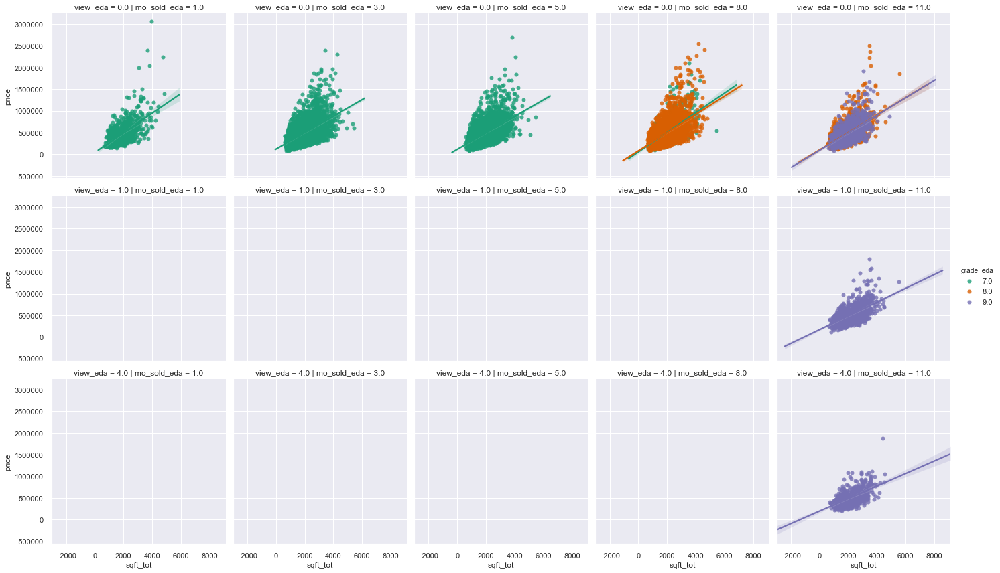

In [43]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='grade_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

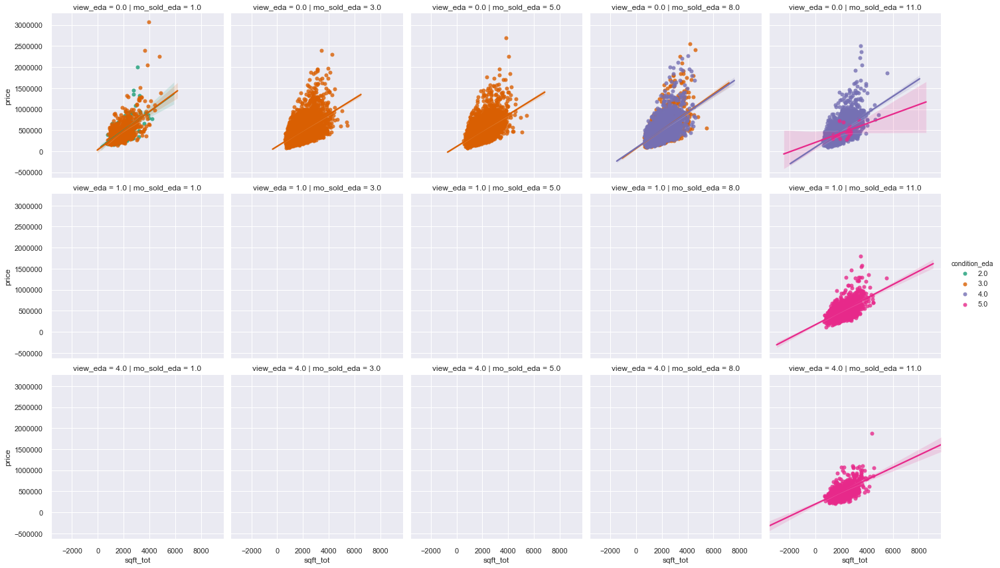

In [44]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

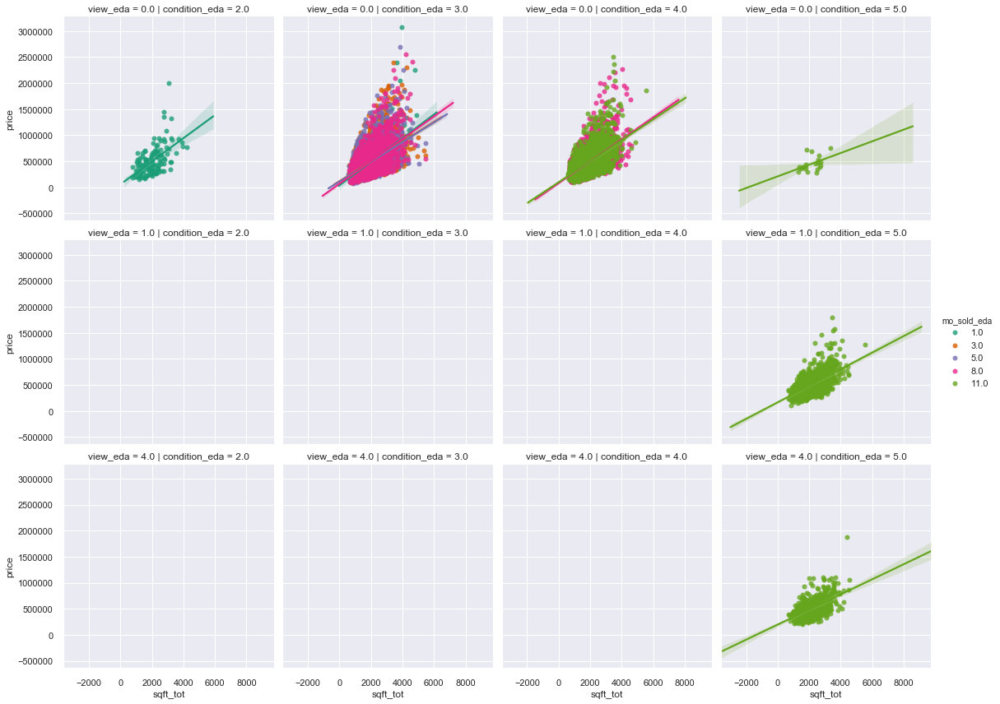

In [45]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='condition_eda', data = kc_eda, hue='mo_sold_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

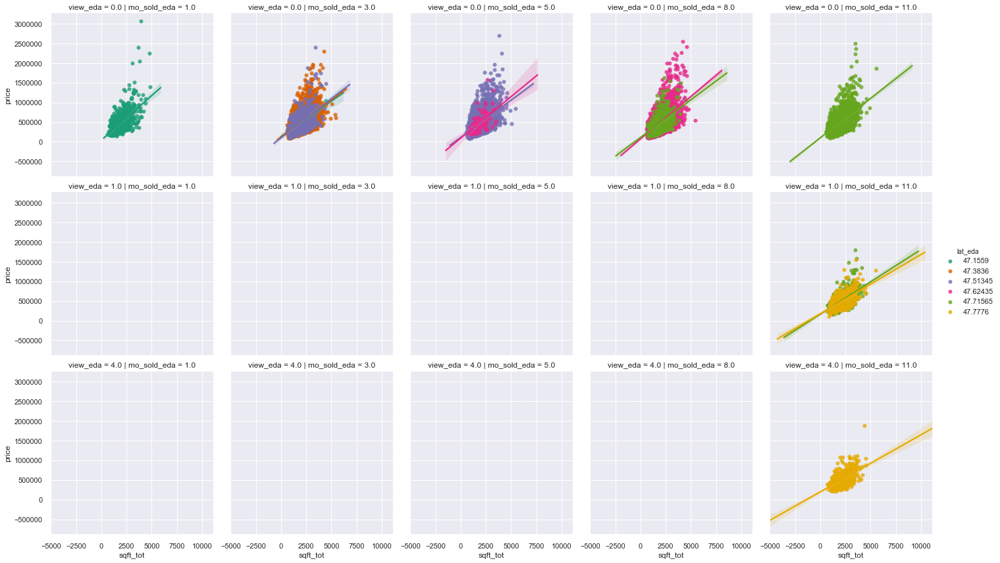

In [46]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

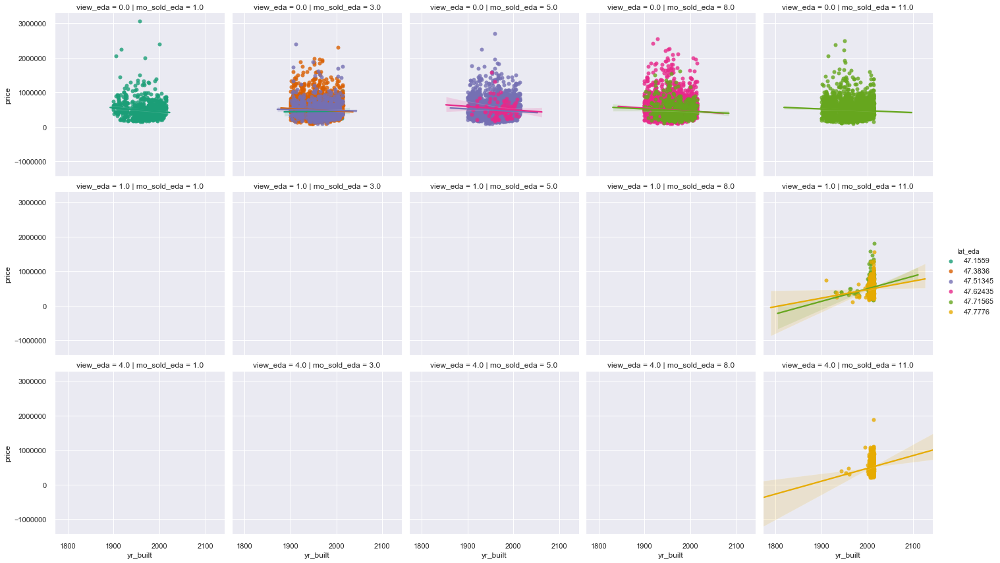

In [47]:
sns.lmplot(x ='yr_built', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

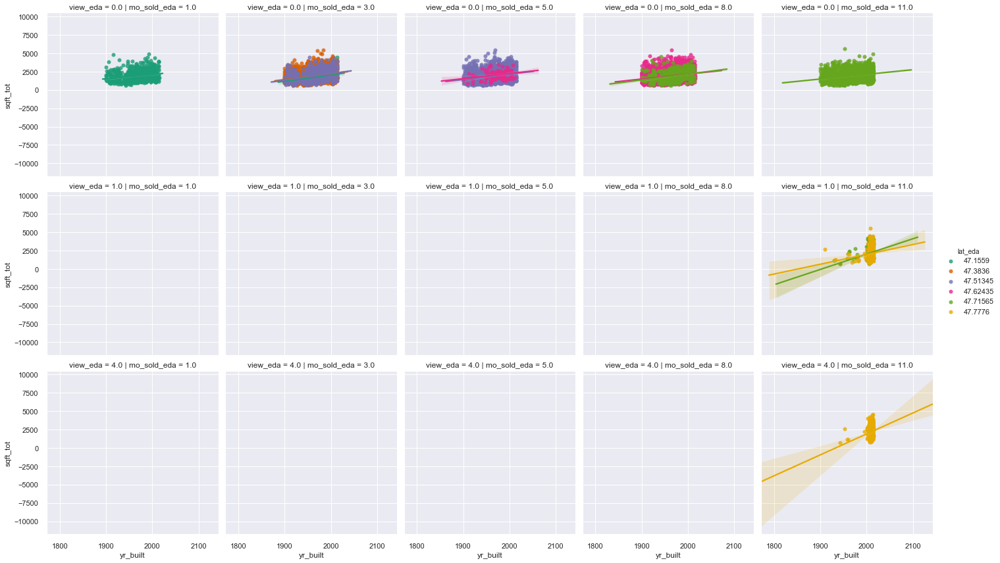

In [48]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

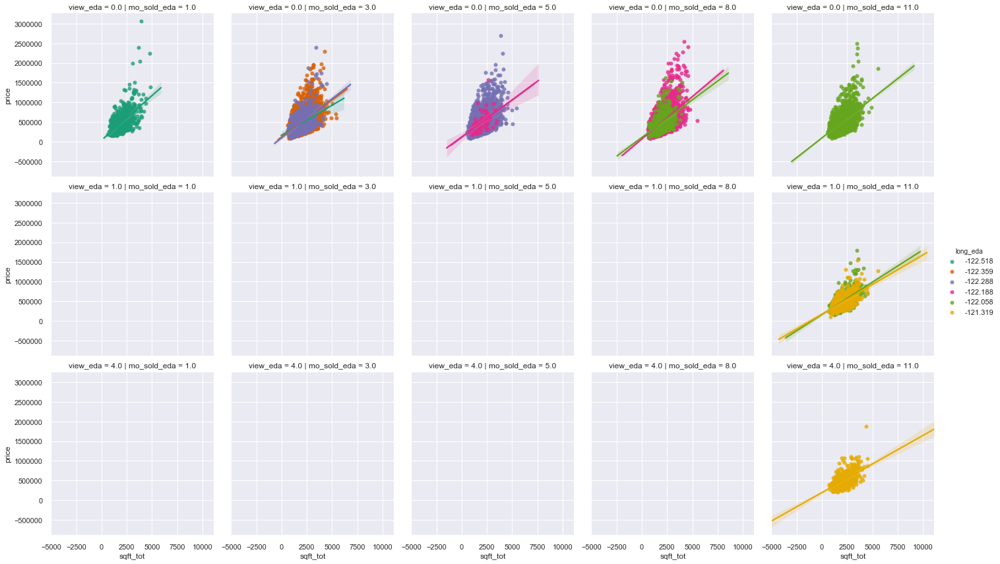

In [49]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

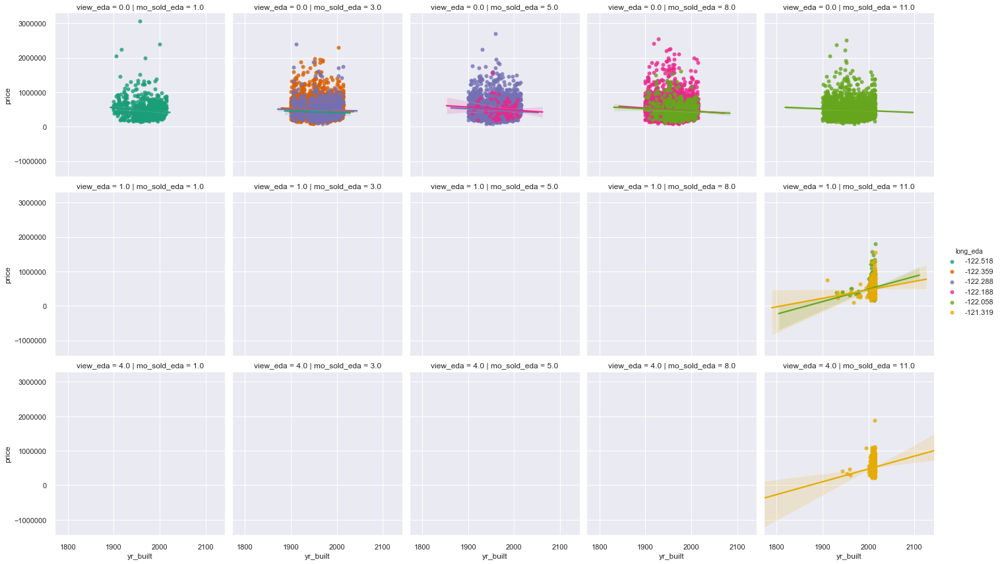

In [50]:
sns.lmplot(x ='yr_built', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

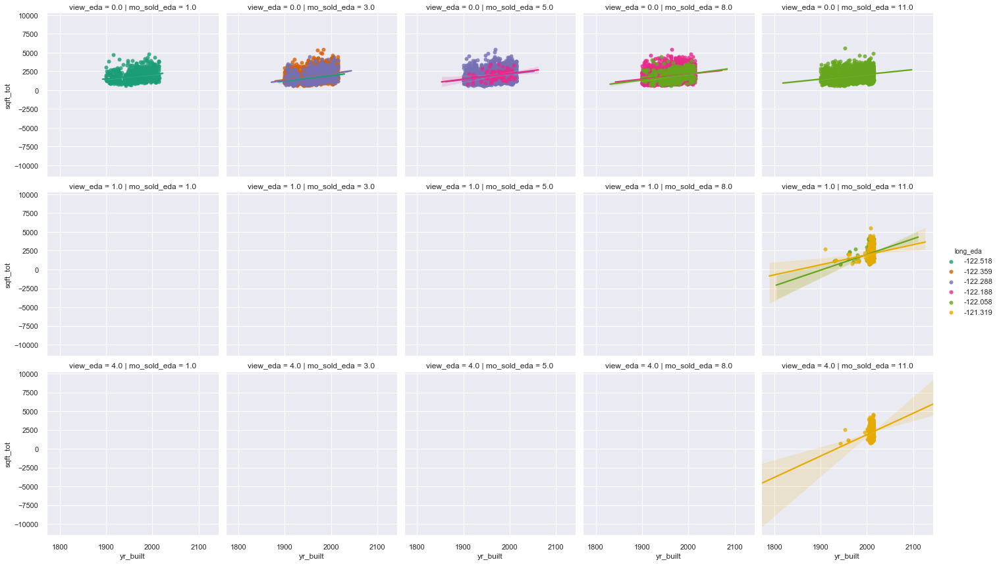

In [51]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

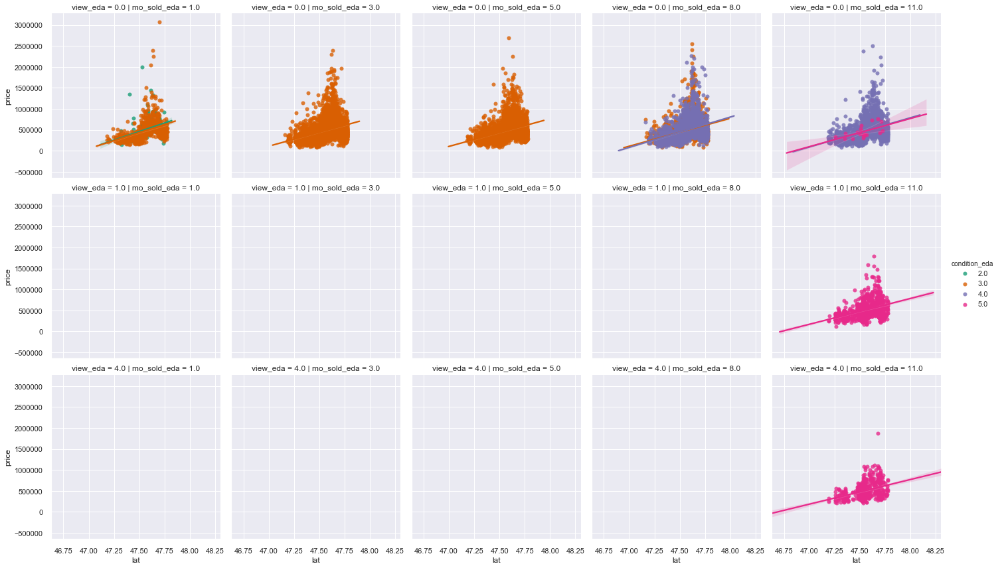

In [52]:
sns.lmplot(x ='lat', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

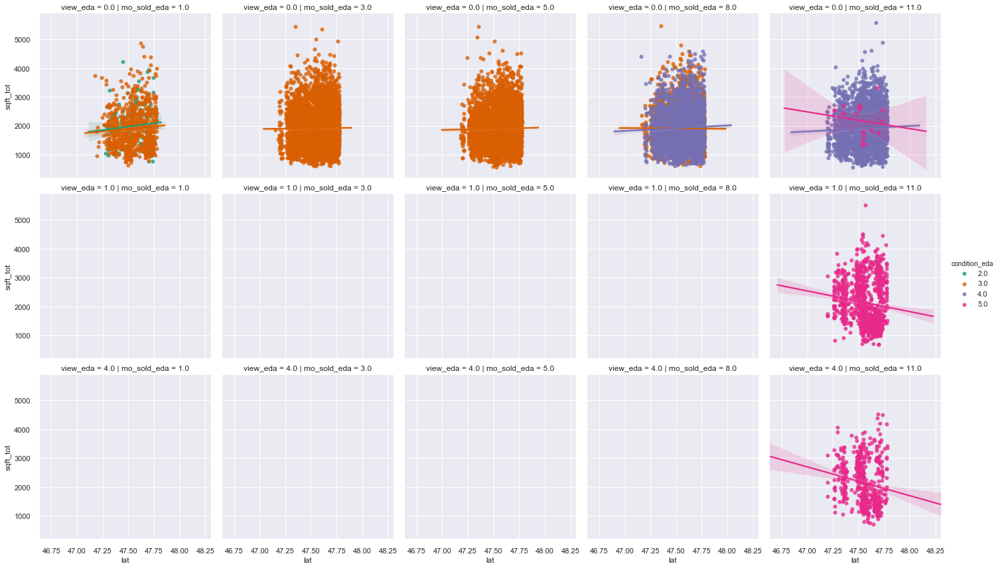

In [53]:
sns.lmplot(x ='lat', y ='sqft_tot', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

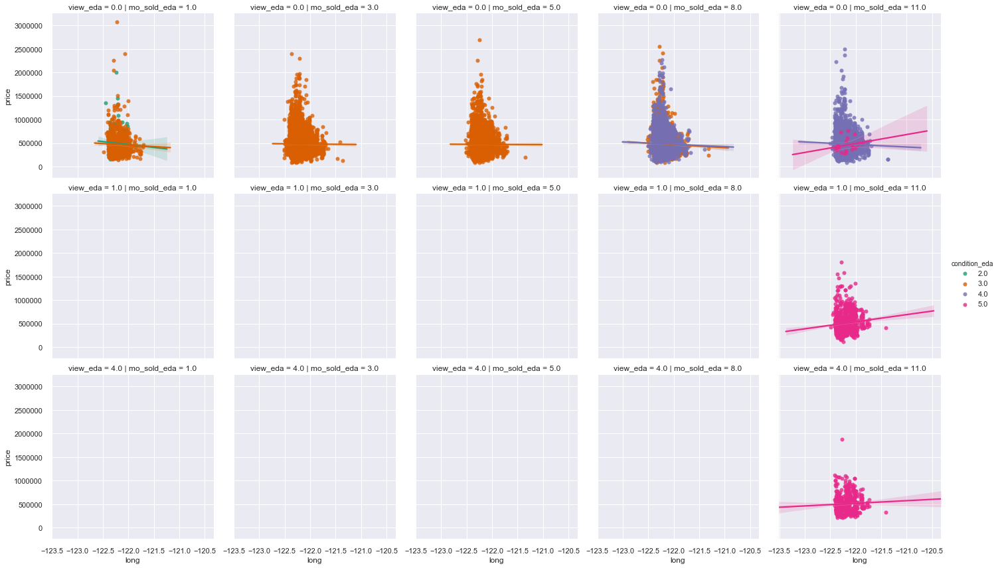

In [54]:
sns.lmplot(x ='long', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

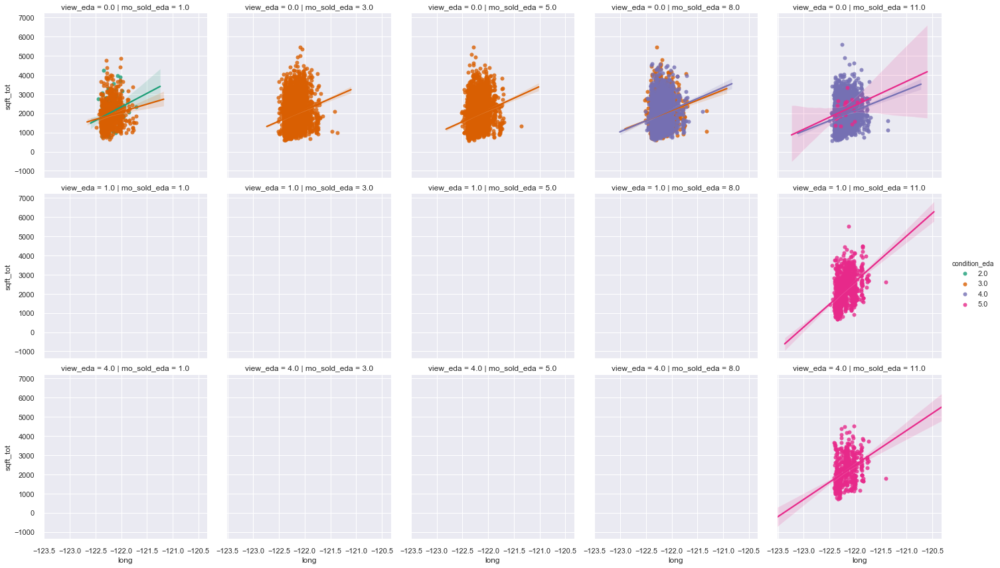

In [55]:
sns.lmplot(x ='long', y ='sqft_tot', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

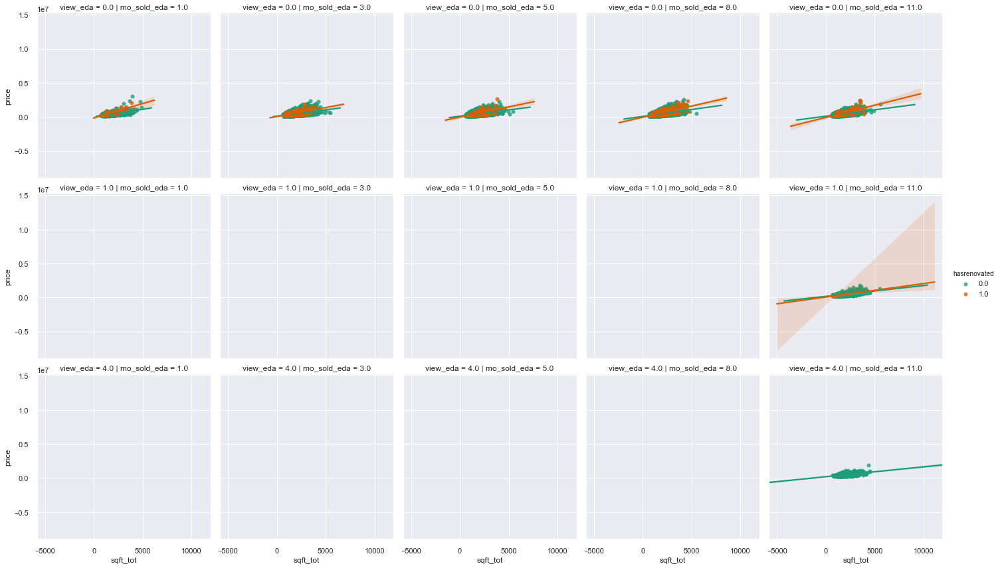

In [56]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasrenovated', height=4, aspect=1, palette='Dark2', fit_reg=True) 

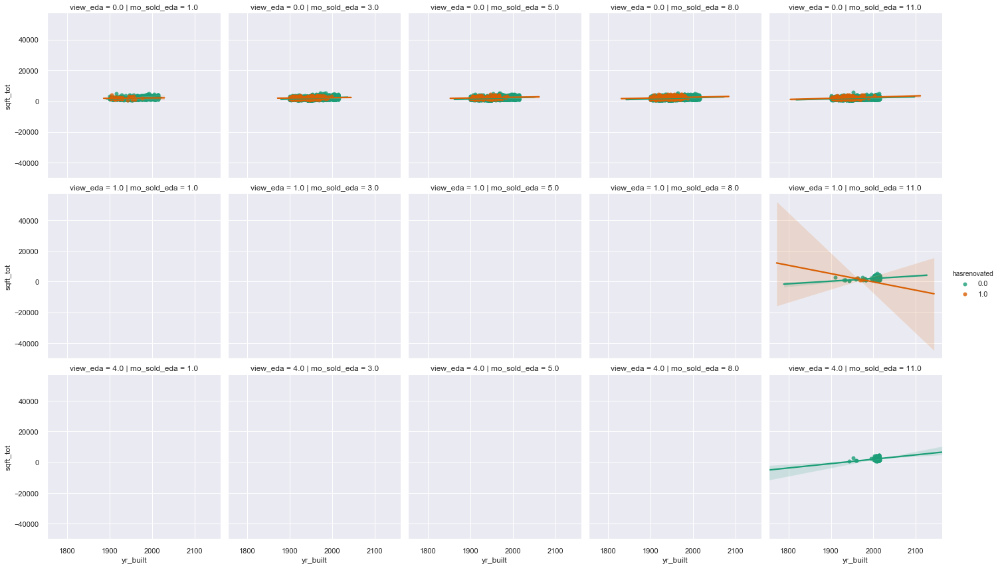

In [57]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasrenovated', height=4, aspect=1, palette='Dark2', fit_reg=True) 

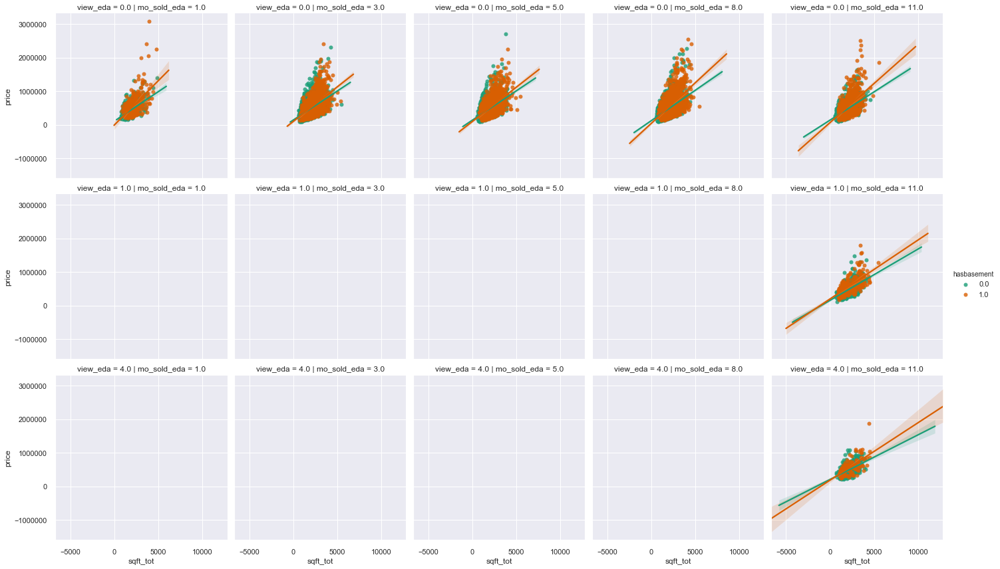

In [58]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbasement', height=4, aspect=1, palette='Dark2', fit_reg=True) 

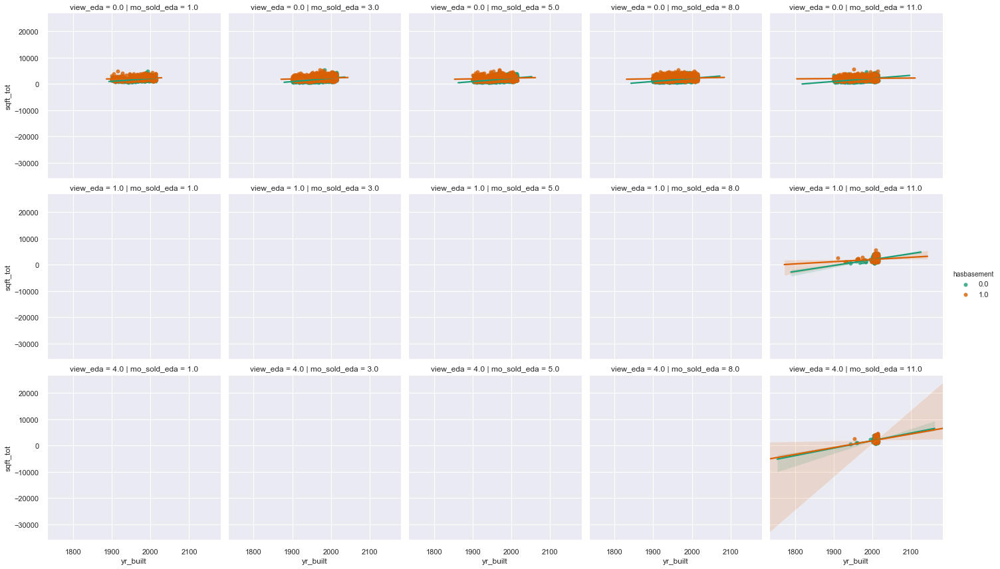

In [59]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbasement', height=4, aspect=1, palette='Dark2', fit_reg=True) 

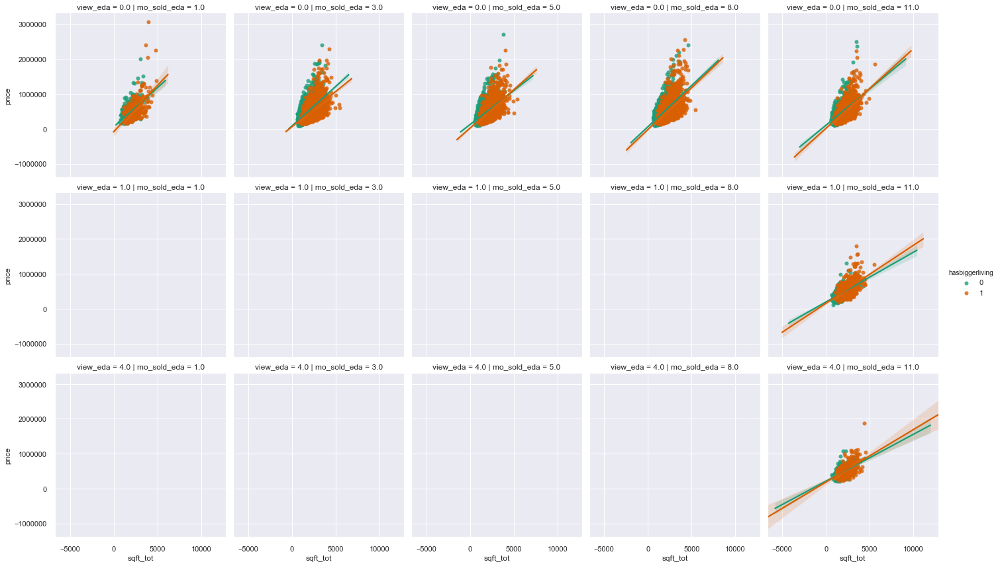

In [60]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

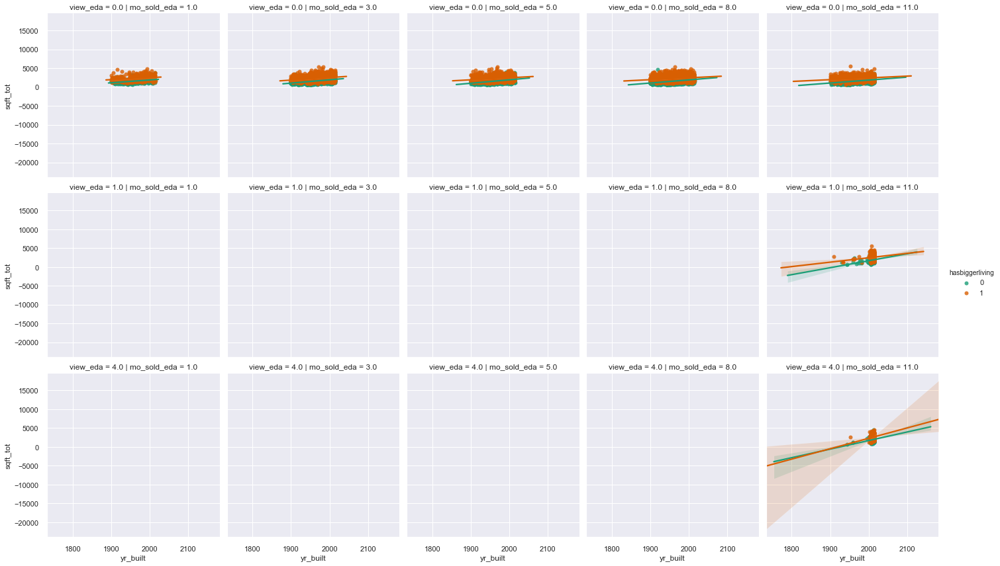

In [61]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

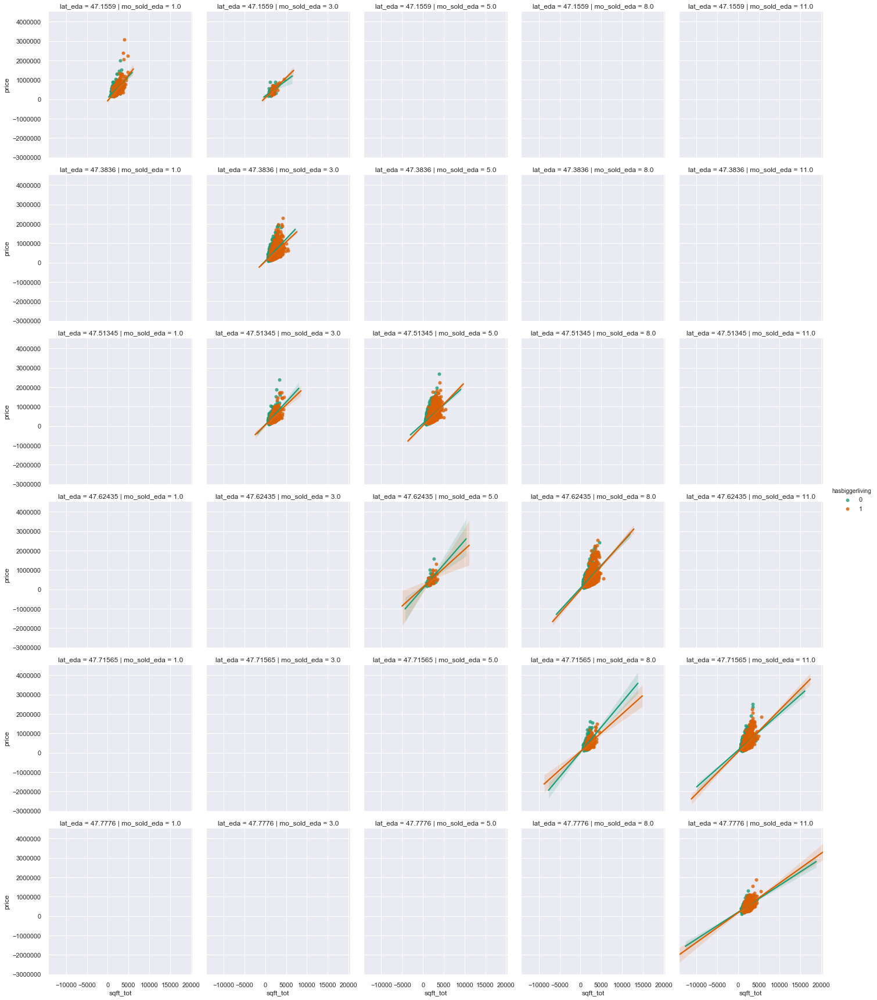

In [62]:
sns.lmplot(x ='sqft_tot', y ='price', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

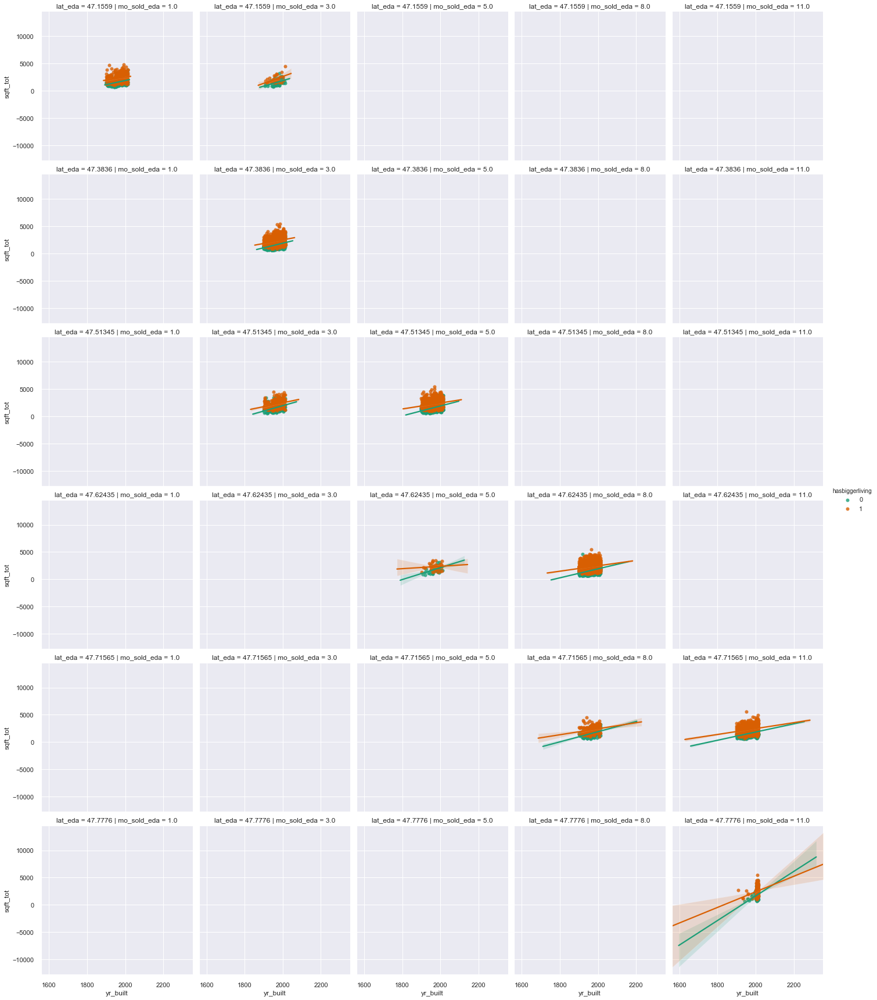

In [63]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

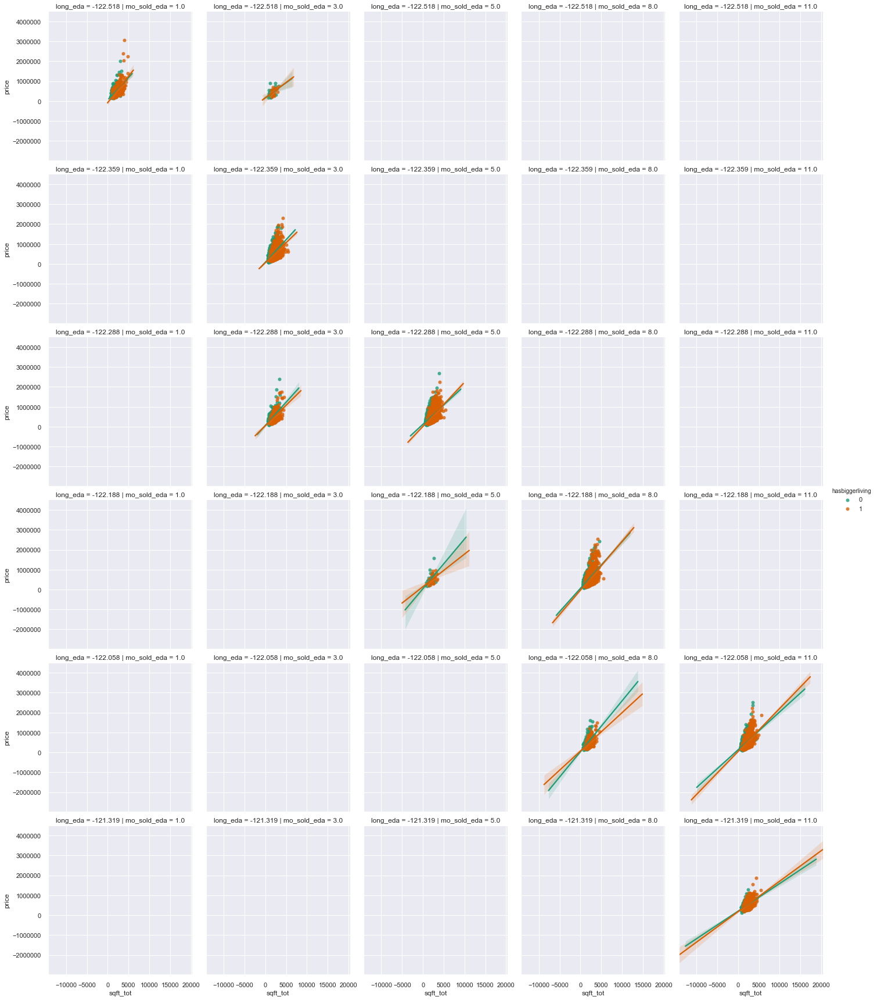

In [64]:
sns.lmplot(x ='sqft_tot', y ='price', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

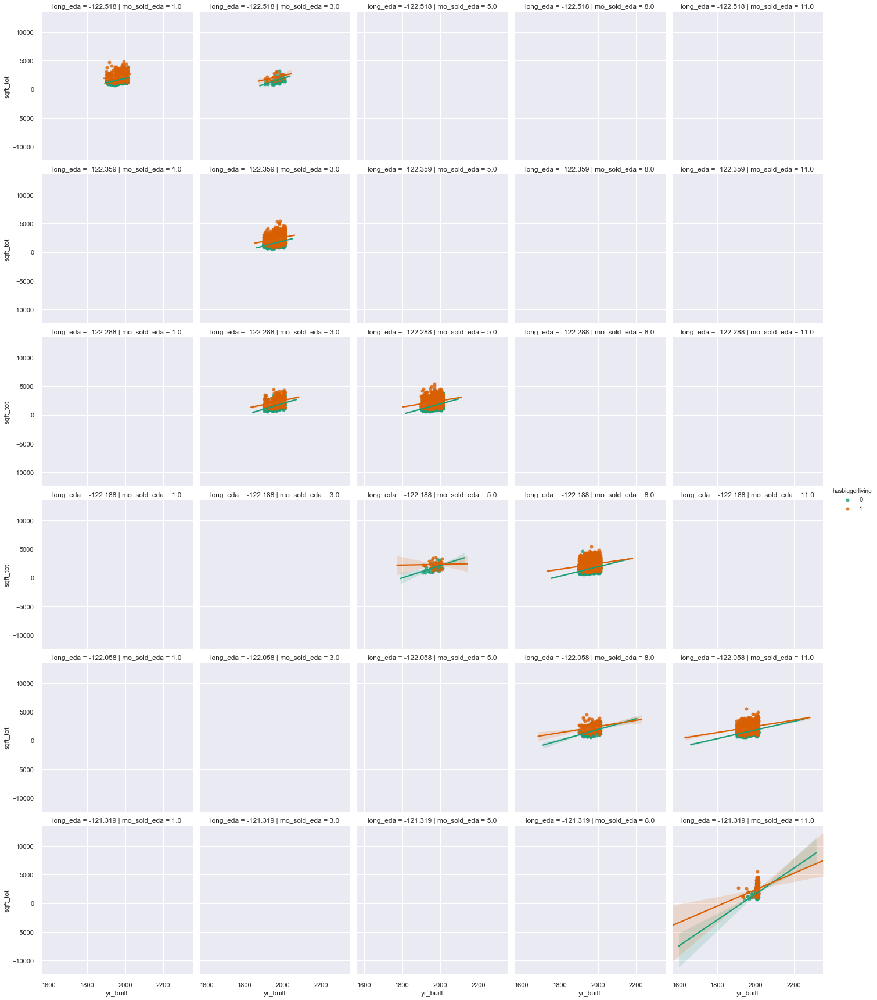

In [65]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

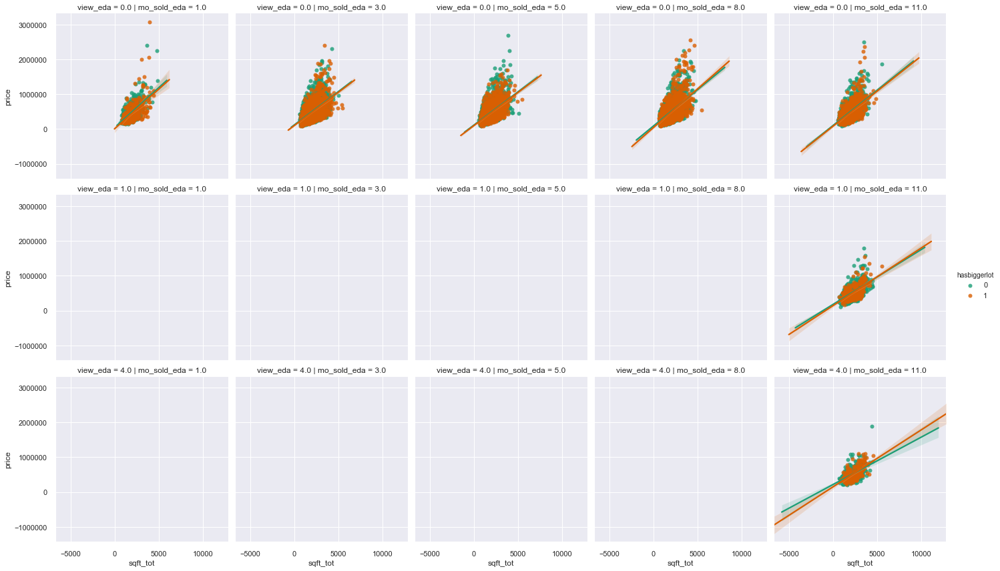

In [66]:
sns.lmplot(x ='sqft_tot', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

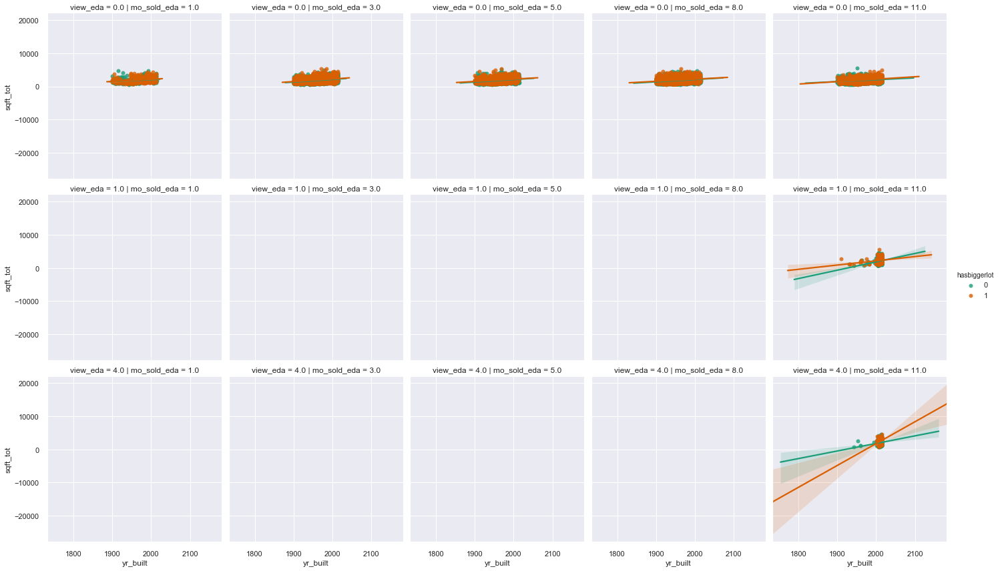

In [67]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

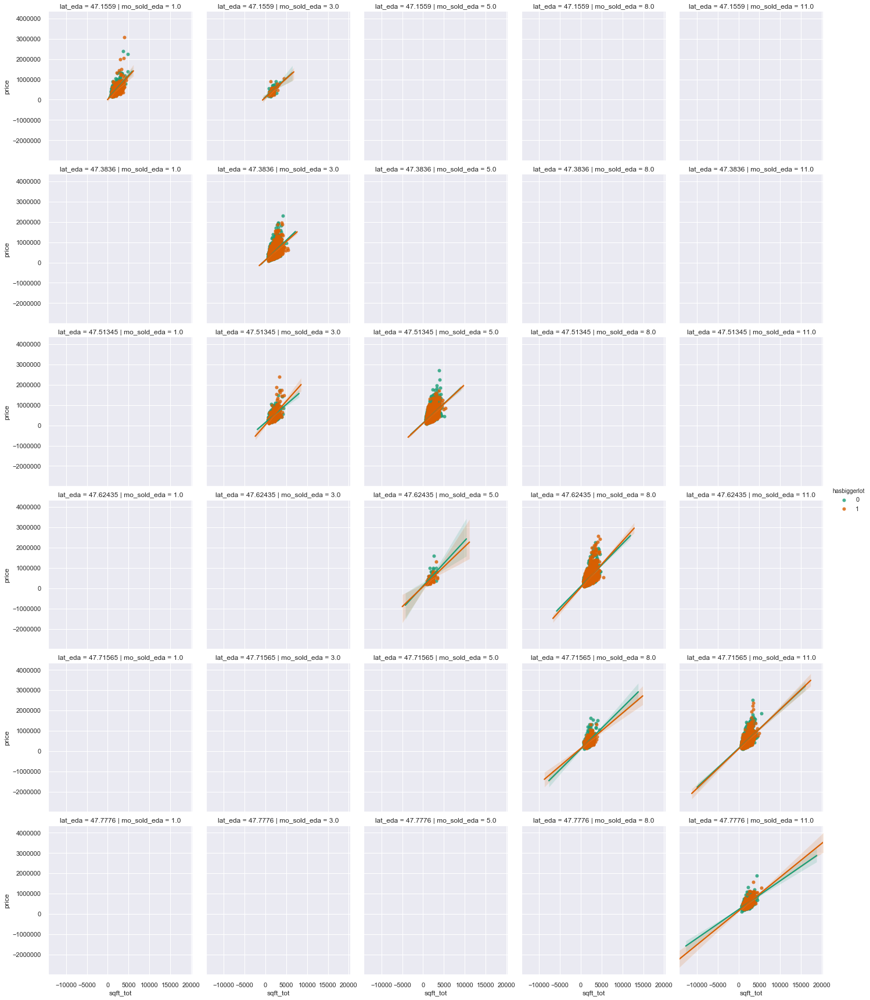

In [68]:
sns.lmplot(x ='sqft_tot', y ='price', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

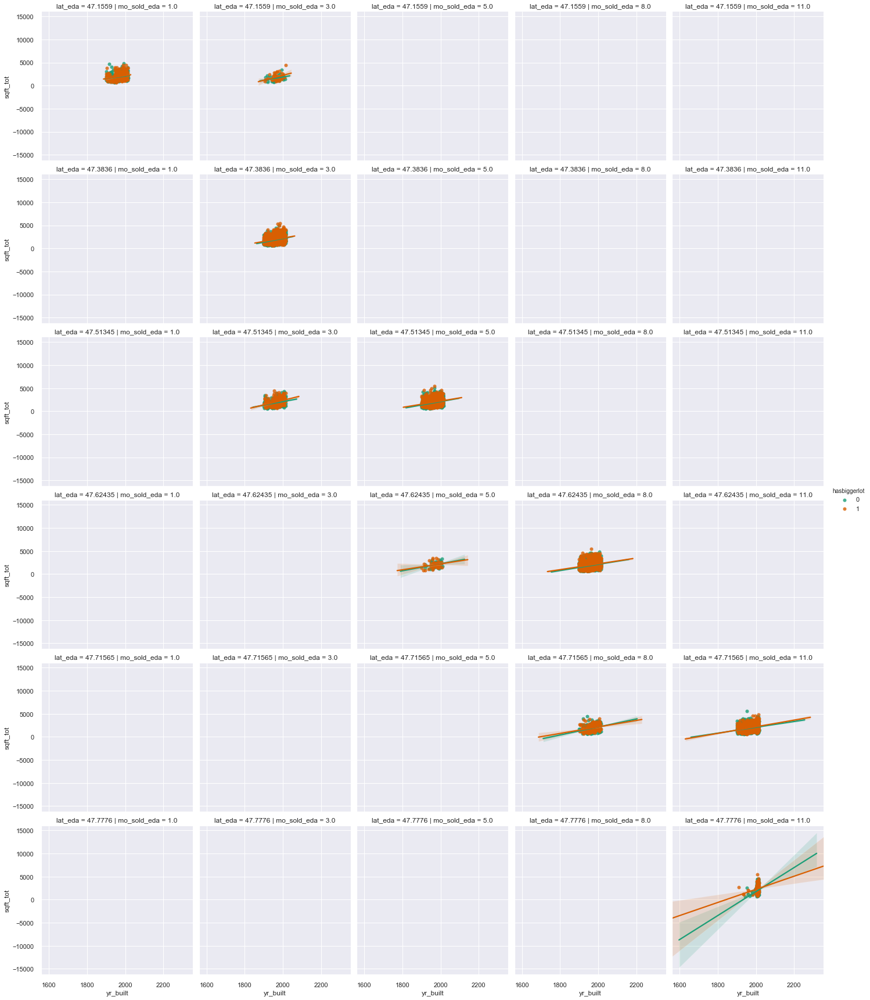

In [69]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

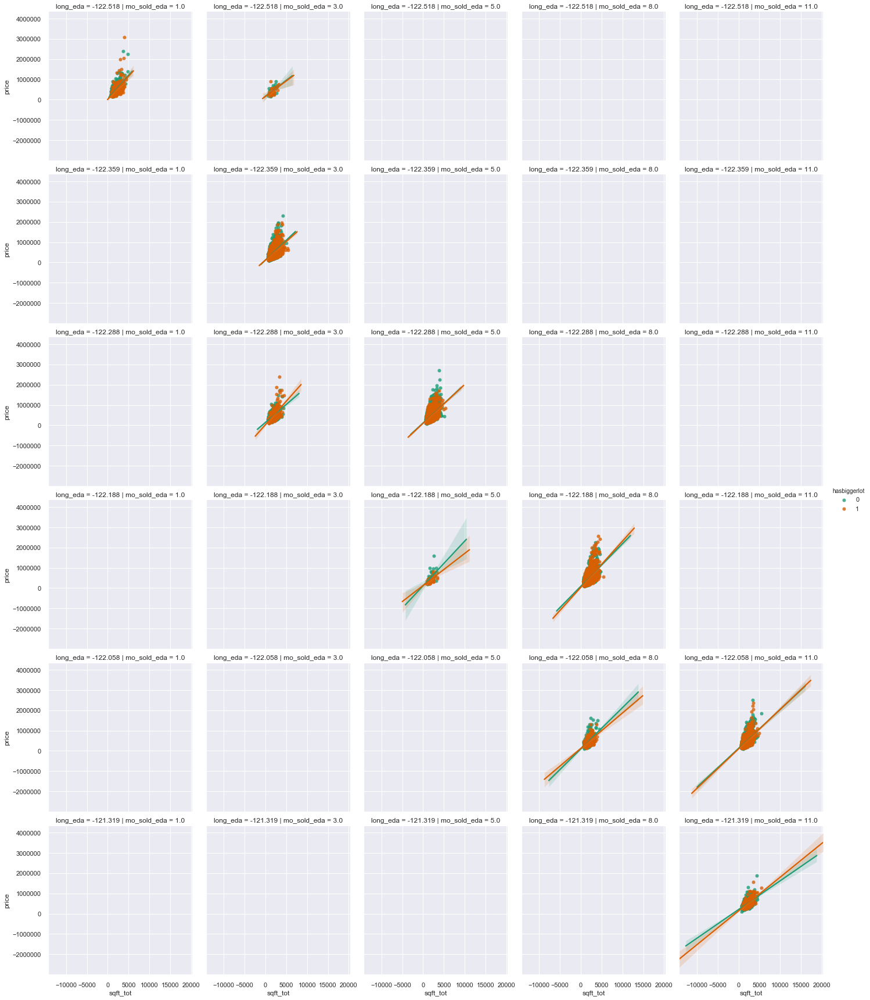

In [70]:
sns.lmplot(x ='sqft_tot', y ='price', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

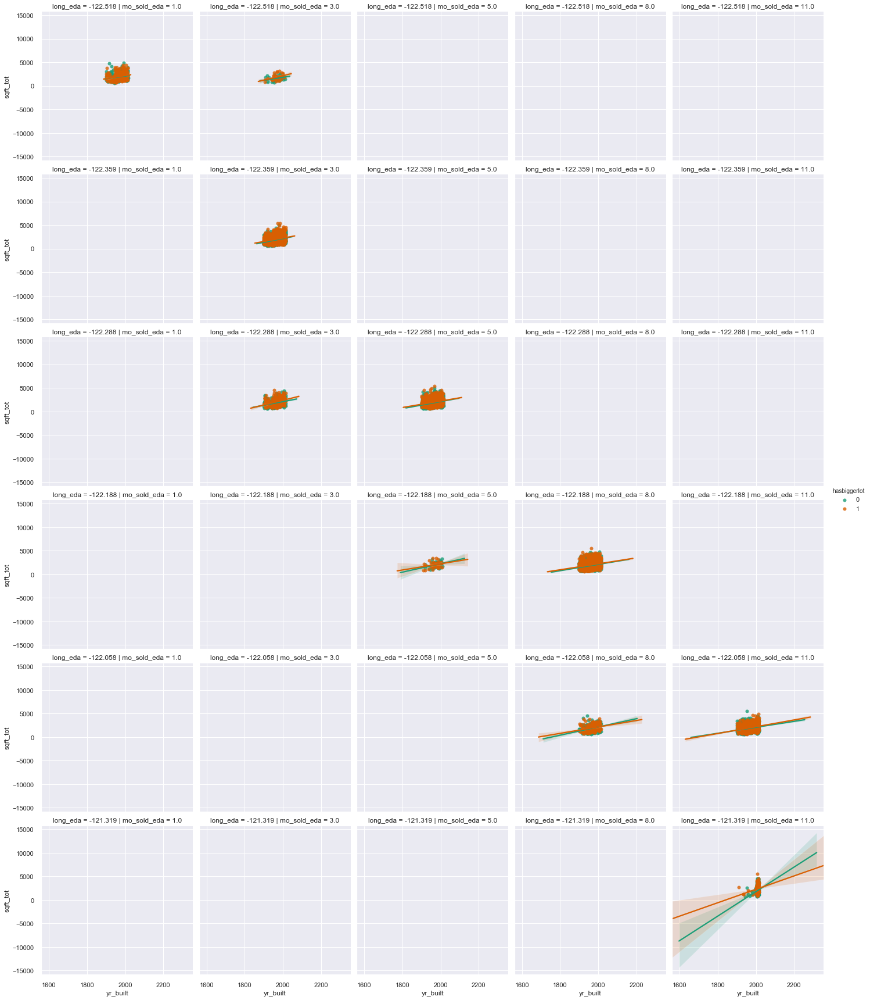

In [71]:
sns.lmplot(x ='yr_built', y ='sqft_tot', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

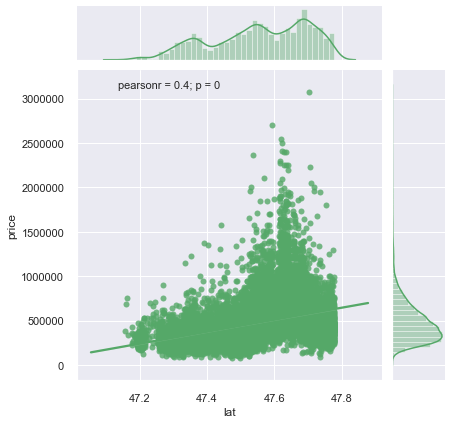

In [72]:
j = sns.jointplot(x='lat', y='price', data=kc_eda, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

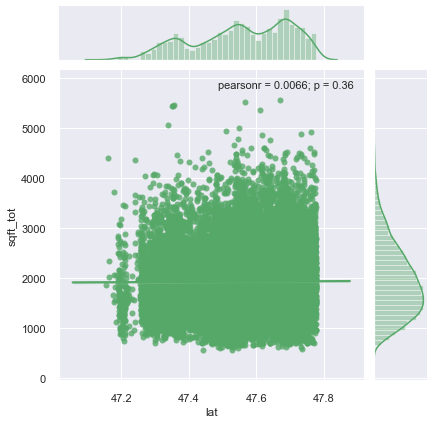

In [73]:
j = sns.jointplot(x='lat', y='sqft_tot', data=kc_eda, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

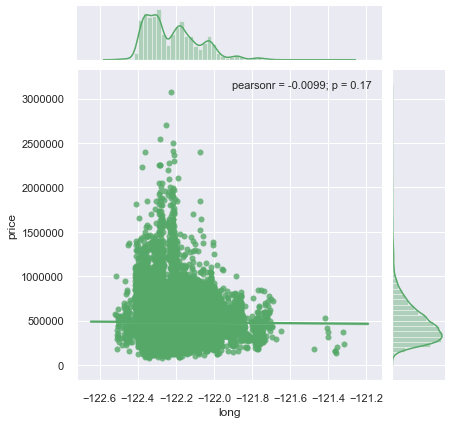

In [74]:
j = sns.jointplot(x='long', y='price', data=kc_eda, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

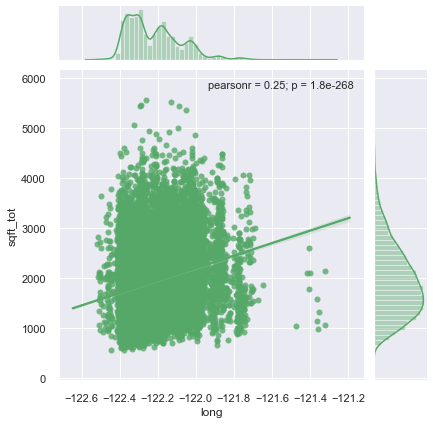

In [75]:
j = sns.jointplot(x='long', y='sqft_tot', data=kc_eda, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

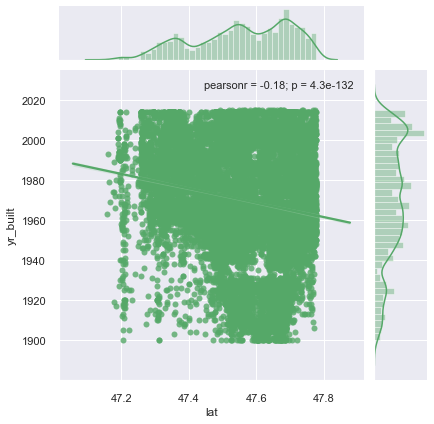

In [76]:
j = sns.jointplot(x='lat', y='yr_built', data=kc_eda, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

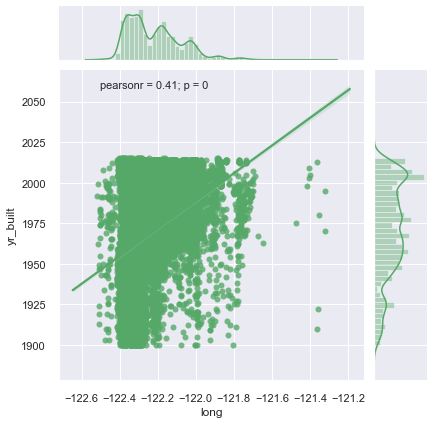

In [77]:
j = sns.jointplot(x='long', y='yr_built', data=kc_eda, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

## for modeling: training, testing and making predictions

In [78]:
def convert_to_cate(df, col, read=True):
    df_clone = df.copy()
    df_clone[col] = sorted(df_clone[col])
    
    print(f'no. unique variables in {col}: {df_clone[col].nunique()}')
    if read:
        print(f'unique values as follows: {df_clone[col].unique()}')
    
    q_0 = float(df_clone[col].min())
    q_10 = df_clone[col].quantile(q=0.10)
    q_20 = df_clone[col].quantile(q=0.20)
    q_30 = df_clone[col].quantile(q=0.30)
    q_40 = df_clone[col].quantile(q=0.40)
    q_50 = df_clone[col].median()
    q_60 = df_clone[col].quantile(q=0.60)
    q_70 = df_clone[col].quantile(q=0.70)
    q_80 = df_clone[col].quantile(q=0.80)
    q_90 = df_clone[col].quantile(q=0.90)
    q_100 = float(df_clone[col].max())
            
    print(f'q0={q_0} , q10={q_10} , q20={q_20} , q30={q_30} , q40={q_40}')
    print(f'q50={q_50} , q60={q_60} , q70={q_70} , q80={q_80} , q90={q_90} , q100={q_100}')
    print(f'size {df_clone[col].shape[0]}')
    
    for idx, row in df_clone.iterrows():
        if (row[col] <= q_10):
            df_clone.loc[idx,col] = (q_0 + q_10) / 2
        elif (row[col] > q_10) & (row[col] <= q_20):
            df_clone.loc[idx,col] = (q_10 + q_20) / 2
        elif (row[col] > q_20) & (row[col] <= q_30):
            df_clone.loc[idx,col] = (q_20 + q_30) / 2
        elif (row[col] > q_30) & (row[col] <= q_40):
            df_clone.loc[idx,col] = (q_30 + q_40) / 2
        elif (row[col] > q_40) & (row[col] <= q_50):
            df_clone.loc[idx,col] = (q_40 + q_50) / 2
        elif (row[col] > q_50) & (row[col] <= q_60):
            df_clone.loc[idx,col] = (q_50 + q_60) / 2
        elif (row[col] > q_60) & (row[col] <= q_70):
            df_clone.loc[idx,col] = (q_60 + q_70) / 2
        elif (row[col] > q_70) & (row[col] <= q_80):
            df_clone.loc[idx,col] = (q_70 + q_80) / 2
        elif (row[col] > q_80) & (row[col] <= q_90):
            df_clone.loc[idx,col] = (q_80 + q_90) / 2
        elif (row[col] > q_90) & (row[col] <= q_100):
            df_clone.loc[idx,col] = (q_90 + q_100) / 2
        else:
            print('sth.',row[col],'not included!')
            
    df_clone[col] = df_clone[col].apply(np.ceil) # or np.floor
    
    return df_clone

In [79]:
kc12['lat_cat'] = kc12['lat']
kc12['lat_cat'] = kc12['lat_cat'] * 10000
kc12['long_cat'] = kc12['long']
kc12['long_cat'] = kc12['long_cat'] * 1000
kc12 = convert_to_cate(kc12, 'lat_cat', False)
kc12['lat_cat'] = kc12['lat_cat'] / 10000
kc12.lat_cat.unique()

no. unique variables in lat_cat: 5033
q0=471559.0 , q10=473503.0 , q20=474323.2 , q30=474969.8 , q40=475397.0000000001
q50=475718.00000000006 , q60=476211.6 , q70=476616.2 , q80=476908.00000000006 , q90=477279.0 , q100=477776.0
size 21597


array([47.2531, 47.3914, 47.4647, 47.5184, 47.5558, 47.5965, 47.6414,
       47.6763, 47.7094, 47.7528])

In [80]:
kc12 = convert_to_cate(kc12, 'long_cat', False)
kc12['long_cat'] = kc12['long_cat'] / 1000
kc12.long_cat.unique()

no. unique variables in long_cat: 751
q0=-122518.99999999999 , q10=-122372.00000000001 , q20=-122346.0 , q30=-122312.00000000001 , q40=-122287.0
q50=-122231.00000000001 , q60=-122189.0 , q70=-122152.99999999999 , q80=-122094.0 , q90=-122022.0 , q100=-121315.0
size 21597


array([-122.445, -122.359, -122.329, -122.299, -122.259, -122.21 ,
       -122.171, -122.123, -122.058, -121.668])

# exploring data

## count unique values 

In [81]:
def unique_features_plt(df):
    df_clone = df.copy()
    df_clone = df_clone.loc[:, df_clone.dtypes != 'object']
    print(df_clone.info())
    print(df_clone.nunique())
    
    fig, ax = plt.subplots(1,1,figsize = (15, 5)) 
    plt.bar(df_clone.columns,df_clone.nunique(),color='green',alpha=0.4,width=0.2)
    plt.xticks(rotation=90)
    plt.yscale('log')
    plt.show()
    
    return None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 27 columns):
price              21597 non-null float64
bedrooms           21597 non-null int64
bathrooms          21597 non-null float64
sqft_living        21597 non-null int64
sqft_lot           21597 non-null int64
floors             21597 non-null float64
waterfront         21597 non-null float64
view               21597 non-null float64
condition          21597 non-null int64
grade              21597 non-null int64
sqft_above         21597 non-null int64
yr_built           21597 non-null int64
zipcode            21597 non-null int64
lat                21597 non-null float64
long               21597 non-null float64
hasrenovated       21597 non-null float64
hasbasement        21597 non-null float64
hasbiggerliving    21597 non-null int64
hasbiggerlot       21597 non-null int64
yr_sold            21597 non-null int64
mo_sold            21597 non-null int64
sqft_tot           21597 non-null

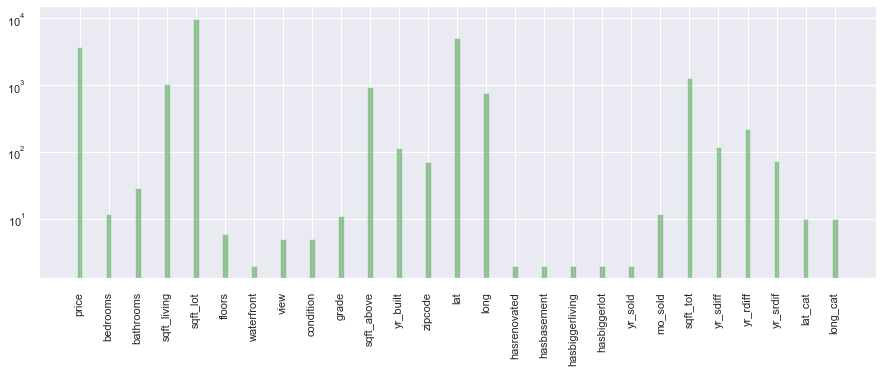

In [82]:
unique_features_plt(kc12)

## understand data

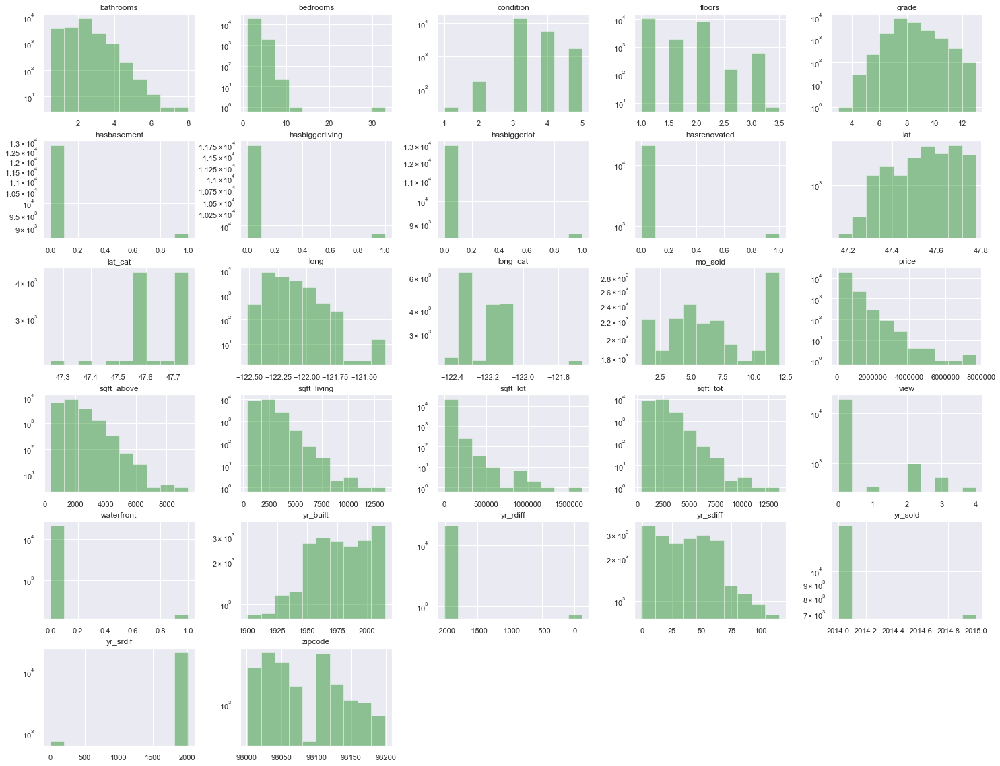

In [83]:
kc12.hist(figsize=(25,20), color='green', alpha=0.4, log=True)
plt.show()

##  inspect features

Column Names and descriptions for Kings County Data Set
* **id** - unique identified for a house
* **date** - house was sold
* **price** -  is prediction target
* **bedroomsNumber** -  of Bedrooms/House
* **bathroomsNumber** -  of bathrooms/bedrooms
* **sqft_livingsquare** -  footage of the home
* **sqft_lotsquare** -  footage of the lot
* **floorsTotal** -  floors (levels) in house
* **waterfront** - House which has a view to a waterfront
* **view** - Has been viewed
* **condition** - How good the condition is ( Overall )
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zip
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots for the nearest 15 neighbors

### continuous features

In [84]:
def check_continuous_feats(df):
    df_clone = df.copy()
    
    for col in df_clone.columns:
        if (df_clone[col].min() < 0) & (df_clone[col].max() < 0):
            print(f'{col} minimal/maximal are negative!')
            df_clone[col+'_korg'] = df_clone[col]
            df_clone[col] *= (-1)
        elif (df_clone[col].min() <= 0) & (df_clone[col].max() > 0):
            print(f'{col} minimal is negative!')
            df_clone[col+'_korg'] = df_clone[col]
            df_clone[col] -= df_clone[col].min()
            df_clone[col] += 1
        else:
            print(f'{col} is positive!')
            
    return df_clone

In [85]:
kc_continuous = kc12.loc[:, (kc12.dtypes != 'object') & (kc12.nunique() > 30)]
removed_contfeats = ['lat','long']
continuous = list(col for col in kc_continuous.columns if col not in removed_contfeats)
#continuous = list(kc_continuous.columns)
print(continuous)
kc_continuous = kc_continuous.loc[:,continuous]
print(kc_continuous.shape)
kc_continuous.head()

['price', 'sqft_living', 'sqft_lot', 'sqft_above', 'yr_built', 'zipcode', 'sqft_tot', 'yr_sdiff', 'yr_rdiff', 'yr_srdif']
(21597, 10)


,price,sqft_living,sqft_lot,sqft_above,yr_built,zipcode,sqft_tot,yr_sdiff,yr_rdiff,yr_srdif
0,221900.0,1180,5650,1180,1955,98178,1180.0,59,-1955.0,2014.0
1,538000.0,2570,7242,2170,1951,98125,2570.0,63,40.0,23.0
2,180000.0,770,10000,770,1933,98028,770.0,82,-1933.0,2015.0
3,604000.0,1960,5000,1050,1965,98136,1960.0,49,-1965.0,2014.0
4,510000.0,1680,8080,1680,1987,98074,1680.0,28,-1987.0,2015.0


price
sqft_living
sqft_lot
sqft_above
yr_built
zipcode
sqft_tot
yr_sdiff
yr_rdiff
yr_srdif


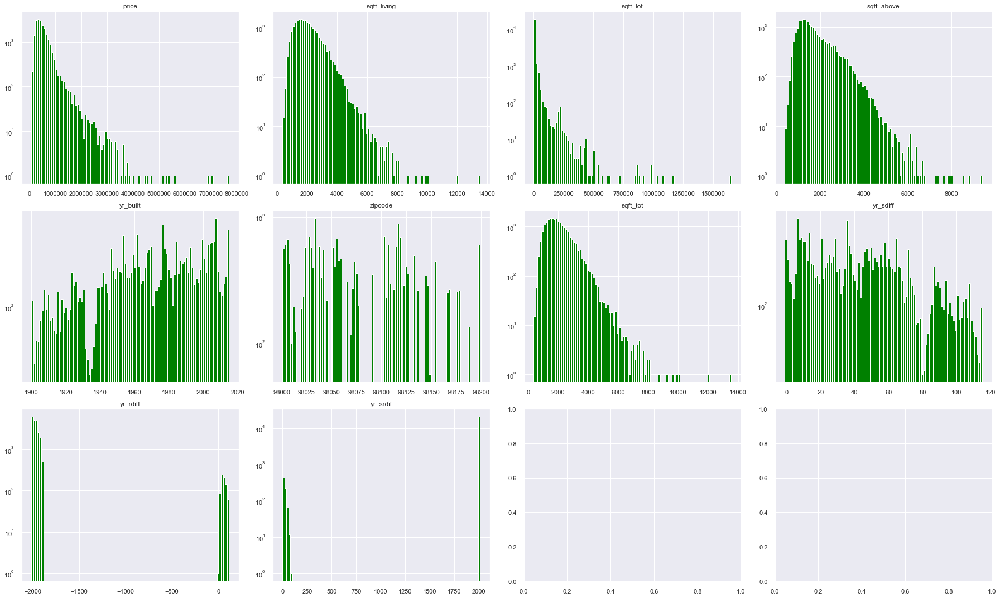

In [87]:
fig, axes = plt.subplots(nrows=kc_continuous.shape[1] // 3, ncols=4, figsize=(25,15))
for xcol, ax in zip(continuous, axes.flatten()):
    print(xcol)
    ax.hist(kc_continuous[xcol], bins=100, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig.tight_layout()

#### check features column by column before applying logarithm transformation

In [88]:
kc_continuous_fit = check_continuous_feats(kc_continuous)
kc_continuous_fit.head()

price is positive!
sqft_living is positive!
sqft_lot is positive!
sqft_above is positive!
yr_built is positive!
zipcode is positive!
sqft_tot is positive!
yr_sdiff minimal is negative!
yr_rdiff minimal is negative!
yr_srdif minimal is negative!


,price,sqft_living,sqft_lot,sqft_above,yr_built,zipcode,sqft_tot,yr_sdiff,yr_rdiff,yr_srdif,yr_sdiff_korg,yr_rdiff_korg,yr_srdif_korg
0,221900.0,1180,5650,1180,1955,98178,1180.0,61,61.0,2016.0,59,-1955.0,2014.0
1,538000.0,2570,7242,2170,1951,98125,2570.0,65,2056.0,25.0,63,40.0,23.0
2,180000.0,770,10000,770,1933,98028,770.0,84,83.0,2017.0,82,-1933.0,2015.0
3,604000.0,1960,5000,1050,1965,98136,1960.0,51,51.0,2016.0,49,-1965.0,2014.0
4,510000.0,1680,8080,1680,1987,98074,1680.0,30,29.0,2017.0,28,-1987.0,2015.0


#### logarithm transformation (scaling) and standard normalization 

Note: we removed columns with non-positive values before applying logarithm transformation.

In [89]:
# log features

removed_feats = ['yr_sdiff_korg','yr_rdiff_korg','yr_srdif_korg']
kc_continuous_fit = kc_continuous_fit.drop(removed_feats,axis=1)

log_names = [f'{col}_log' for col in continuous]

kc_log = np.log(kc_continuous_fit)
kc_log.columns = log_names

kc_log.head()

,price_log,sqft_living_log,sqft_lot_log,sqft_above_log,yr_built_log,zipcode_log,sqft_tot_log,yr_sdiff_log,yr_rdiff_log,yr_srdif_log
0,12.309982,7.073270,8.639411,7.073270,7.578145,11.494537,7.073270,4.110874,4.110874,7.608871
1,13.195614,7.851661,8.887653,7.682482,7.576097,11.493997,7.851661,4.174387,7.628518,3.218876
2,12.100712,6.646391,9.210340,6.646391,7.566828,11.493008,6.646391,4.430817,4.418841,7.609367
3,13.311329,7.580700,8.517193,6.956545,7.583248,11.494110,7.580700,3.931826,3.931826,7.608871
4,13.142166,7.426549,8.997147,7.426549,7.594381,11.493478,7.426549,3.401197,3.367296,7.609367


In [90]:
# normalize (subract mean and divide by std)

def normalize(feature):
    return (feature - feature.mean()) / feature.std()

kc_log_norm = kc_log.apply(normalize)
kc_log_norm.head()

,price_log,sqft_living_log,sqft_lot_log,sqft_above_log,yr_built_log,zipcode_log,sqft_tot_log,yr_sdiff_log,yr_rdiff_log,yr_srdif_log
0,-1.401998,-1.125556,-0.388430,-0.753565,-0.537409,1.869128,-1.130352,0.662581,0.423931,0.184989
1,0.279938,0.709446,-0.113241,0.672693,-0.674325,0.879349,0.710370,0.732145,3.370236,-4.558489
2,-1.799430,-2.131893,0.244475,-1.752954,-1.293945,-0.933519,-2.139827,1.013002,0.681877,0.185525
3,0.499698,0.070674,-0.523914,-1.026835,-0.196338,1.084819,0.069607,0.466476,0.273964,0.184989
4,0.178434,-0.292725,0.008139,0.073515,0.547946,-0.073585,-0.294925,-0.114701,-0.198875,0.185525


price_log
sqft_living_log
sqft_lot_log
sqft_above_log
yr_built_log
zipcode_log
sqft_tot_log
yr_sdiff_log
yr_rdiff_log
yr_srdif_log


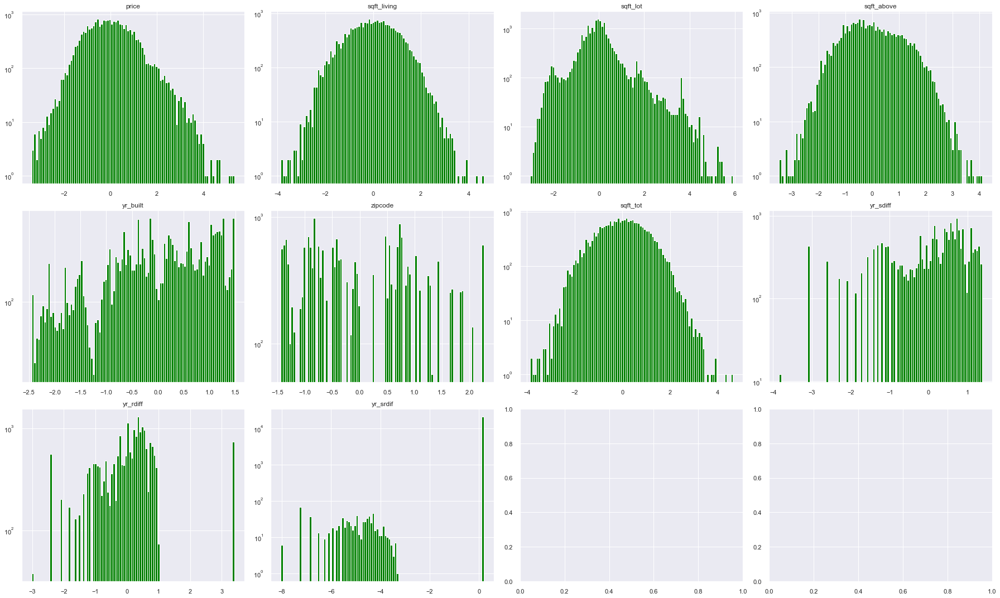

In [91]:
fig2, axes = plt.subplots(nrows=kc_log_norm.shape[1] // 3, ncols=4, figsize=(25,15))
for xcol, ax in zip(continuous, axes.flatten()):
    print(xcol+'_log')
    ax.hist(kc_log_norm[xcol+'_log'], bins=100, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig2.tight_layout()

### categoricals features

In [92]:
kc12.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'yr_built',
       'zipcode', 'lat', 'long', 'hasrenovated', 'hasbasement',
       'hasbiggerliving', 'hasbiggerlot', 'yr_sold', 'mo_sold', 'sqft_tot',
       'yr_sdiff', 'yr_rdiff', 'yr_srdif', 'lat_cat', 'long_cat'],
      dtype='object')

In [93]:
kc_continuous_fit.columns

Index(['price', 'sqft_living', 'sqft_lot', 'sqft_above', 'yr_built', 'zipcode',
       'sqft_tot', 'yr_sdiff', 'yr_rdiff', 'yr_srdif'],
      dtype='object')

In [94]:
categorical = ['price','bedrooms','bathrooms','floors','waterfront','view','condition','grade','hasrenovated','hasbasement','hasbiggerliving','hasbiggerlot','yr_sold','mo_sold','lat_cat','long_cat']
kc_categorical = kc12.loc[:, categorical]
print(kc_categorical.shape)
kc_categorical.head()

(21597, 16)


,price,bedrooms,bathrooms,floors,waterfront,view,condition,grade,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold,lat_cat,long_cat
0,221900.0,3,1.00,1.0,0.0,0.0,3,7,0.0,0.0,0,0,2014,10,47.2531,-122.445
1,538000.0,3,2.25,2.0,0.0,0.0,3,7,1.0,1.0,1,0,2014,12,47.2531,-122.445
2,180000.0,2,1.00,1.0,0.0,0.0,3,6,0.0,0.0,0,1,2015,2,47.2531,-122.445
3,604000.0,4,3.00,1.0,0.0,0.0,5,7,0.0,1.0,1,0,2014,12,47.2531,-122.445
4,510000.0,3,2.00,1.0,0.0,0.0,3,8,0.0,0.0,0,1,2015,2,47.2531,-122.445


price
bedrooms
bathrooms
floors
waterfront
view
condition
grade
hasrenovated
hasbasement
hasbiggerliving
hasbiggerlot
yr_sold
mo_sold
lat_cat
long_cat


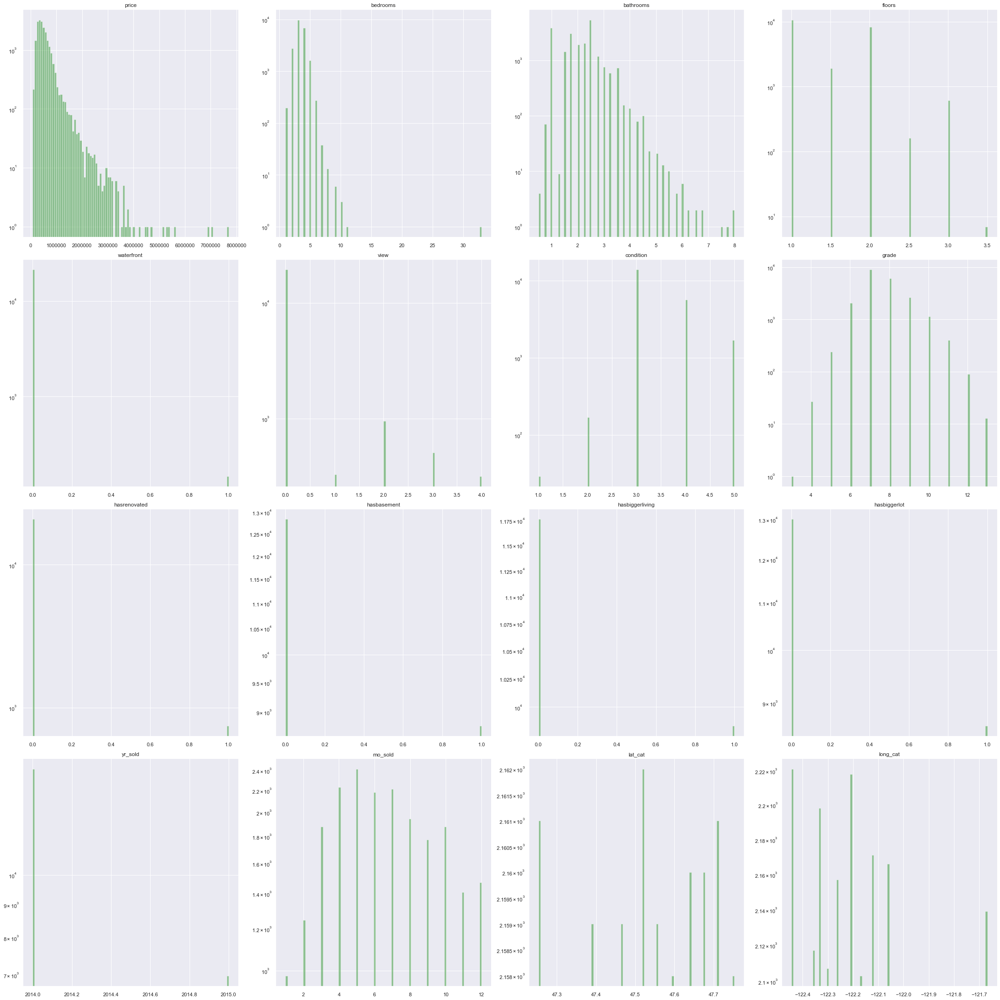

In [95]:
fig3, axes = plt.subplots(nrows=kc_categorical.shape[1] // 4, ncols=4, figsize=(30,30))
for xcol, ax in zip(categorical, axes.flatten()):
    print(xcol)
    ax.hist(kc_categorical[xcol], bins=100, alpha=0.4, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig3.tight_layout()

## check linearity
### continuous features

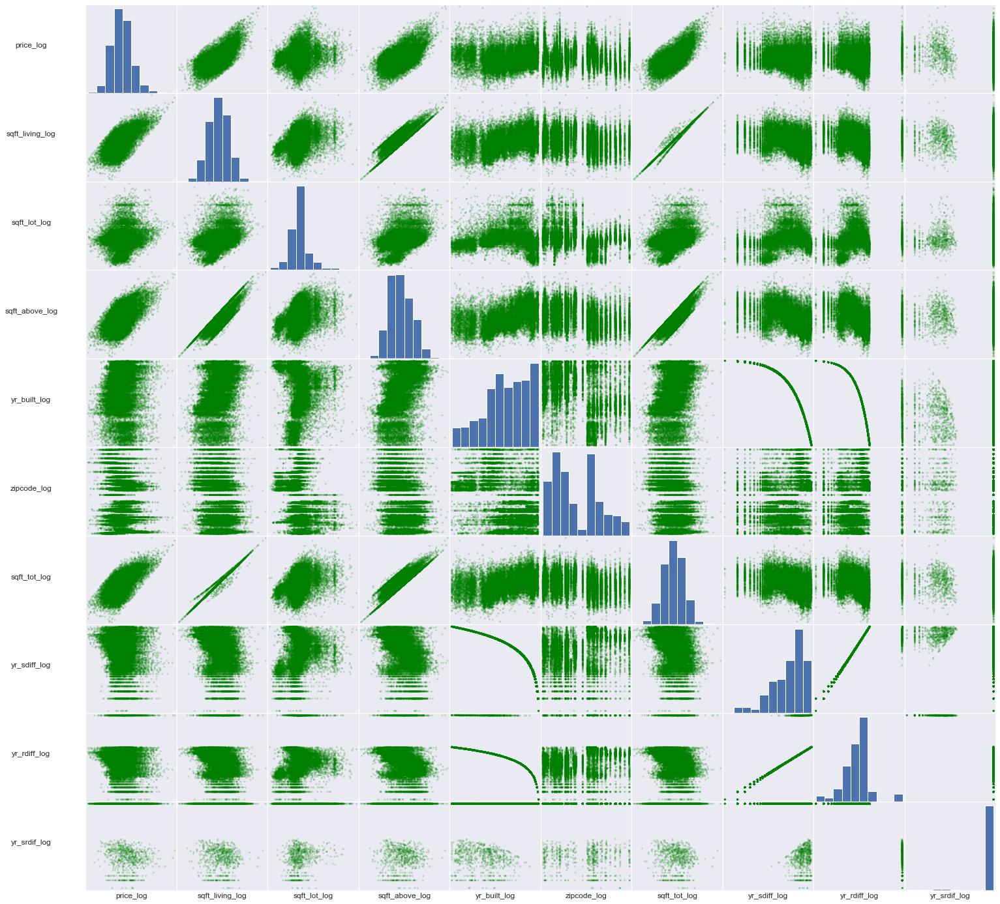

In [96]:
# Your code here 
sm = pd.plotting.scatter_matrix(kc_log_norm, color='green', alpha=0.2, figsize=[25, 25]);

# Rotates the text
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]

# May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.6,0.5) for s in sm.reshape(-1)]

# Hide all ticks
[s.set_xticks(()) for s in sm.reshape(-1)]
[s.set_yticks(()) for s in sm.reshape(-1)]

plt.show()

In [97]:
kc_log_norm.corr()

,price_log,sqft_living_log,sqft_lot_log,sqft_above_log,yr_built_log,zipcode_log,sqft_tot_log,yr_sdiff_log,yr_rdiff_log,yr_srdif_log
price_log,1.000000,0.674802,0.138261,0.586013,0.078987,-0.038757,0.673215,-0.138602,-0.053949,-0.108731
sqft_living_log,0.674802,1.000000,0.325983,0.864979,0.348973,-0.222133,0.997191,-0.324153,-0.226191,-0.048719
sqft_lot_log,0.138261,0.325983,1.000000,0.318663,-0.004421,-0.281727,0.325428,0.168499,0.145358,-0.010731
sqft_above_log,0.586013,0.864979,0.318663,1.000000,0.450023,-0.290337,0.867203,-0.438038,-0.326669,-0.021178
yr_built_log,0.078987,0.348973,-0.004421,0.450023,1.000000,-0.348060,0.350813,-0.895312,-0.793826,0.194491
zipcode_log,-0.038757,-0.222133,-0.281727,-0.290337,-0.348060,1.000000,-0.222759,0.232905,0.209309,-0.063956
sqft_tot_log,0.673215,0.997191,0.325428,0.867203,0.350813,-0.222759,1.000000,-0.326141,-0.227800,-0.048465
yr_sdiff_log,-0.138602,-0.324153,0.168499,-0.438038,-0.895312,0.232905,-0.326141,1.000000,0.861227,-0.157546
yr_rdiff_log,-0.053949,-0.226191,0.145358,-0.326669,-0.793826,0.209309,-0.227800,0.861227,1.000000,-0.625447
yr_srdif_log,-0.108731,-0.048719,-0.010731,-0.021178,0.194491,-0.063956,-0.048465,-0.157546,-0.625447,1.000000


In [98]:
cc1_df = kc_log_norm.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc1_df.head())
cc1_df['pairs'] = list(zip(cc1_df.level_0, cc1_df.level_1))
cc1pairs_df = cc1_df.set_index('pairs')
cc1pairs_df = cc1pairs_df.drop(['level_1', 'level_0'], axis=1)
cc1pairs_df.columns = ['cc']
cc1pairs_df = cc1pairs_df.drop_duplicates(keep='first')
cc1pairs_df.head()

           level_0       level_1         0
24    sqft_lot_log  yr_built_log  0.004421
42    yr_built_log  sqft_lot_log  0.004421
92    yr_srdif_log  sqft_lot_log  0.010731
29    sqft_lot_log  yr_srdif_log  0.010731
39  sqft_above_log  yr_srdif_log  0.021178


,cc
pairs,
"(sqft_lot_log, yr_built_log)",0.004421
"(yr_srdif_log, sqft_lot_log)",0.010731
"(sqft_above_log, yr_srdif_log)",0.021178
"(price_log, zipcode_log)",0.038757
"(yr_srdif_log, sqft_tot_log)",0.048465


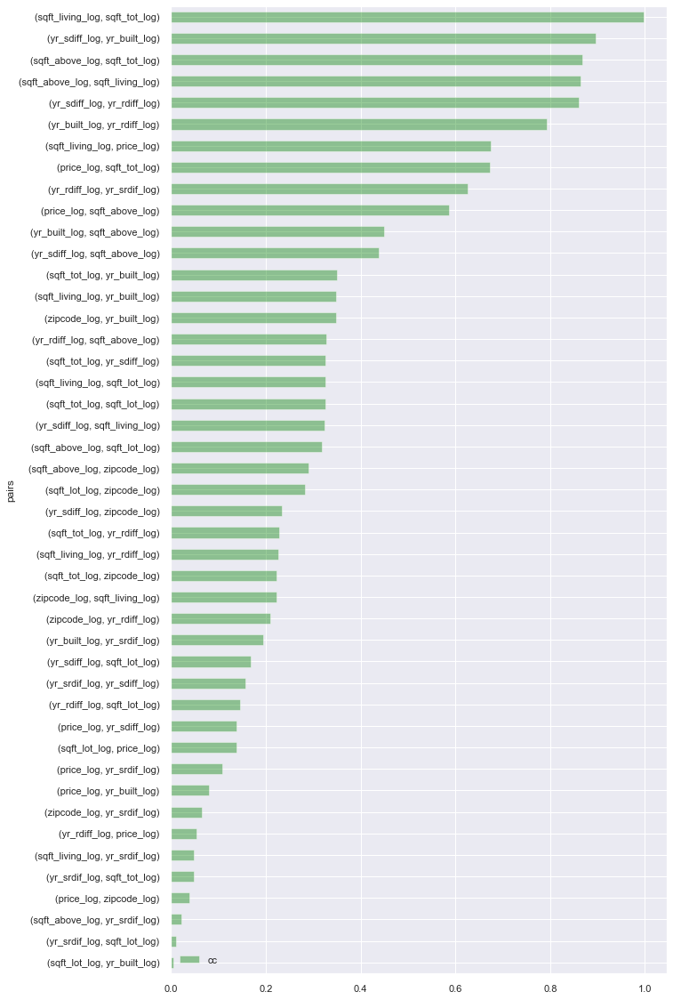

In [99]:
cc1pairs_update_df = cc1pairs_df[cc1pairs_df.cc<1]
cc1pairs_update_df.plot.barh(figsize=(10,20), color='green', alpha=0.4)

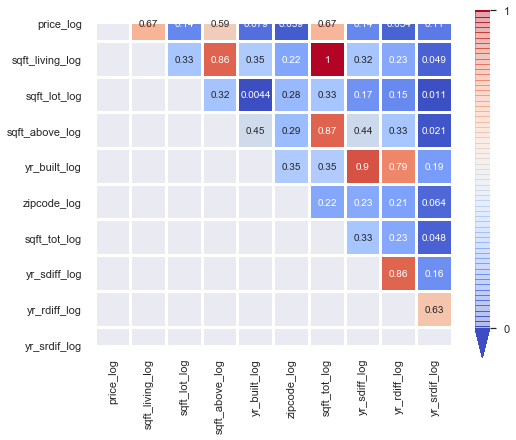

In [100]:
plt.figure(figsize=(8,8))
cbar_kws = {"orientation":"vertical", 
            "shrink":0.8,
            'extend':'min', 
            'extendfrac':0.1, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_log_norm.corr().abs(), mask=np.tril(kc_log_norm.corr().abs()), cmap='coolwarm', center=0.5, linewidths=2, square= True, annot=True, cbar_kws=cbar_kws)
plt.show()

In [101]:
def corrfunc(x, y, **kws):
    (r, p) = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate(r"$\rho$ = " + str(round(r, 2)), xy=(.1, 1.), size=15, xycoords=ax.transAxes)
    ax.annotate(f"p = {p:.3f}", xy=(.6, 1.), size=15, xycoords=ax.transAxes)

In [102]:
def corr(x, y, **kwargs):
    
    # Calculate the value
    coef = np.corrcoef(x, y)[0][1]
    # Make the label
    label = r'$\rho$ = ' + str(round(coef, 2))
    
    # Add the label to the plot
    ax = plt.gca()
    ax.annotate(label, xy = (.2, .95), size=20, xycoords = ax.transAxes)

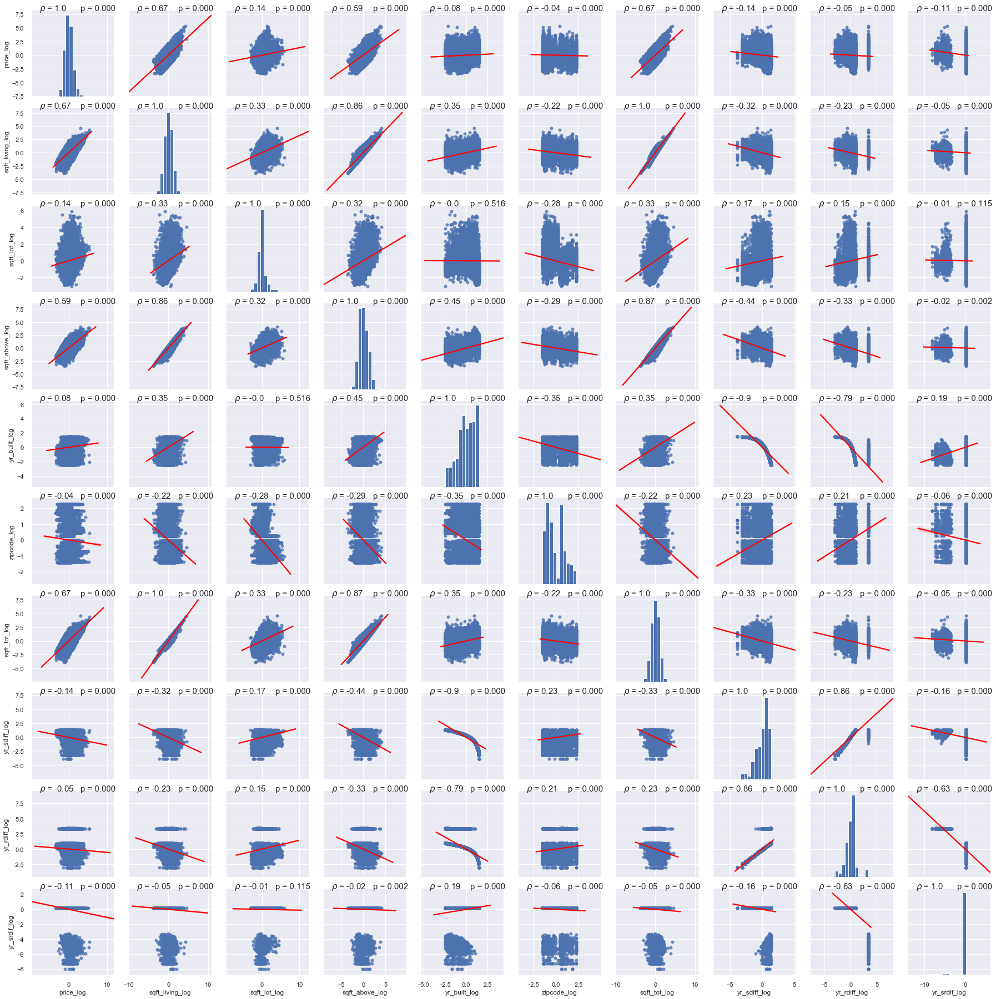

In [103]:
#cont_cols = ['price','sqft_living','sqft_lot','sqft_above','sqft_basement','sqft_living15','sqft_lot15',
#             'yr_built','zipcode']
#cont_feats = ['price','sqft_living','sqft_lot','yr_built','zipcode']
cont_feats = list(kc_log_norm.columns)
g = sns.pairplot(kc_log_norm, vars = cont_feats, kind='reg', plot_kws={'line_kws':{'color':'red'}})
g.map(corrfunc)
plt.show()

### categorical features

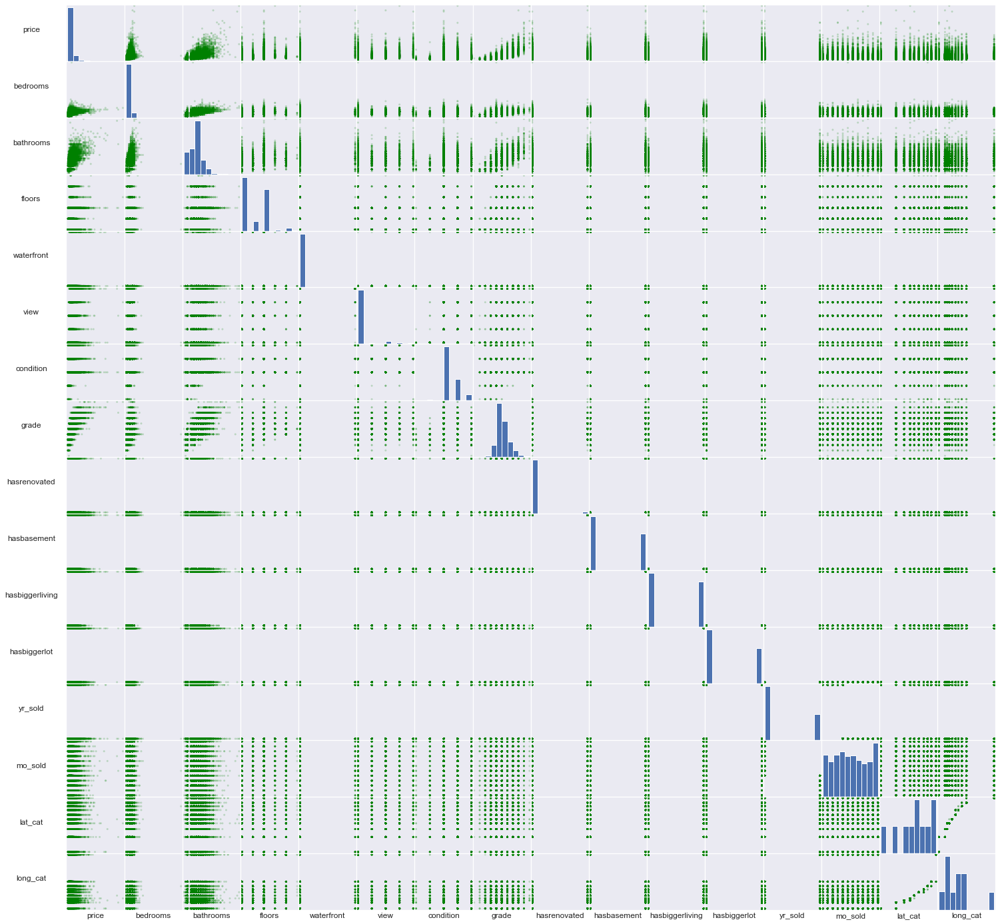

In [104]:
sm = pd.plotting.scatter_matrix(kc_categorical, color='green', alpha=0.2, figsize=[25, 25]);

# Rotates the text
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]

# May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.6,0.5) for s in sm.reshape(-1)]

# Hide all ticks
[s.set_xticks(()) for s in sm.reshape(-1)]
[s.set_yticks(()) for s in sm.reshape(-1)]

plt.show()

In [105]:
kc_categorical.corr()

,price,bedrooms,bathrooms,floors,waterfront,view,condition,grade,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold,lat_cat,long_cat
price,1.000000,0.308787,0.525906,0.256804,0.264306,0.393497,0.036056,0.667951,0.117543,0.175472,0.225865,0.057116,0.003727,-0.009928,0.023188,0.042408
bedrooms,0.308787,1.000000,0.514508,0.177944,-0.002127,0.078354,0.026496,0.356563,0.017635,0.158345,0.365105,0.080793,-0.009949,-0.001046,0.006861,0.019641
bathrooms,0.525906,0.514508,1.000000,0.502582,0.063629,0.186016,-0.126479,0.665838,0.046742,0.157747,0.342441,0.077283,-0.026577,0.007543,0.090670,0.175299
floors,0.256804,0.177944,0.502582,1.000000,0.020797,0.028414,-0.264075,0.458794,0.003713,-0.248292,0.129568,-0.020206,-0.022352,0.014245,0.154828,0.292114
waterfront,0.264306,-0.002127,0.063629,0.020797,1.000000,0.380543,0.016648,0.082818,0.074267,0.039933,0.022118,0.010286,-0.005018,0.008199,-0.010250,-0.010985
view,0.393497,0.078354,0.186016,0.028414,0.380543,1.000000,0.045622,0.249082,0.090480,0.176662,0.062615,0.038263,0.001239,-0.005161,-0.011949,-0.028169
condition,0.036056,0.026496,-0.126479,-0.264075,0.016648,0.045622,1.000000,-0.146896,-0.055383,0.129050,0.056044,-0.011143,-0.045898,0.022388,-0.083086,-0.157999
grade,0.667951,0.356563,0.665838,0.458794,0.082818,0.249082,-0.146896,1.000000,0.015259,0.049619,0.213058,0.068825,-0.030635,0.008989,0.069723,0.137171
hasrenovated,0.117543,0.017635,0.046742,0.003713,0.074267,0.090480,-0.055383,0.015259,1.000000,0.046963,0.057141,-0.007273,-0.019699,0.007659,-0.019621,-0.039536
hasbasement,0.175472,0.158345,0.157747,-0.248292,0.039933,0.176662,0.129050,0.049619,0.046963,1.000000,0.243569,-0.002273,-0.008205,0.005984,-0.018162,-0.034526


In [106]:
cc2_df = kc_categorical.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc2_df.head())
cc2_df['pairs'] = list(zip(cc2_df.level_0, cc2_df.level_1))
cc2pairs_df = cc2_df.set_index('pairs')
cc2pairs_df = cc2pairs_df.drop(['level_1', 'level_0'], axis=1)
cc2pairs_df.columns = ['cc']
cc2pairs_df = cc2pairs_df.drop_duplicates(keep='first')
cc2pairs_df.head()

      level_0   level_1         0
237   lat_cat   mo_sold  0.000139
222   mo_sold   lat_cat  0.000139
209   mo_sold  bedrooms  0.001046
29   bedrooms   mo_sold  0.001046
197   yr_sold      view  0.001239


,cc
pairs,
"(lat_cat, mo_sold)",0.000139
"(mo_sold, bedrooms)",0.001046
"(yr_sold, view)",0.001239
"(lat_cat, yr_sold)",0.001726
"(long_cat, yr_sold)",0.001867


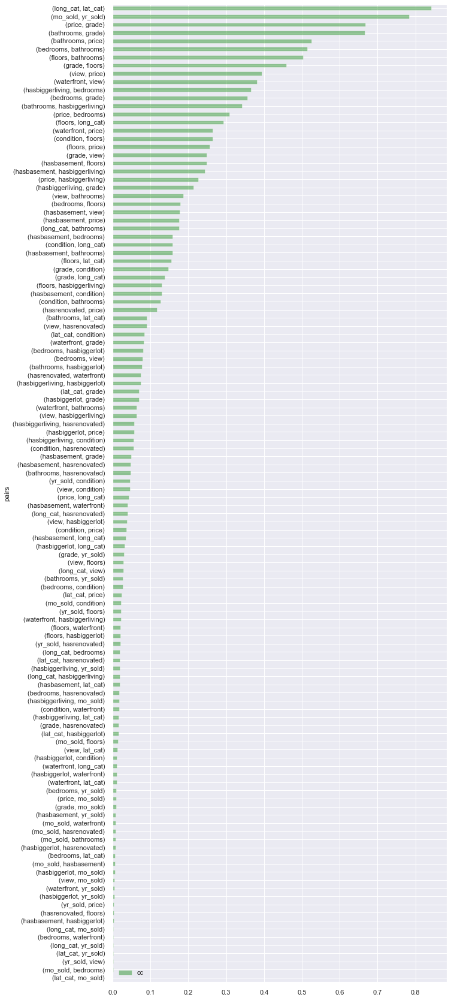

In [107]:
cc2pairs_update_df = cc2pairs_df[cc2pairs_df.cc<1]
cc2pairs_update_df.plot.barh(figsize=(10,30), color='green', alpha=0.4)

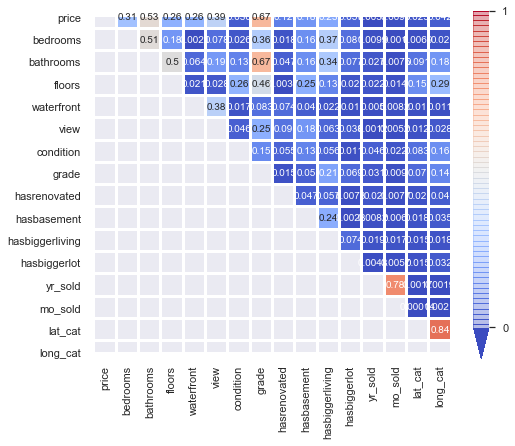

In [108]:
plt.figure(figsize=(8,8))
cbar_kws = {"orientation":"vertical", 
            "shrink":0.8,
            'extend':'min', 
            'extendfrac':0.1, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_categorical.corr().abs(), mask=np.tril(kc_categorical.corr().abs()), cmap='coolwarm', center=0.5, linewidths=2, square= True, annot=True, cbar_kws=cbar_kws)
plt.show()

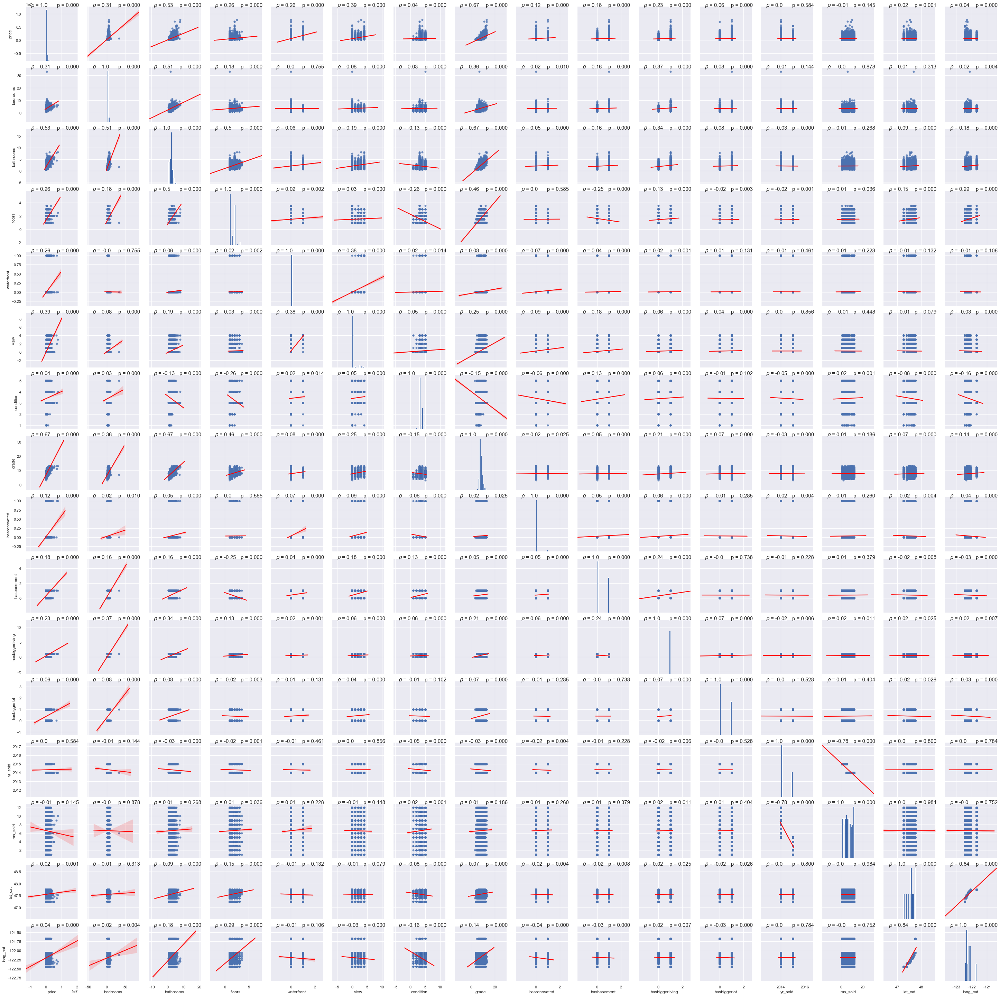

In [109]:
#cate_feats = ['price','bathrooms','view','grade']
cate_feats = list(kc_categorical.columns)
g = sns.pairplot(kc_categorical, vars = cate_feats, kind='reg', plot_kws={'line_kws':{'color':'red'}})
g.map(corrfunc)
plt.show()

## combine categorical and continuous features

In [111]:
#all_feats = categorical + continuous
#kc_all = kc10.loc[:, all_feats]
#kc_all = kc_all.loc[:,~kc_all.columns.duplicated()]
kc_preprocessed = pd.concat([kc_log_norm,kc_categorical],axis=1)
#kc_preprocessed = kc_preprocessed.drop(['price'],axis=1)
print(kc_preprocessed.shape)
kc_preprocessed.head()
#print(kc_all.shape)
#kc_all.head()

(21597, 26)


,price_log,sqft_living_log,sqft_lot_log,sqft_above_log,yr_built_log,zipcode_log,sqft_tot_log,yr_sdiff_log,yr_rdiff_log,yr_srdif_log,...,condition,grade,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold,lat_cat,long_cat
0,-1.401998,-1.125556,-0.388430,-0.753565,-0.537409,1.869128,-1.130352,0.662581,0.423931,0.184989,...,3,7,0.0,0.0,0,0,2014,10,47.2531,-122.445
1,0.279938,0.709446,-0.113241,0.672693,-0.674325,0.879349,0.710370,0.732145,3.370236,-4.558489,...,3,7,1.0,1.0,1,0,2014,12,47.2531,-122.445
2,-1.799430,-2.131893,0.244475,-1.752954,-1.293945,-0.933519,-2.139827,1.013002,0.681877,0.185525,...,3,6,0.0,0.0,0,1,2015,2,47.2531,-122.445
3,0.499698,0.070674,-0.523914,-1.026835,-0.196338,1.084819,0.069607,0.466476,0.273964,0.184989,...,5,7,0.0,1.0,1,0,2014,12,47.2531,-122.445
4,0.178434,-0.292725,0.008139,0.073515,0.547946,-0.073585,-0.294925,-0.114701,-0.198875,0.185525,...,3,8,0.0,0.0,0,1,2015,2,47.2531,-122.445


In [112]:
kc_preprocessed.corr()

,price_log,sqft_living_log,sqft_lot_log,sqft_above_log,yr_built_log,zipcode_log,sqft_tot_log,yr_sdiff_log,yr_rdiff_log,yr_srdif_log,...,condition,grade,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold,lat_cat,long_cat
price_log,1.000000,0.674802,0.138261,0.586013,0.078987,-0.038757,0.673215,-0.138602,-0.053949,-0.108731,...,0.038918,0.703720,0.106528,0.206368,0.252229,0.052922,0.004972,-0.013064,0.035062,0.062658
sqft_living_log,0.674802,1.000000,0.325983,0.864979,0.348973,-0.222133,0.997191,-0.324153,-0.226191,-0.048719,...,-0.049620,0.743038,0.047137,0.229867,0.503164,0.126463,-0.029434,0.012456,0.036191,0.073226
sqft_lot_log,0.138261,0.325983,1.000000,0.318663,-0.004421,-0.281727,0.325428,0.168499,0.145358,-0.010731,...,0.073694,0.184323,0.017463,-0.050971,0.087461,0.294450,-0.006687,-0.000047,-0.115493,-0.214973
sqft_above_log,0.586013,0.864979,0.318663,1.000000,0.450023,-0.290337,0.867203,-0.438038,-0.326669,-0.021178,...,-0.150730,0.742869,0.023356,-0.212167,0.348220,0.123183,-0.024607,0.011200,0.059627,0.116510
yr_built_log,0.078987,0.348973,-0.004421,0.450023,1.000000,-0.348060,0.350813,-0.895312,-0.793826,0.194491,...,-0.360253,0.446702,-0.203131,-0.163408,0.036836,0.033994,0.003649,-0.006286,0.169482,0.325941
zipcode_log,-0.038757,-0.222133,-0.281727,-0.290337,-0.348060,1.000000,-0.222759,0.232905,0.209309,-0.063956,...,0.002875,-0.185763,0.062377,0.161222,0.019083,-0.088807,0.001288,-0.000142,-0.000789,-0.007793
sqft_tot_log,0.673215,0.997191,0.325428,0.867203,0.350813,-0.222759,1.000000,-0.326141,-0.227800,-0.048465,...,-0.053164,0.743009,0.046969,0.232141,0.499936,0.126432,-0.029245,0.012801,0.037588,0.074681
yr_sdiff_log,-0.138602,-0.324153,0.168499,-0.438038,-0.895312,0.232905,-0.326141,1.000000,0.861227,-0.157546,...,0.376784,-0.430547,0.163030,0.163968,-0.049339,0.005961,0.023701,-0.018143,-0.257746,-0.494593
yr_rdiff_log,-0.053949,-0.226191,0.145358,-0.326669,-0.793826,0.209309,-0.227800,0.861227,1.000000,-0.625447,...,0.264871,-0.325007,0.637861,0.150140,-0.009799,0.002634,-0.011855,0.005828,-0.212370,-0.409123
yr_srdif_log,-0.108731,-0.048719,-0.010731,-0.021178,0.194491,-0.063956,-0.048465,-0.157546,-0.625447,1.000000,...,0.063370,-0.019273,-0.980306,-0.051521,-0.059840,0.010490,0.021706,-0.008686,0.019482,0.038071


In [113]:
cc3_df = kc_preprocessed.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc3_df.head())
cc3_df['pairs'] = list(zip(cc3_df.level_0, cc3_df.level_1))
cc3pairs_df = cc3_df.set_index('pairs')
cc3pairs_df = cc3pairs_df.drop(['level_1', 'level_0'], axis=1)
cc3pairs_df.columns = ['cc']
cc3pairs_df = cc3pairs_df.drop_duplicates(keep='first')
cc3pairs_df.head()

          level_0       level_1         0
600       mo_sold  sqft_lot_log  0.000047
75   sqft_lot_log       mo_sold  0.000047
647       lat_cat       mo_sold  0.000139
622       mo_sold       lat_cat  0.000139
603       mo_sold   zipcode_log  0.000142


,cc
pairs,
"(mo_sold, sqft_lot_log)",0.000047
"(lat_cat, mo_sold)",0.000139
"(mo_sold, zipcode_log)",0.000142
"(zipcode_log, lat_cat)",0.000789
"(mo_sold, bedrooms)",0.001046


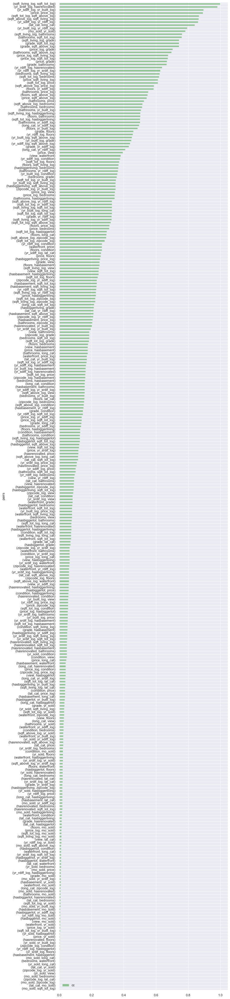

In [115]:
cc3pairs_update_df = cc3pairs_df[cc3pairs_df.cc<1]
cc3pairs_update_df.plot.barh(figsize=(10,60), color='green', alpha=0.4)

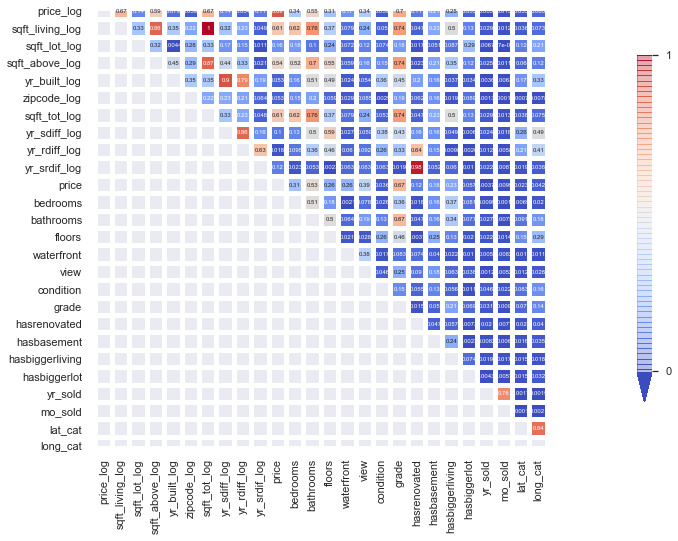

In [117]:
plt.figure(figsize=(32,8))
cbar_kws = {"orientation":"vertical", 
            "shrink":0.8,
            'extend':'min', 
            'extendfrac':0.1, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_preprocessed.corr().abs(), mask=np.tril(kc_preprocessed.corr().abs()), cmap="coolwarm", center=0.5, linewidths=4, square= True, annot=True, annot_kws={"fontsize":6}, cbar_kws=cbar_kws)
plt.show()

## make a data decision: investigate multicollinearity

In [118]:
ccpairs_kc = cc3pairs_df[(abs(cc3pairs_df.cc) > 0.75) & (abs(cc3pairs_df.cc) < 1)]
ccpairs_kc

,cc
pairs,
"(bathrooms, sqft_tot_log)",0.760341
"(sqft_living_log, bathrooms)",0.762135
"(mo_sold, yr_sold)",0.782325
"(yr_built_log, yr_rdiff_log)",0.793826
"(lat_cat, long_cat)",0.840875
"(yr_sdiff_log, yr_rdiff_log)",0.861227
"(sqft_above_log, sqft_living_log)",0.864979
"(sqft_tot_log, sqft_above_log)",0.867203
"(price, price_log)",0.891745


In [121]:
x_cols = list(kc_preprocessed.columns)
vif = [variance_inflation_factor(kc_preprocessed.values, i) for i in range(kc_preprocessed.shape[1])]
list(zip(x_cols, vif))

[('price_log', 6.331020024927205),
 ('sqft_living_log', 184.90423667286834),
 ('sqft_lot_log', 1.8831246801226966),
 ('sqft_above_log', 18.43364160343439),
 ('yr_built_log', 8.03064204733009),
 ('zipcode_log', 1.3539909994290527),
 ('sqft_tot_log', 196.05940153842002),
 ('yr_sdiff_log', 195.56884584414405),
 ('yr_rdiff_log', 289.20504004011747),
 ('yr_srdif_log', 26.684890039355587),
 ('price', 18.017954593773045),
 ('bedrooms', 25.505323554689816),
 ('bathrooms', 29.239634526224194),
 ('floors', 21.791506125173857),
 ('waterfront', 1.2542098777316972),
 ('view', 1.5081800732257424),
 ('condition', 36.02203320068416),
 ('grade', 165.82328227578495),
 ('hasrenovated', 92.32227881519604),
 ('hasbasement', 7.005897272535815),
 ('hasbiggerliving', 2.8503392277354997),
 ('hasbiggerlot', 1.8341211743261379),
 ('yr_sold', 3631548.783644055),
 ('mo_sold', 6.634281619130778),
 ('lat_cat', 403699.4992698196),
 ('long_cat', 1792695.6955229826)]

remove the chosen variables from kc_preprocessed.

* sqft_tot_log: equivalent to **sqft_above_log + hasbasement**

* sqft_living_log: same as above

* yr_rdiff_log: equivalent to **hasrenovated**

* yr_sold: equivalent to **yr_sdiff** = **yr_sold - yr_built**

* yr_built_log: same as above

* yr_srdif_log: equivalent to **yr_sdiff + hasrenovated**

* long_cat: equivalent to **lat_cat + zipcode**

* price: redundant 

In [131]:
kc_preprocessed_v2 = kc_preprocessed.drop(['sqft_tot_log','sqft_living_log','yr_rdiff_log','yr_sold','yr_built_log','yr_srdif_log','long_cat','price'],axis=1)
kc_preprocessed_v2.head()

,price_log,sqft_lot_log,sqft_above_log,zipcode_log,yr_sdiff_log,bedrooms,bathrooms,floors,waterfront,view,condition,grade,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,mo_sold,lat_cat
0,-1.401998,-0.388430,-0.753565,1.869128,0.662581,3,1.00,1.0,0.0,0.0,3,7,0.0,0.0,0,0,10,47.2531
1,0.279938,-0.113241,0.672693,0.879349,0.732145,3,2.25,2.0,0.0,0.0,3,7,1.0,1.0,1,0,12,47.2531
2,-1.799430,0.244475,-1.752954,-0.933519,1.013002,2,1.00,1.0,0.0,0.0,3,6,0.0,0.0,0,1,2,47.2531
3,0.499698,-0.523914,-1.026835,1.084819,0.466476,4,3.00,1.0,0.0,0.0,5,7,0.0,1.0,1,0,12,47.2531
4,0.178434,0.008139,0.073515,-0.073585,-0.114701,3,2.00,1.0,0.0,0.0,3,8,0.0,0.0,0,1,2,47.2531


In [133]:
cc4_df = kc_preprocessed_v2.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc3_df.head())
cc4_df['pairs'] = list(zip(cc4_df.level_0, cc4_df.level_1))
cc4pairs_df = cc4_df.set_index('pairs')
cc4pairs_df = cc4pairs_df.drop(['level_1', 'level_0'], axis=1)
cc4pairs_df.columns = ['cc']
cc4pairs_df = cc4pairs_df.drop_duplicates(keep='first')
cc4pairs_df.head()

          level_0       level_1         0                    pairs
600       mo_sold  sqft_lot_log  0.000047  (mo_sold, sqft_lot_log)
75   sqft_lot_log       mo_sold  0.000047  (sqft_lot_log, mo_sold)
647       lat_cat       mo_sold  0.000139       (lat_cat, mo_sold)
622       mo_sold       lat_cat  0.000139       (mo_sold, lat_cat)
603       mo_sold   zipcode_log  0.000142   (mo_sold, zipcode_log)


,cc
pairs,
"(sqft_lot_log, mo_sold)",0.000047
"(mo_sold, lat_cat)",0.000139
"(mo_sold, zipcode_log)",0.000142
"(zipcode_log, lat_cat)",0.000789
"(bedrooms, mo_sold)",0.001046


In [134]:
x_cols = list(kc_preprocessed_v2.columns)
vif = [variance_inflation_factor(kc_preprocessed_v2.values, i) for i in range(kc_preprocessed_v2.shape[1])]
list(zip(x_cols, vif))

[('price_log', 2.6555911243449644),
 ('sqft_lot_log', 1.7956654452093925),
 ('sqft_above_log', 5.777702770099895),
 ('zipcode_log', 1.2822315107465458),
 ('yr_sdiff_log', 2.321068591544629),
 ('bedrooms', 24.093377922994726),
 ('bathrooms', 26.890506537641016),
 ('floors', 20.846852357123172),
 ('waterfront', 1.1938993823690567),
 ('view', 1.4819055599255426),
 ('condition', 35.49286128892837),
 ('grade', 152.74461106514946),
 ('hasrenovated', 1.1294504790792372),
 ('hasbasement', 3.2038689560627422),
 ('hasbiggerliving', 2.5863832392381862),
 ('hasbiggerlot', 1.8328303543962094),
 ('mo_sold', 5.473212845398637),
 ('lat_cat', 240.63038151935768)]

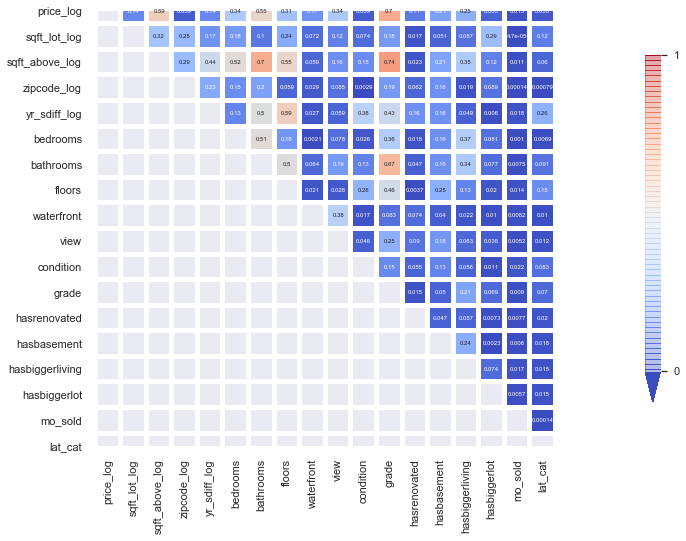

In [135]:
plt.figure(figsize=(32,8))
cbar_kws = {"orientation":"vertical", 
            "shrink":0.8,
            'extend':'min', 
            'extendfrac':0.1, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_preprocessed_v2.corr().abs(), mask=np.tril(kc_preprocessed_v2.corr().abs()), cmap="coolwarm", center=0.5, linewidths=4, square= True, annot=True, annot_kws={"fontsize":6}, cbar_kws=cbar_kws)
plt.show()

# modeling data: build baseline model
## simple linear regression

Note: uncomment lines below to process one-to-one simple linear regression fit

King Housing DataSet - Regression Analysis and Diagnostics for price_log~price_log
-------------------------------------------------------------------------------------


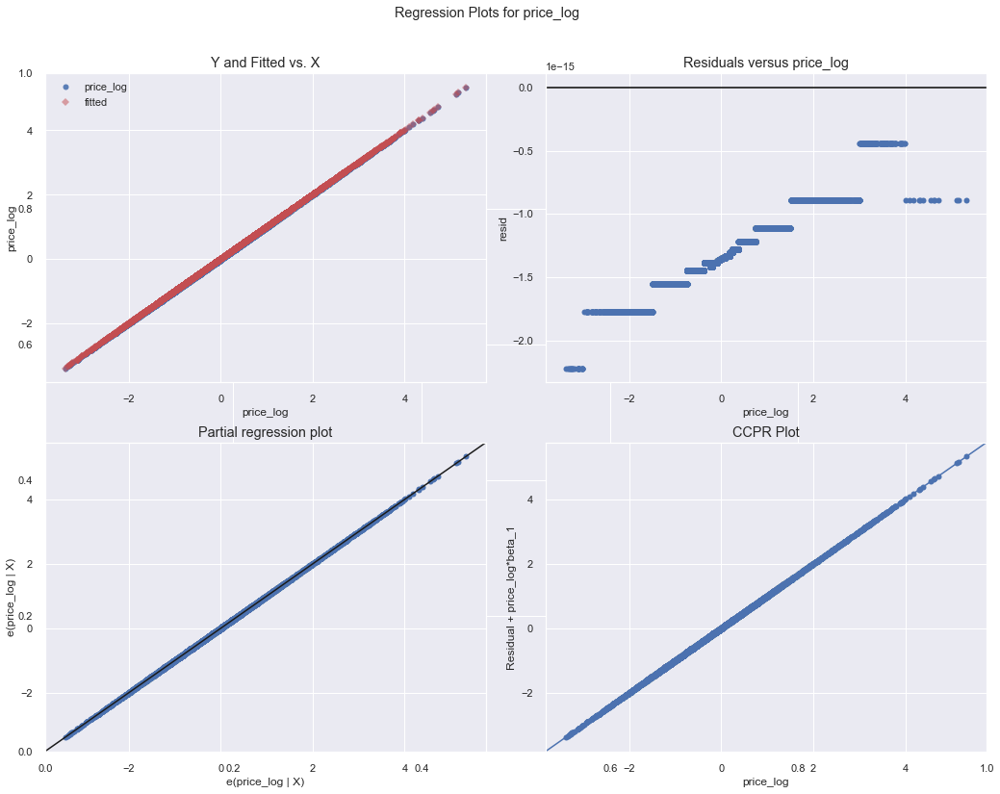

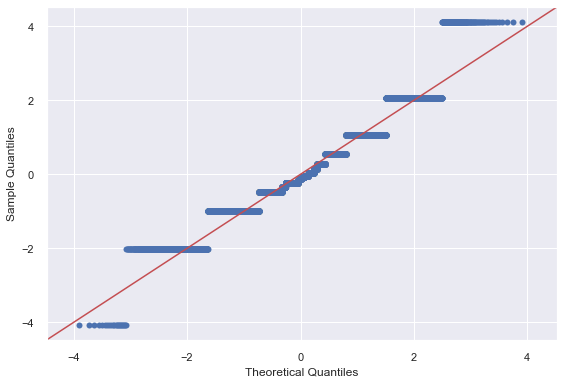

price_log: R2 1.000 , intercept 0.000 , slope 1.000 , p-value 0.000 , JB 2485.319
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~sqft_lot_log
-------------------------------------------------------------------------------------


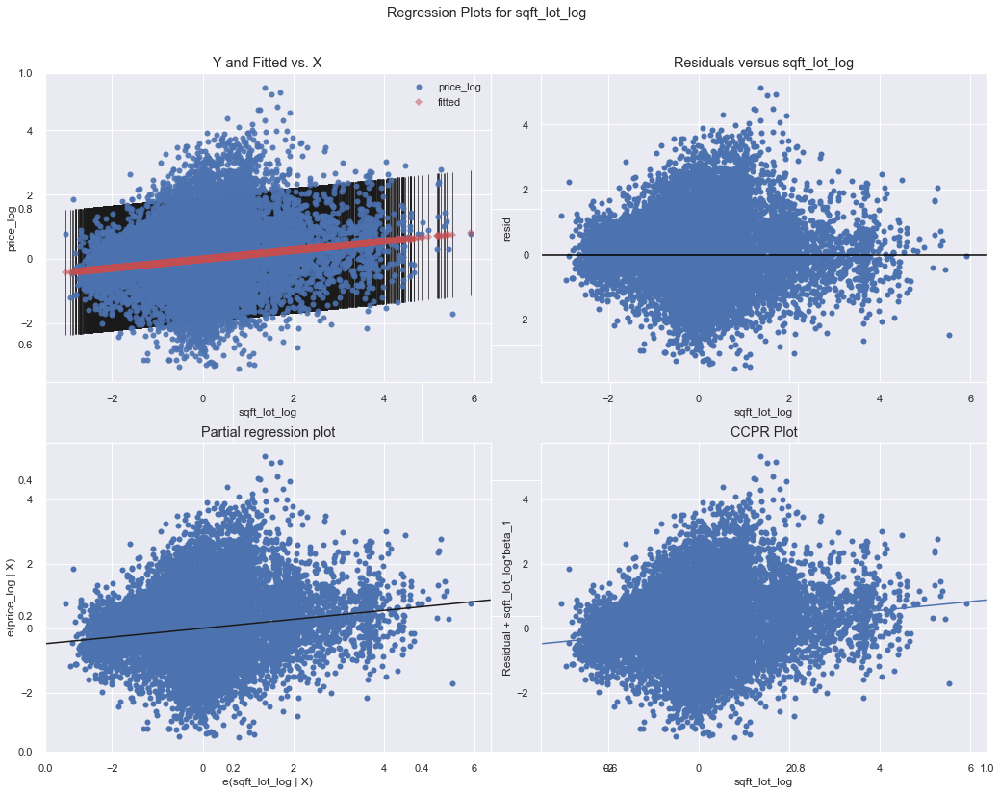

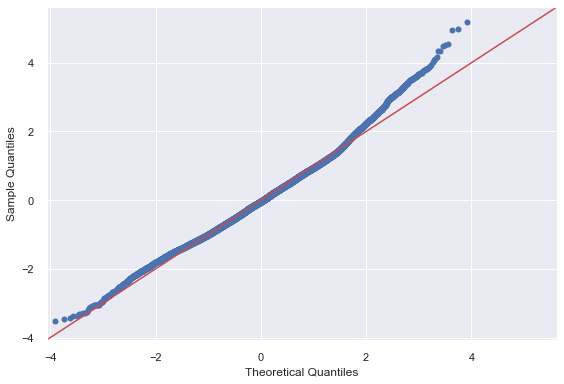

sqft_lot_log: R2 0.019 , intercept 0.000 , slope 0.138 , p-value 0.000 , JB 761.236
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~sqft_above_log
-------------------------------------------------------------------------------------


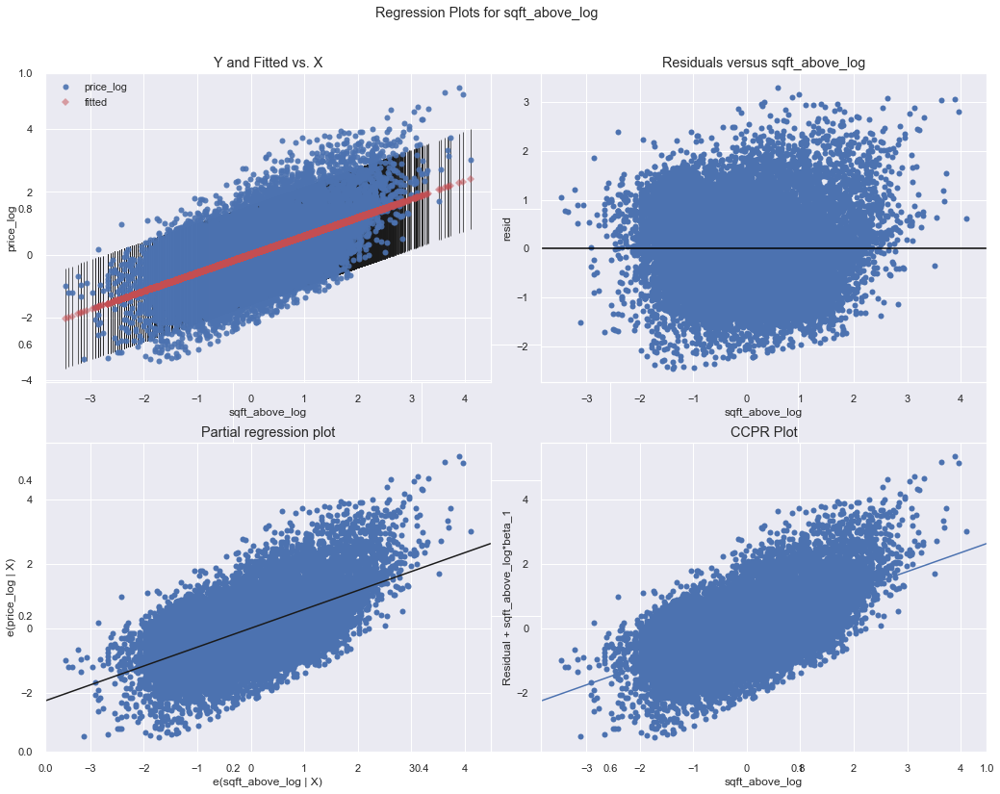

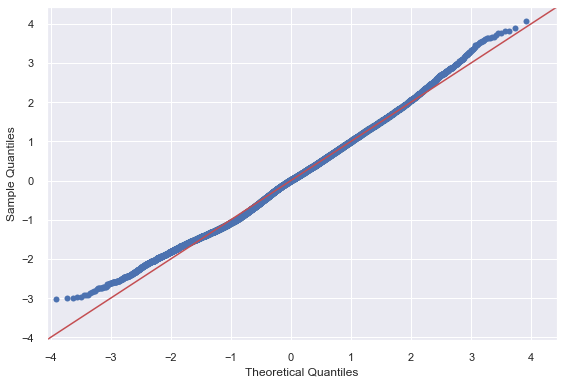

sqft_above_log: R2 0.343 , intercept 0.000 , slope 0.586 , p-value 0.000 , JB 139.438
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~zipcode_log
-------------------------------------------------------------------------------------


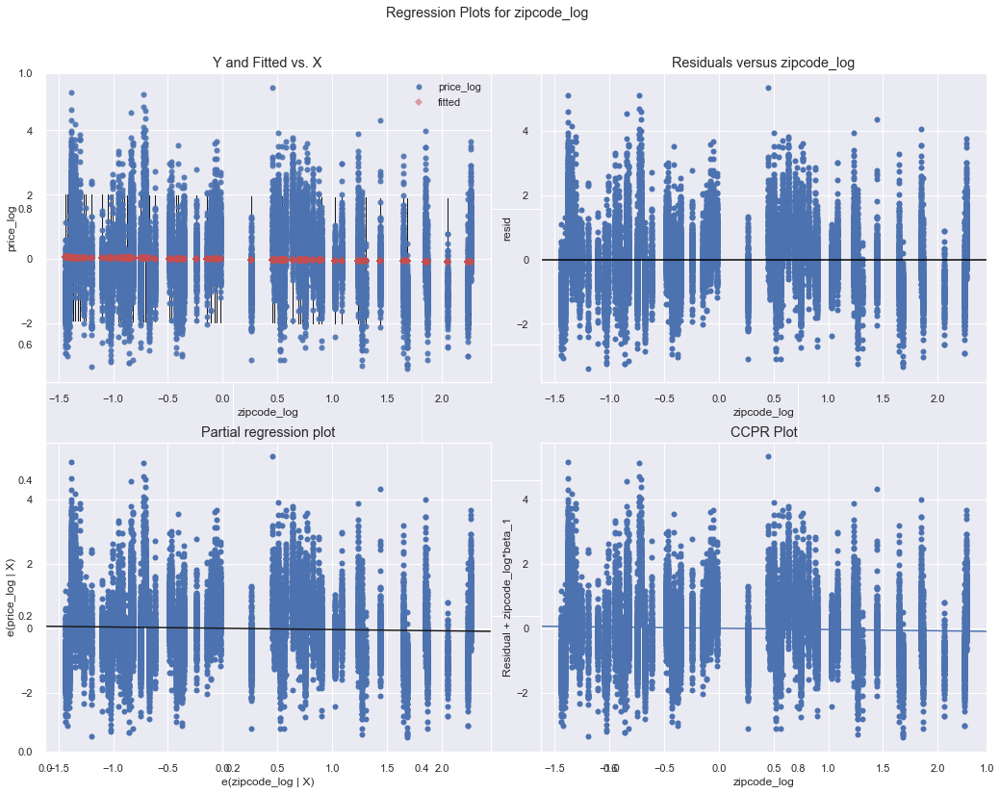

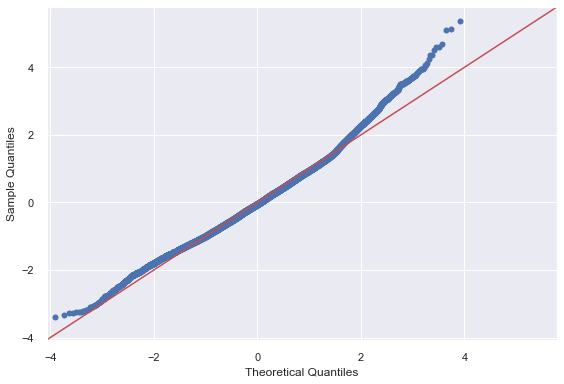

zipcode_log: R2 0.002 , intercept -0.000 , slope -0.039 , p-value 0.000 , JB 1042.738
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~yr_sdiff_log
-------------------------------------------------------------------------------------


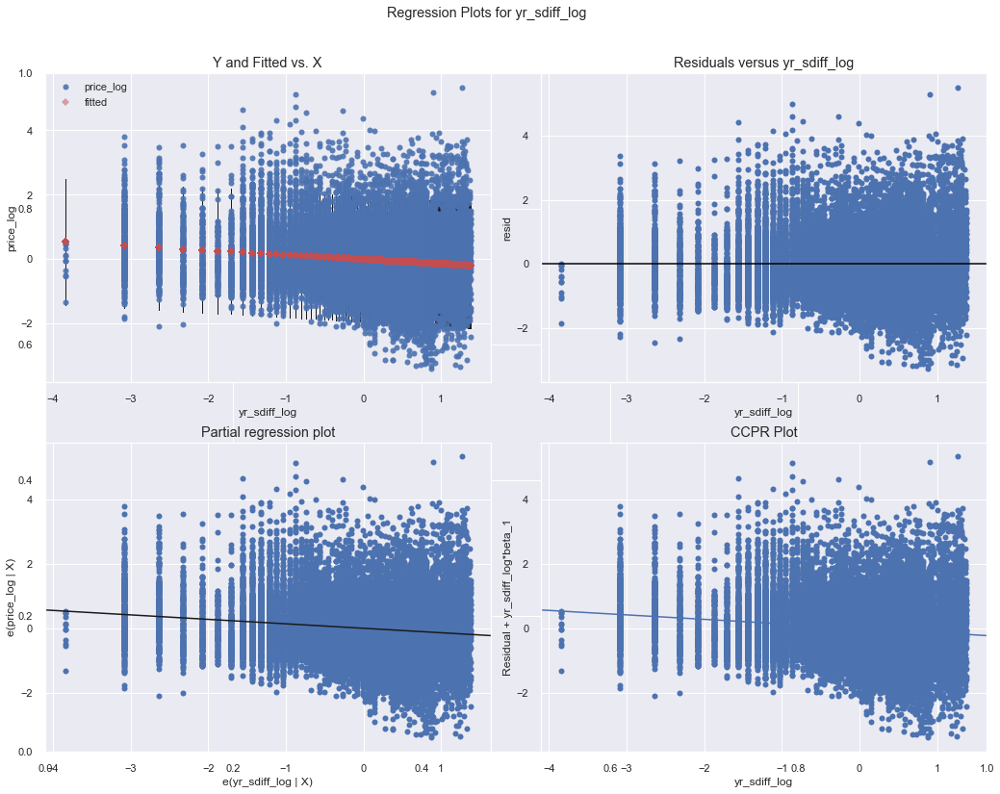

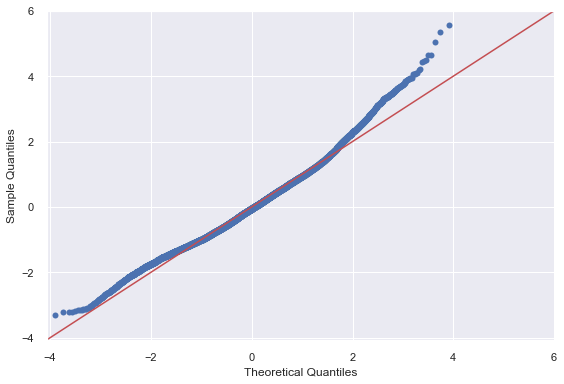

yr_sdiff_log: R2 0.019 , intercept 0.000 , slope -0.139 , p-value 0.000 , JB 1204.772
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~bedrooms
-------------------------------------------------------------------------------------


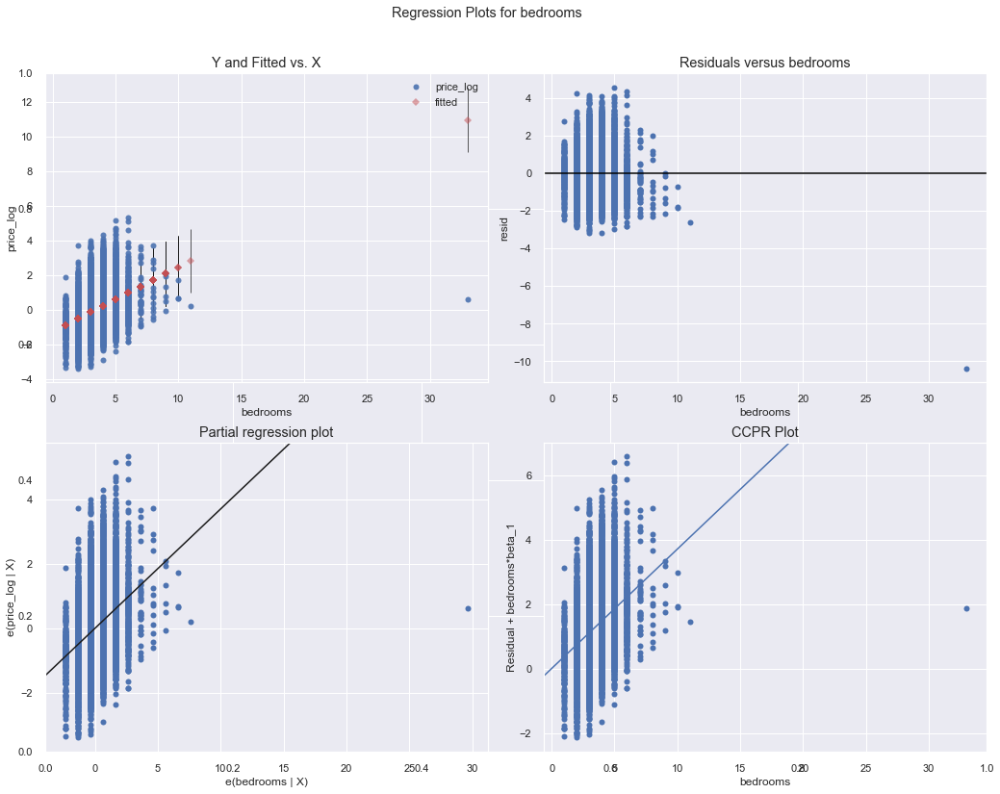

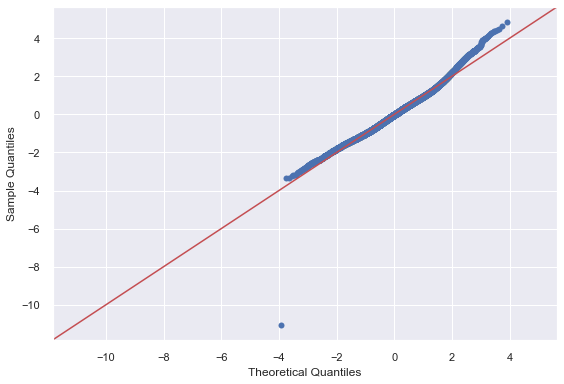

bedrooms: R2 0.118 , intercept -1.250 , slope 0.371 , p-value 0.000 , JB 1471.526
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~bathrooms
-------------------------------------------------------------------------------------


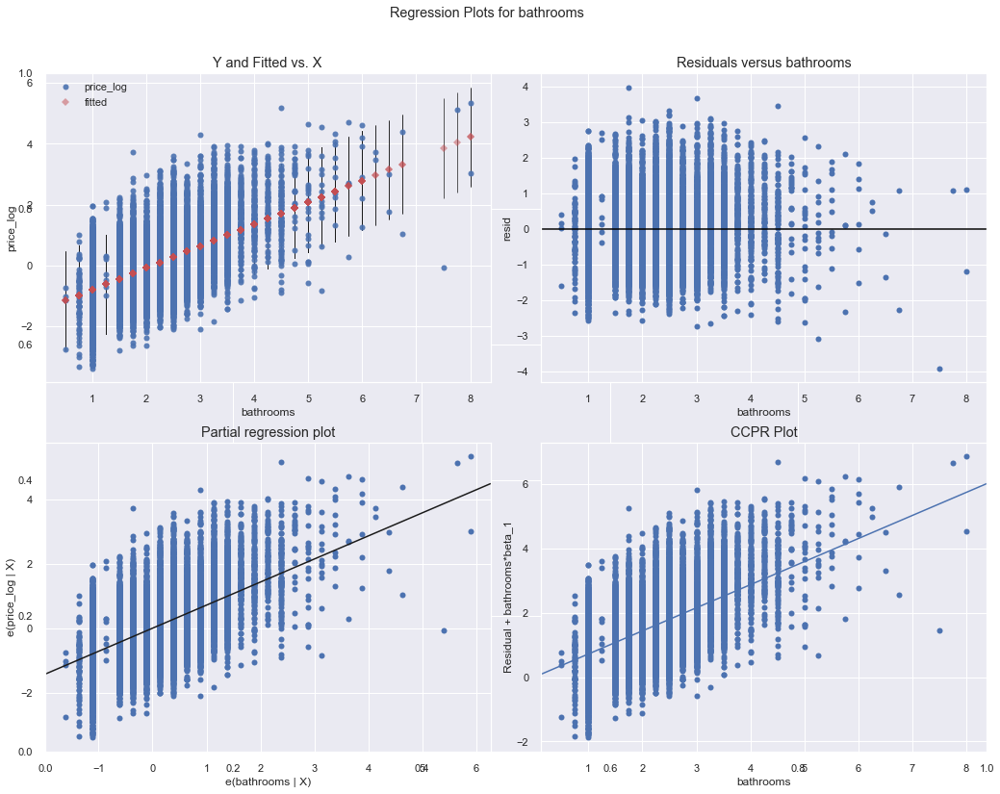

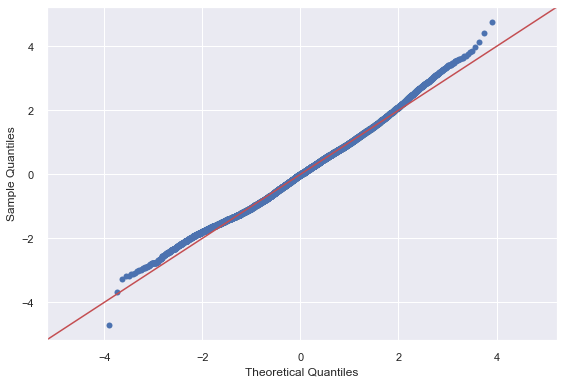

bathrooms: R2 0.304 , intercept -1.517 , slope 0.717 , p-value 0.000 , JB 196.538
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~floors
-------------------------------------------------------------------------------------


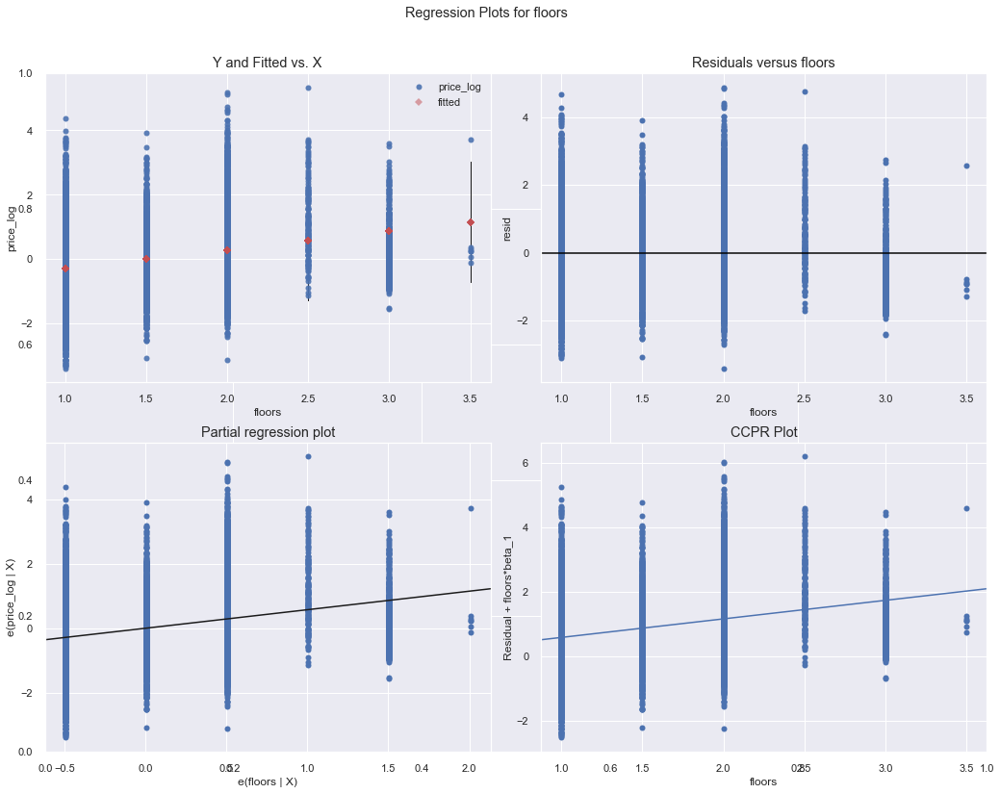

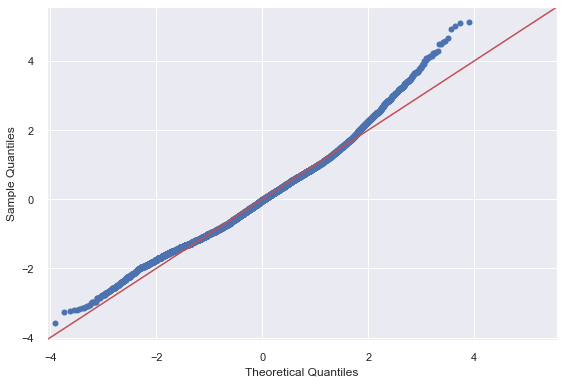

floors: R2 0.096 , intercept -0.860 , slope 0.576 , p-value 0.000 , JB 1031.279
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~waterfront
-------------------------------------------------------------------------------------


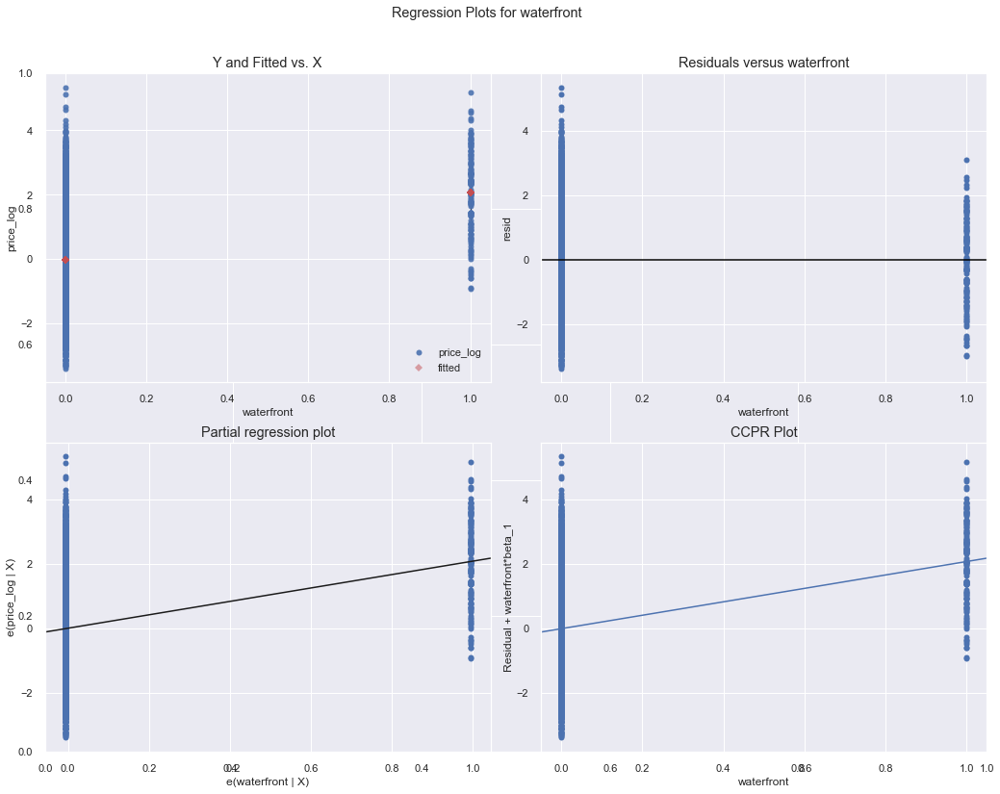

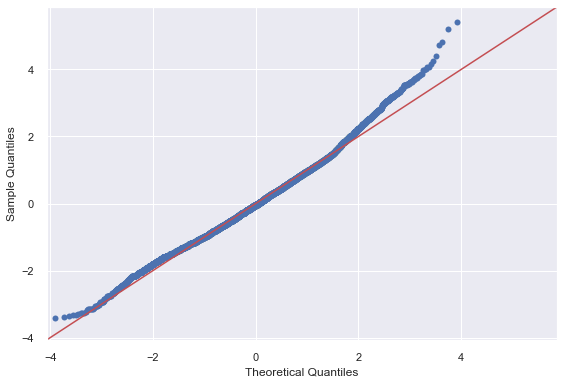

waterfront: R2 0.029 , intercept -0.014 , slope 2.083 , p-value 0.000 , JB 701.596
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~view
-------------------------------------------------------------------------------------


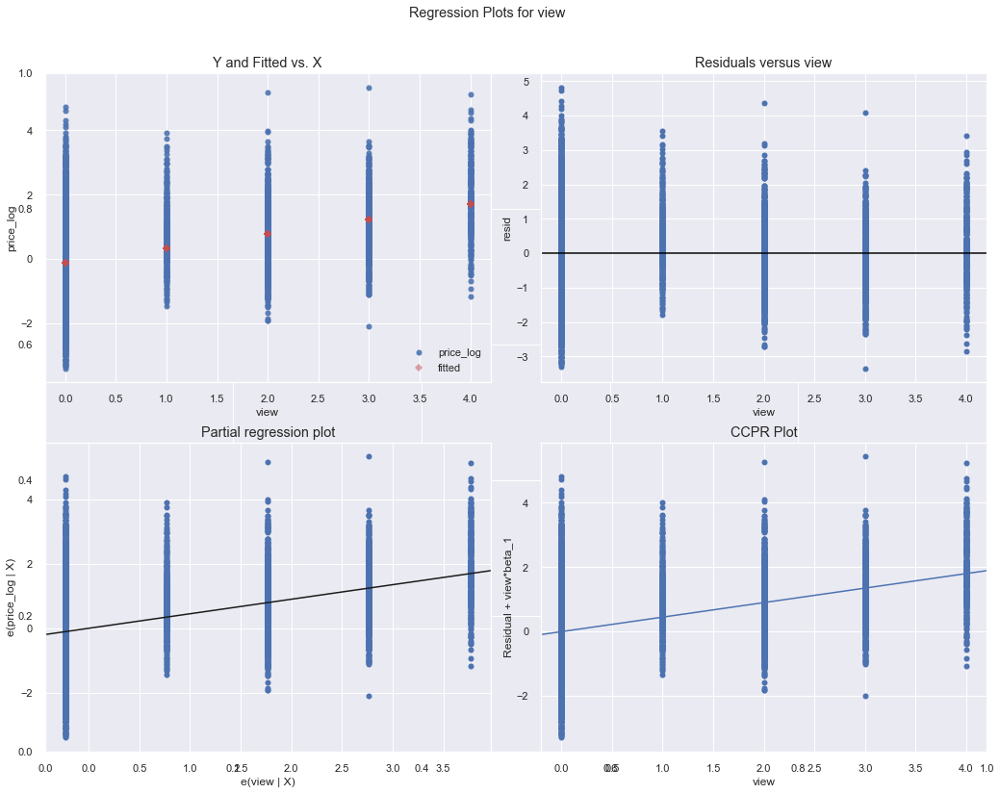

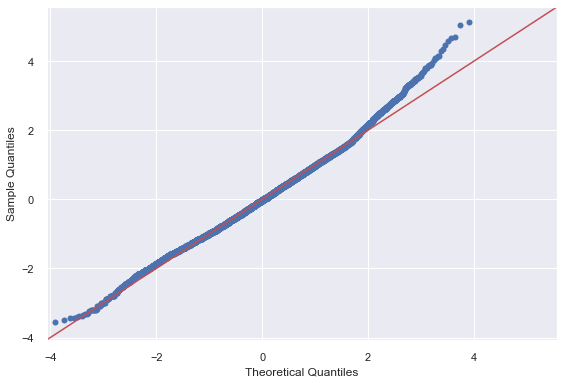

view: R2 0.119 , intercept -0.105 , slope 0.451 , p-value 0.000 , JB 436.570
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~condition
-------------------------------------------------------------------------------------


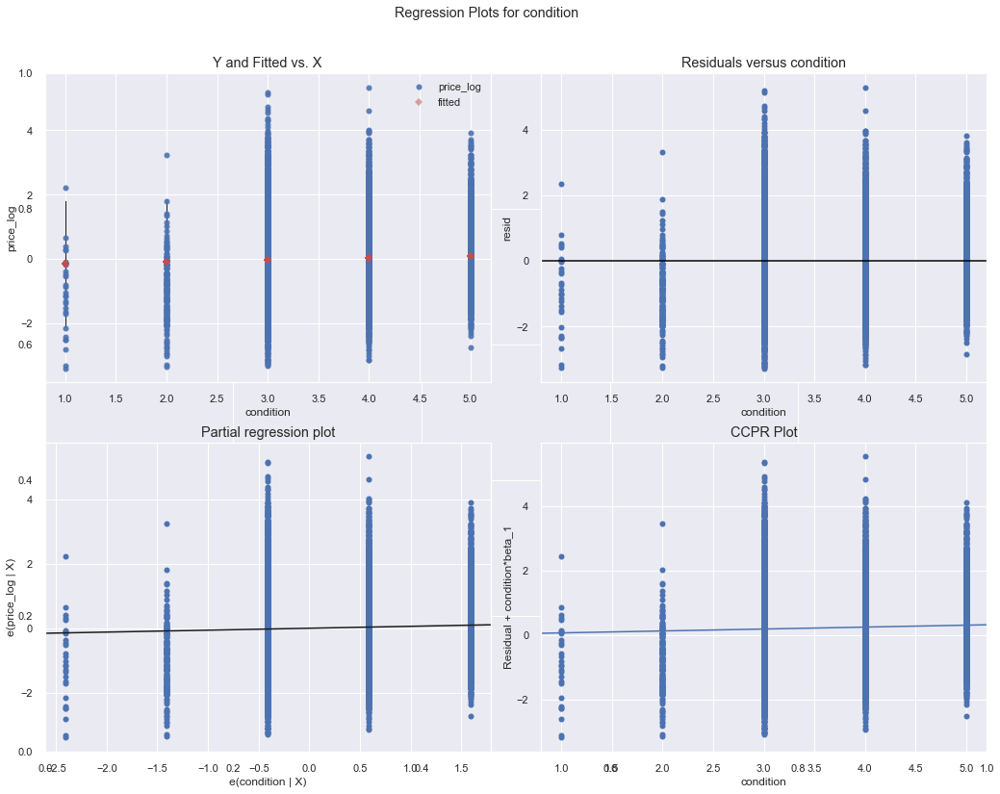

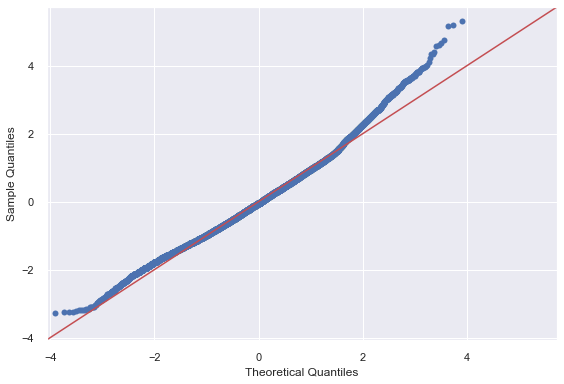

condition: R2 0.002 , intercept -0.204 , slope 0.060 , p-value 0.000 , JB 1086.243
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~grade
-------------------------------------------------------------------------------------


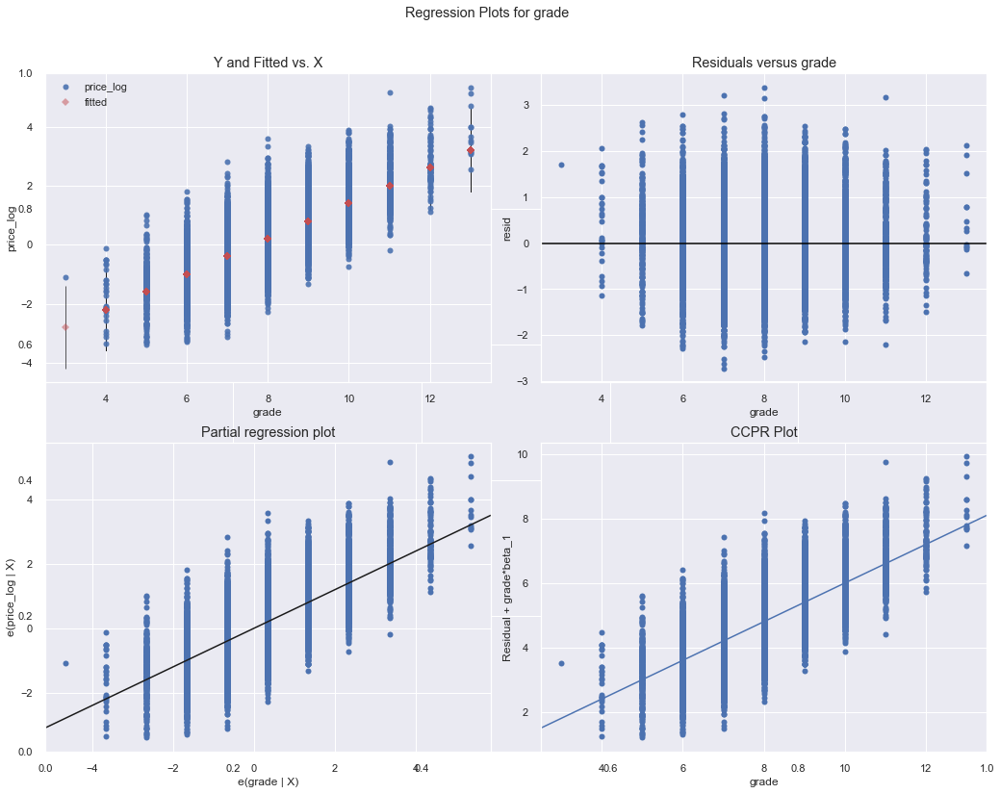

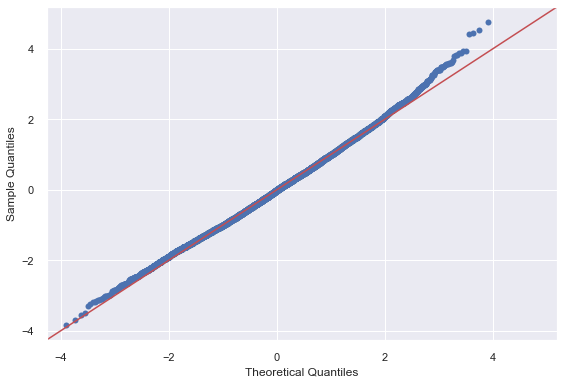

grade: R2 0.495 , intercept -4.593 , slope 0.600 , p-value 0.000 , JB 133.708
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasrenovated
-------------------------------------------------------------------------------------


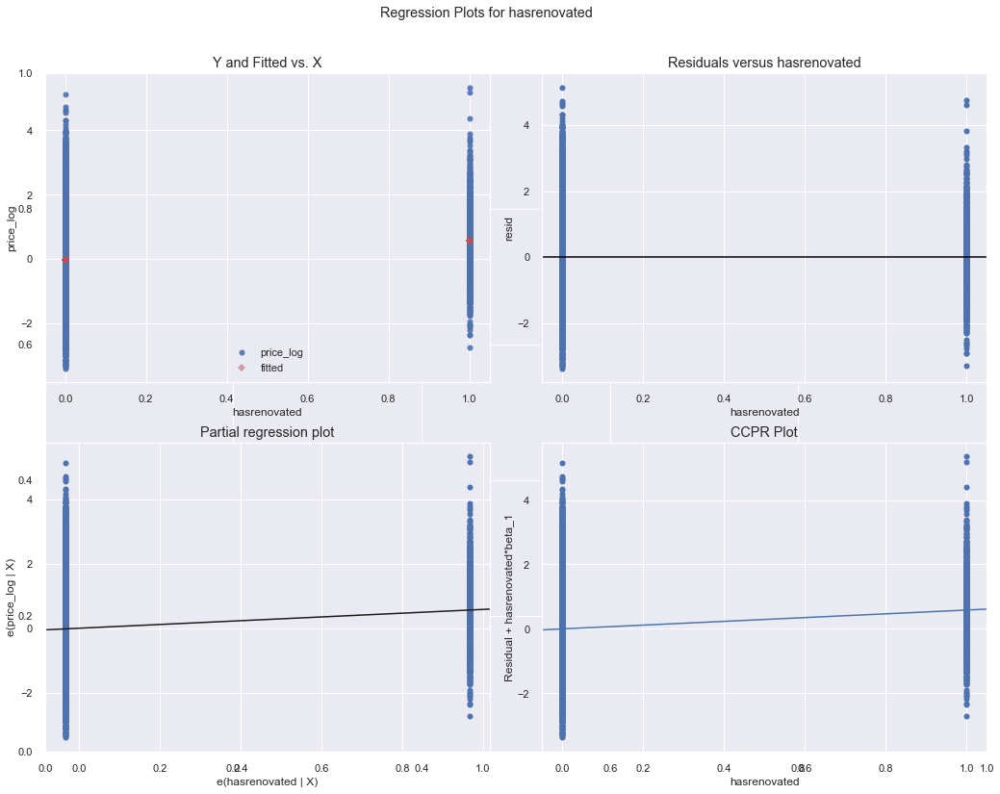

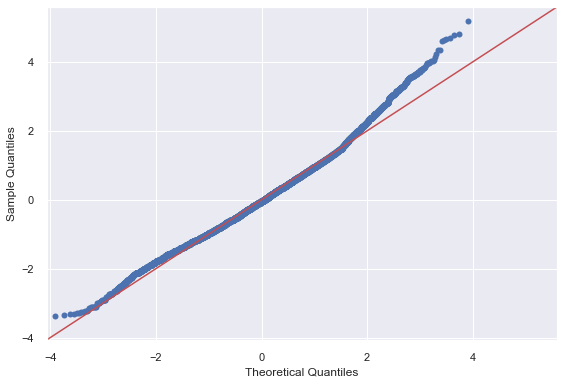

hasrenovated: R2 0.011 , intercept -0.020 , slope 0.584 , p-value 0.000 , JB 1000.113
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasbasement
-------------------------------------------------------------------------------------


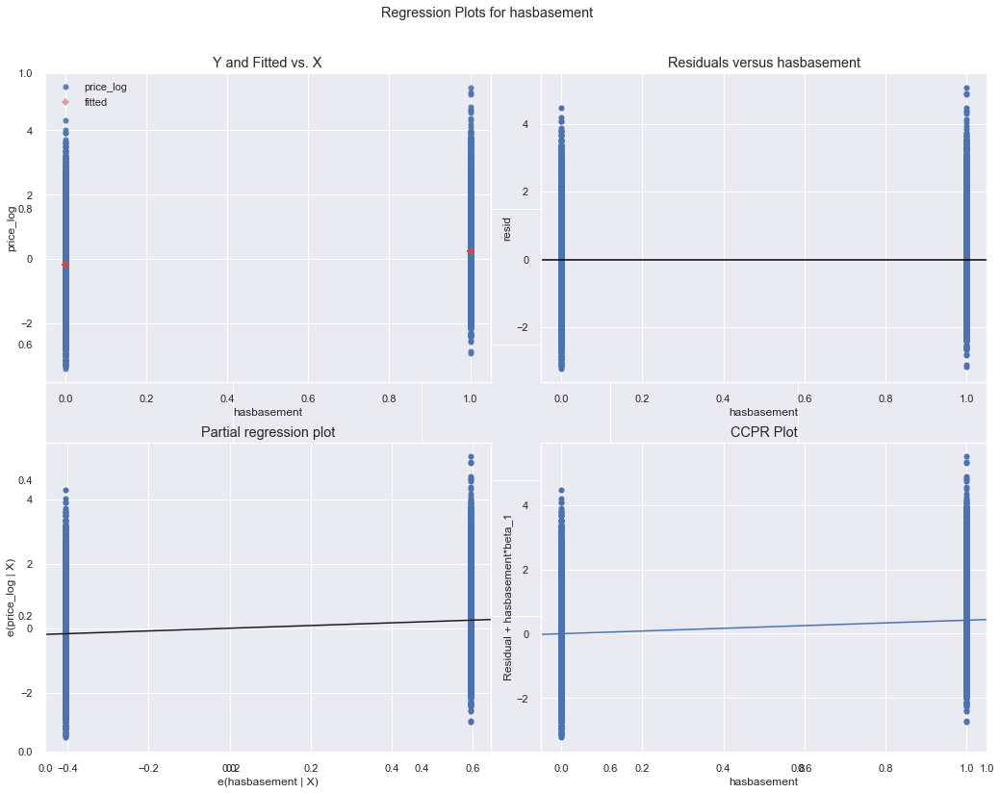

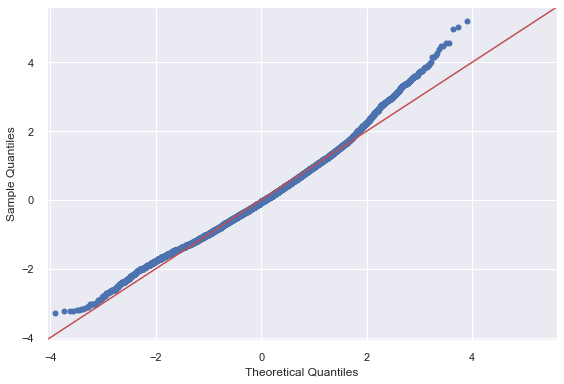

hasbasement: R2 0.043 , intercept -0.171 , slope 0.420 , p-value 0.000 , JB 1029.302
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasbiggerliving
-------------------------------------------------------------------------------------


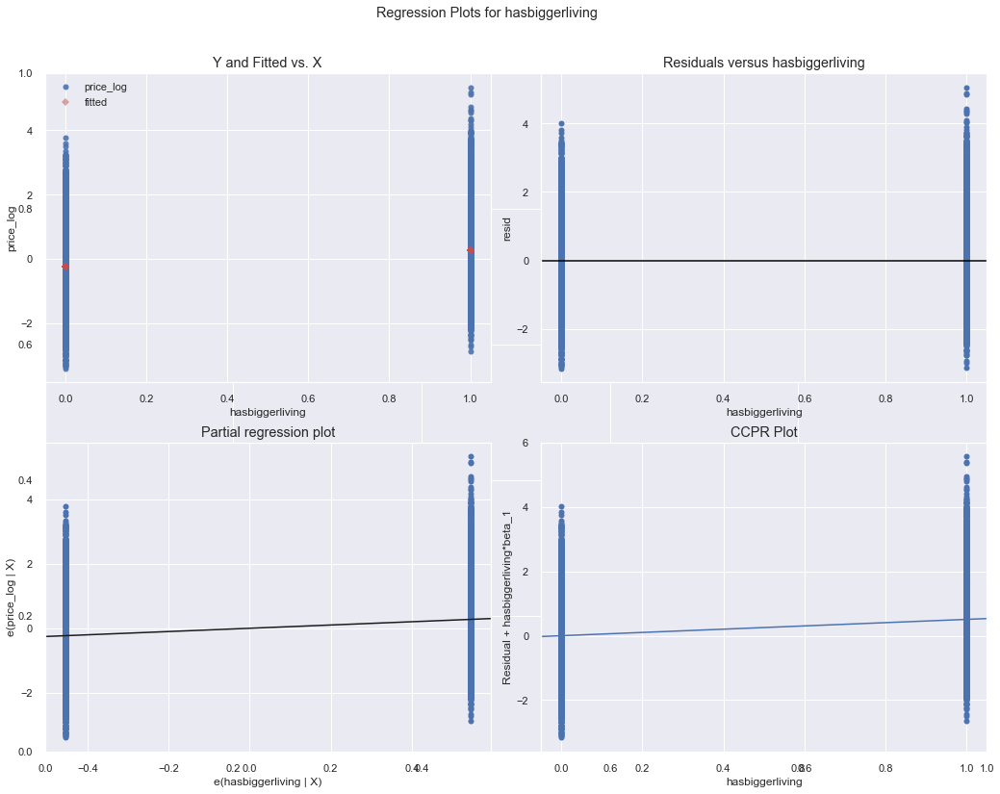

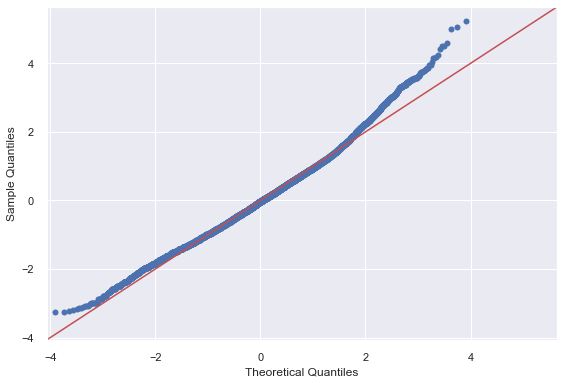

hasbiggerliving: R2 0.064 , intercept -0.231 , slope 0.506 , p-value 0.000 , JB 824.719
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasbiggerlot
-------------------------------------------------------------------------------------


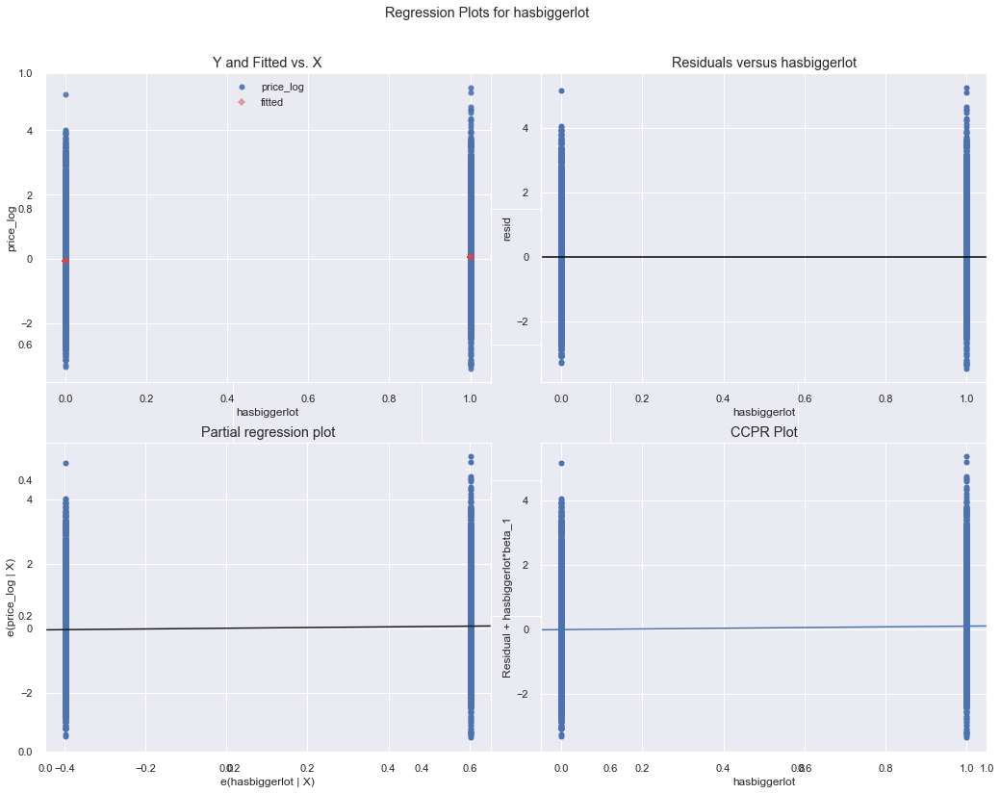

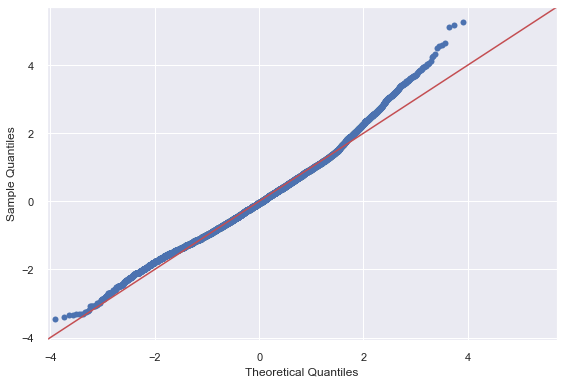

hasbiggerlot: R2 0.003 , intercept -0.043 , slope 0.108 , p-value 0.000 , JB 1053.966
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~mo_sold
-------------------------------------------------------------------------------------


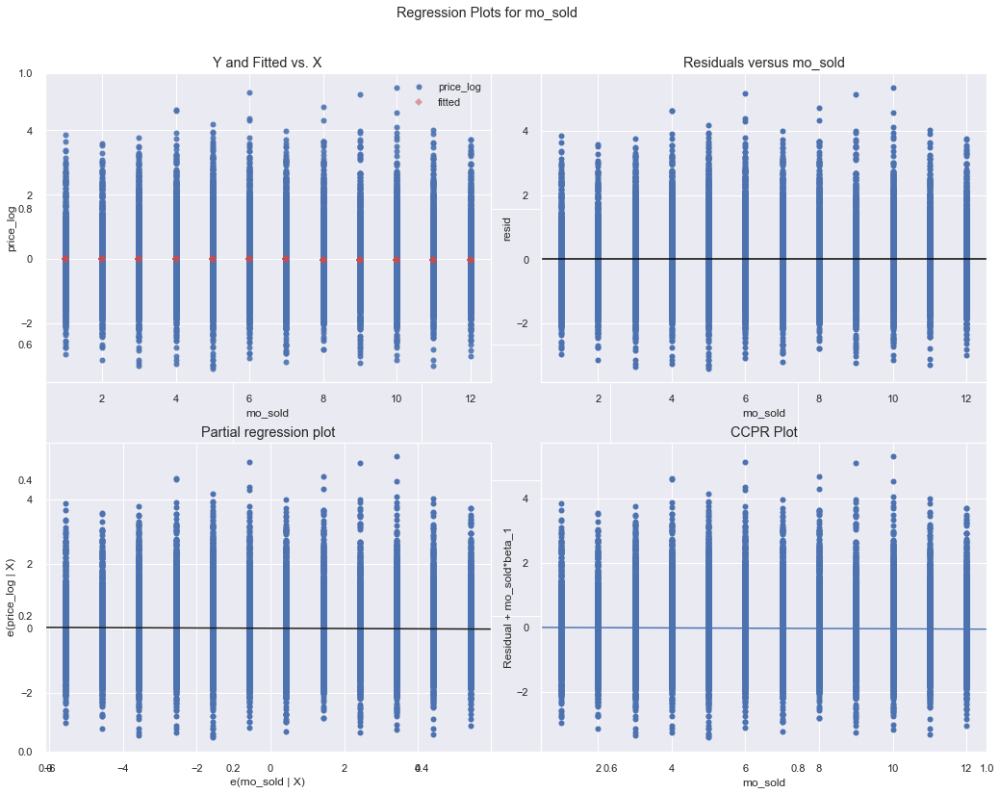

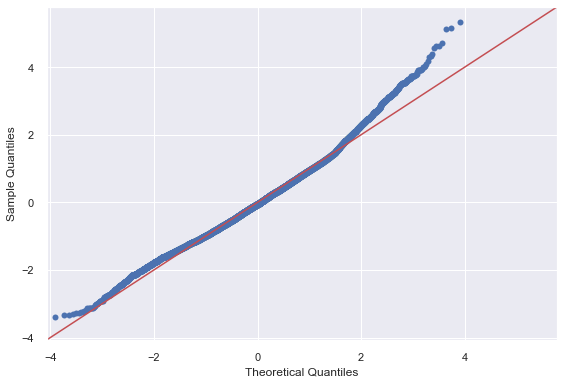

mo_sold: R2 0.000 , intercept 0.028 , slope -0.004 , p-value 0.055 , JB 1099.434
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~lat_cat
-------------------------------------------------------------------------------------


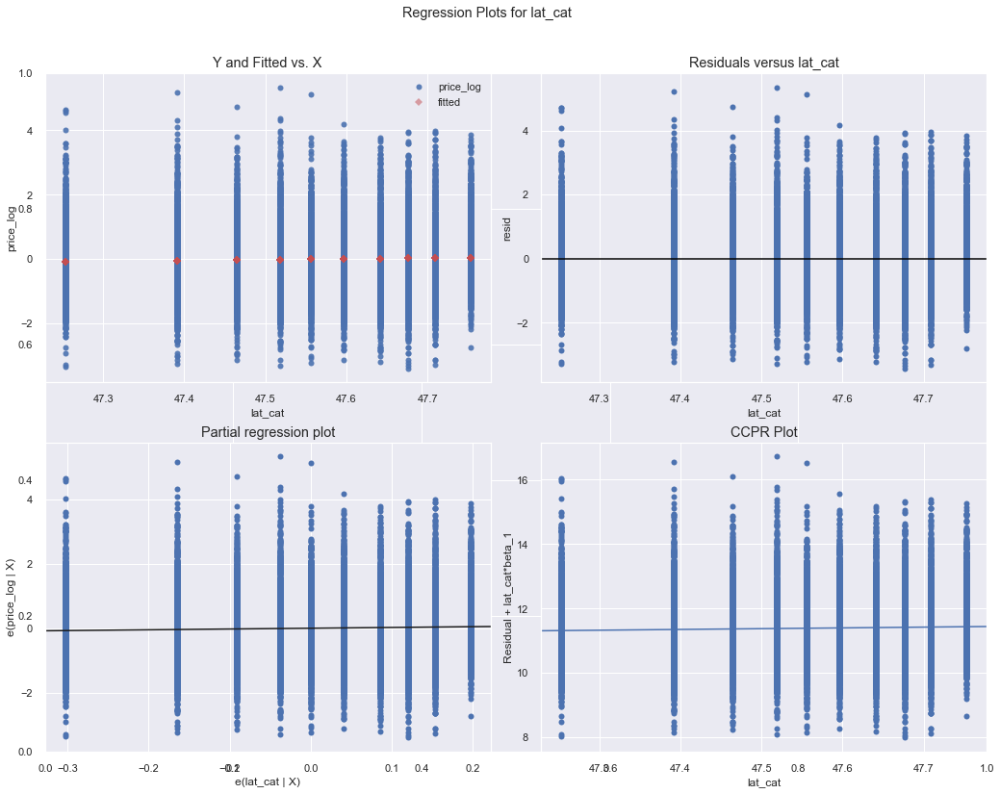

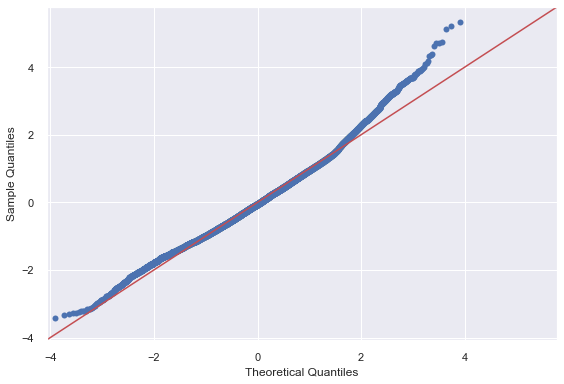

lat_cat: R2 0.001 , intercept -11.390 , slope 0.240 , p-value 0.000 , JB 1110.064
Press Enter to continue...


[['price_log', 1.0, 0.0, 1.0, 0.0, 2485.319],
 ['sqft_lot_log', 0.019, 0.0, 0.138, 0.0, 761.236],
 ['sqft_above_log', 0.343, 0.0, 0.586, 0.0, 139.438],
 ['zipcode_log', 0.002, -0.0, -0.039, 0.0, 1042.738],
 ['yr_sdiff_log', 0.019, 0.0, -0.139, 0.0, 1204.772],
 ['bedrooms', 0.118, -1.25, 0.371, 0.0, 1471.526],
 ['bathrooms', 0.304, -1.517, 0.717, 0.0, 196.538],
 ['floors', 0.096, -0.86, 0.576, 0.0, 1031.279],
 ['waterfront', 0.029, -0.014, 2.083, 0.0, 701.596],
 ['view', 0.119, -0.105, 0.451, 0.0, 436.57],
 ['condition', 0.002, -0.204, 0.06, 0.0, 1086.243],
 ['grade', 0.495, -4.593, 0.6, 0.0, 133.708],
 ['hasrenovated', 0.011, -0.02, 0.584, 0.0, 1000.113],
 ['hasbasement', 0.043, -0.171, 0.42, 0.0, 1029.302],
 ['hasbiggerliving', 0.064, -0.231, 0.506, 0.0, 824.719],
 ['hasbiggerlot', 0.003, -0.043, 0.108, 0.0, 1053.966],
 ['mo_sold', 0.0, 0.028, -0.004, 0.055, 1099.434],
 ['lat_cat', 0.001, -11.39, 0.24, 0.0, 1110.064]]

In [174]:
results = []
for idx, col in enumerate(kc_preprocessed_v2.columns):
    print (f"King Housing DataSet - Regression Analysis and Diagnostics for price_log~{col}")
    print ("-------------------------------------------------------------------------------------")

    f = f'price_log~{col}'
    model = ols(formula=f, data=kc_preprocessed_v2).fit()
    
    fig, axes = plt.subplots(figsize=(15,12))
    fig = sm.graphics.plot_regress_exog(model, col, fig=fig)
    fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True)
    fig.tight_layout()
    plt.show()
    
    print(f'{col}: R2 {model.rsquared:5.3f} , intercept {model.params[0]:5.3f} , slope {model.params[1]:5.3f} , p-value {model.pvalues[1]:5.3f} , JB {sms.jarque_bera(model.resid)[0]:5.3f}')
    results.append([col, round(model.rsquared,3), round(model.params[0],3), round(model.params[1],3), round(model.pvalues[1],3), round(sms.jarque_bera(model.resid)[0],3)])
    input("Press Enter to continue...")
    
results

## multiple linear regression (before dummy creation)
### run a linear model with price as the target variable in statsmodels

In [142]:
X = kc_preprocessed_v2.drop('price_log', axis=1)
Y = kc_preprocessed_v2.price_log
print(Y.head(),'\n')
X.head()

0   -1.401998
1    0.279938
2   -1.799430
3    0.499698
4    0.178434
Name: price_log, dtype: float64 



,sqft_lot_log,sqft_above_log,zipcode_log,yr_sdiff_log,bedrooms,bathrooms,floors,waterfront,view,condition,grade,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,mo_sold,lat_cat
0,-0.388430,-0.753565,1.869128,0.662581,3,1.00,1.0,0.0,0.0,3,7,0.0,0.0,0,0,10,47.2531
1,-0.113241,0.672693,0.879349,0.732145,3,2.25,2.0,0.0,0.0,3,7,1.0,1.0,1,0,12,47.2531
2,0.244475,-1.752954,-0.933519,1.013002,2,1.00,1.0,0.0,0.0,3,6,0.0,0.0,0,1,2,47.2531
3,-0.523914,-1.026835,1.084819,0.466476,4,3.00,1.0,0.0,0.0,5,7,0.0,1.0,1,0,12,47.2531
4,0.008139,0.073515,-0.073585,-0.114701,3,2.00,1.0,0.0,0.0,3,8,0.0,0.0,0,1,2,47.2531


In [144]:
X_int = sm.add_constant(X)
model = sm.OLS(Y,X_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.625
Model:                            OLS   Adj. R-squared:                  0.624
Method:                 Least Squares   F-statistic:                     2113.
Date:                Sun, 19 Jul 2020   Prob (F-statistic):               0.00
Time:                        15:35:29   Log-Likelihood:                -20060.
No. Observations:               21597   AIC:                         4.016e+04
Df Residuals:                   21579   BIC:                         4.030e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -12.2887      1.411     -8.708      0.000     -15.055      -9.523
sqft_lot_log       -0.0812      0.006    -14.589      0.000      -0.092      -0.070
sqft_above_log      0.3434      0.010     35.225      0.000       0.324       0.362
zipcode_log         0.0520      0.005     11.034      0.000       0.043       0.061
yr_sdiff_log        0.2060      0.006     32.401      0.000       0.194       0.218
bedrooms           -0.0316      0.006     -5.398      0.000      -0.043      -0.020
bathrooms           0.0967      0.010     10.090      0.000       0.078       0.116
floors              0.0719      0.012      6.003      0.000       0.048       0.095
waterfront          0.7166      0.055     12.982      0.000       0.608       0.825
view                0.1168      0.006     18.531      0.000       0.104       0.129
condition           0.1354      0.007     19.080      0.000       0.121       0.149
grade               0.4147      0.006     68.681      0.000       0.403       0.427
hasrenovated        0.2128      0.024      8.926      0.000       0.166       0.260
hasbasement         0.3850      0.011     33.725      0.000       0.363       0.407
hasbiggerliving    -0.0700      0.010     -7.054      0.000      -0.089      -0.051
hasbiggerlot        0.0053      0.009      0.591      0.554      -0.012       0.023
mo_sold            -0.0069      0.001     -5.155      0.000      -0.010      -0.004
lat_cat             0.1751      0.030      5.905      0.000       0.117       0.233
==============================================================================
Omnibus:                       32.218   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               38.212
Skew:                           0.021   Prob(JB):                     5.04e-09
Kurtosis:                       3.202   Cond. No.                     1.66e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.66e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### check normality

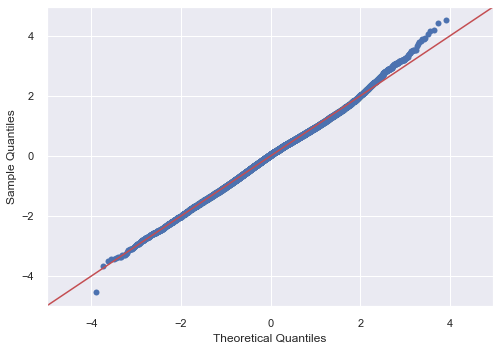

In [147]:
fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True)

### check homoscedasticity

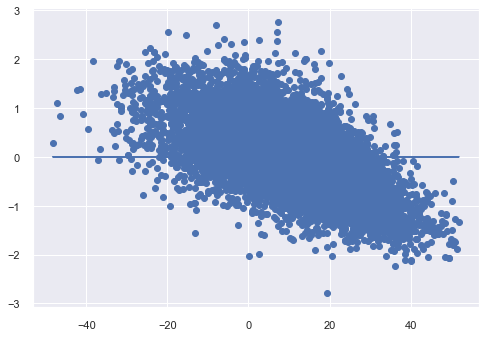

In [149]:
plt.scatter(model.predict(kc_preprocessed_v2[x_cols]), model.resid)
plt.plot(model.predict(kc_preprocessed_v2[x_cols]), [0 for i in range(len(kc_preprocessed_v2))])

### run the same model in scikit-learn

In [145]:
# Importing and initialize the linear regression model class
linreg = LinearRegression()
linreg.fit(X, Y)
linreg.coef_

array([-0.08117186,  0.34335692,  0.05197445,  0.20597567, -0.03156863,
        0.09674356,  0.07188995,  0.71664958,  0.11675236,  0.13540939,
        0.41473213,  0.21279961,  0.38503445, -0.07001499,  0.00529152,
       -0.0069096 ,  0.17505312])

In [146]:
linreg.intercept_

-12.28869947147617

### use Feature ranking with recursive feature elimination: Top 5 features

In [150]:
selector = RFE(linreg, n_features_to_select=5)
selector = selector.fit(X, Y.values.ravel())

In [151]:
selector.support_ 

array([False,  True, False, False, False, False, False,  True, False,
       False,  True,  True,  True, False, False, False, False])

In [152]:
selector.ranking_

array([ 7,  1, 10,  3, 11,  8,  4,  1,  6,  5,  1,  1,  1,  9, 13, 12,  2])

In [153]:
estimators = selector.estimator_
print(estimators.coef_)
print(estimators.intercept_)

[0.26848881 1.22058655 0.41198666 0.40883454 0.47209287]
-3.369021344581174


In [154]:
print(X.columns)
selected_columns = X.columns[selector.support_]
selected_columns

Index(['sqft_lot_log', 'sqft_above_log', 'zipcode_log', 'yr_sdiff_log',
       'bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition',
       'grade', 'hasrenovated', 'hasbasement', 'hasbiggerliving',
       'hasbiggerlot', 'mo_sold', 'lat_cat'],
      dtype='object')


Index(['sqft_above_log', 'waterfront', 'grade', 'hasrenovated', 'hasbasement'], dtype='object')

In [155]:
linreg.fit(X[selected_columns],Y)
yhat = linreg.predict(X[selected_columns])
yhat

array([-0.68743866,  0.57642328, -1.36774996, ..., -0.77902914,
       -0.08405839, -0.77902914])

Now, using the formulas of R-squared and adjusted R-squared below, and your Python/numpy knowledge, compute them and contrast them with the R-squared and adjusted R-squared in your statsmodels output using stepwise selection. Which of the two models would you prefer?

$SS_{residual} = \sum (y - \hat{y})^2 $

$SS_{total} = \sum (y - \bar{y})^2 $

$R^2 = 1- \dfrac{SS_{residual}}{SS_{total}}$

$R^2_{adj}= 1-(1-R^2)\dfrac{n-1}{n-p-1}$

In [156]:
SS_residual = np.dot(Y-yhat,Y-yhat)
SS_total = np.dot(Y-np.mean(Y),Y-np.mean(Y))
R_squared = 1 - (SS_residual / SS_total)
adjusted_R_squared = 1 - (1 - R_squared) * ((len(Y) - 1) / (len(Y) - X[selected_columns].shape[1] - 1))

print(R_squared)
print(adjusted_R_squared)

0.5703418433231522
0.5702423439584454


###  train-test split

In [160]:
# Split the data into training and test sets (assign 20% to test set)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42)
print('X_train:', len(X_train), 'X_test:', len(X_test), 'y_train:', len(y_train), 'y_test:', len(y_test))
print('X_test/X_train:',round(np.divide(len(X_test),len(X_train)),3),'\ty_test/y_train:',round(np.divide(len(y_test),len(y_train)),3))

X_train: 17277 X_test: 4320 y_train: 17277 y_test: 4320
X_test/X_train: 0.25 	y_test/y_train: 0.25


### fit the model
* Apply your model to the train set
* Calculate predictions on training and test sets

Fit a linear regression model and apply the model to make predictions on test set

In [161]:
# Fit the model to train data
linreg.fit(X_train, y_train)
# Calculate predictions on training and test sets
y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

### residuals and MSE
* Calculate training and test residuals
* Calculate the Mean Squared Error (MSE)

A good way to compare overall performance is to compare the mean squarred error for the predicted values on the training and test sets. Calculate the residuals and the mean squared error on the test set

In [168]:
# Calculate residuals
train_residuals = y_hat_train - y_train
test_residuals = y_hat_test - y_test
# Import mean_squared_error from sklearn.metrics
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error (sklearn.metrics):', round(train_mse,3))
print('Test Mean Squarred Error (sklearn.metrics):', round(test_mse,3))
# Calculate training and test MSE
mse_train = np.dot((y_train-y_hat_train).T, y_train-y_hat_train) / np.size(y_train)
mse_test = np.dot((y_test-y_hat_test).T, y_test-y_hat_test) / np.size(y_test)
print('Train Mean Squarred Error (statistics):', round(mse_train,3))
print('Test Mean Squarred Error (statistics):', round(mse_test,3))

Train Mean Squarred Error (sklearn.metrics): 0.374
Test Mean Squarred Error (sklearn.metrics): 0.379
Train Mean Squarred Error (statistics): 0.374
Test Mean Squarred Error (statistics): 0.379


### Cross-Validation using Scikit-Learn

In [167]:
mse = make_scorer(mean_squared_error)

cv_5_results  = np.mean(cross_val_score(linreg, X, Y, cv=5,  scoring=mse))
cv_10_results = np.mean(cross_val_score(linreg, X, Y, cv=10, scoring=mse))
cv_20_results = np.mean(cross_val_score(linreg, X, Y, cv=20, scoring=mse))
cv_40_results = np.mean(cross_val_score(linreg, X, Y, cv=40, scoring=mse))
cv_80_results = np.mean(cross_val_score(linreg, X, Y, cv=80, scoring=mse))
print(f'5-fold:{cv_5_results.mean():.3f}, 10-fold:{cv_10_results.mean():.3f}, 20-fold:{cv_20_results.mean():.3f}, 40-fold:{cv_40_results.mean():.3f}, 80-fold:{cv_80_results.mean():.3f}')

5-fold:0.388, 10-fold:0.386, 20-fold:0.378, 40-fold:0.377, 80-fold:0.376


### predict the house price given various characteristics: will be done later

### conclusion (baseline model w/o dummies):

final features: 

- **'sqft_lot_log'** (continuous), 

- **'sqft_above_log'** (continuous), 

- **'zipcode_log'** (continuous), 

- **'yr_sdiff_log'** (discrete),

- **'bedrooms'** (discrete), 

- **'bathrooms'** (discrete), 

- **'floors'** (discrete), 

- **'waterfront'** (categorical), 

- **'view'** (categorical), 

- **'condition'** (categorical),

- **'grade'** (categorical), 

- **'hasrenovated'** (categorical), 

- **'hasbasement'** (categorical), 

- **'hasbiggerliving'** (categorical),

- **'hasbiggerlot'** (categorical), 

- **'mo_sold'** (continuous), 

- **'lat_cat'** (continuous)

## multiple linear regression (after dummy creation)